In [1]:
import modin.pandas as pd
from Functions import *
from Telescope import *

setTargetList('Ariel_MCS_Known_2024-03-27')
import Ariel

import time

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

import seaborn as sns

from matplotlib import colors

________________________________________________________________
Opening all instruments into dictionary object 'instruments'...

Ariel
  |--> Ariel_MCS_Known_2024-03-27
             |--> Ariel AIRS CH0 1.95-3.9um D=1 R=100 tau=0.18
             |--> Ariel AIRS CH0 1.95-3.9um D=1 R=3 tau=0.18
             |--> Ariel AIRS CH0 1.95-3.9um D=1 R=30 tau=0.18
             |--> Ariel AIRS CH0 1.95-3.9um D=1 R=50 tau=0.18
             |--> Ariel AIRS CH1 3.9-7.8um D=1 R=1 tau=0.18
             |--> Ariel AIRS CH1 3.9-7.8um D=1 R=10 tau=0.18
             |--> Ariel AIRS CH1 3.9-7.8um D=1 R=100 tau=0.18
             |--> Ariel AIRS CH1 3.9-7.8um D=1 R=3 tau=0.18
             |--> Ariel AIRS CH1 3.9-7.8um D=1 R=30 tau=0.18
             |--> Ariel FGS1 0.6-0.8um D=1 R=1 tau=0.17
             |--> Ariel FGS2 0.8-1.1um D=1 R=1 tau=0.25
             |--> Ariel NIRSpec 1.1-1.95um D=1 R=1 tau=0.27
             |--> Ariel NIRSpec 1.1-1.95um D=1 R=10 tau=0.27
             |--> Ariel NIRSpec 1.1-1.95um D=

In [2]:
[x for x in list(plt.rcParams.keys()) if "grid" in x]

['axes.grid',
 'axes.grid.axis',
 'axes.grid.which',
 'axes3d.grid',
 'grid.alpha',
 'grid.color',
 'grid.linestyle',
 'grid.linewidth',
 'keymap.grid',
 'keymap.grid_minor',
 'polaraxes.grid']

In [3]:
custom_rc_params = {
    'xtick.top': True,
    'ytick.right': True,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'xtick.minor.visible': True,
    'ytick.minor.visible': True,
    'xtick.major.size': 8,
    'ytick.major.size': 8,
    'xtick.minor.size': 4,
    'ytick.minor.size': 4,
    'xtick.major.width': 1,
    'ytick.major.width': 1,
    'xtick.minor.width': 0.8,
    'ytick.minor.width': 0.8,
    'axes.grid': True,
    'axes.grid.which': 'both',
    'axes.grid.axis': 'both',
    'grid.alpha': 0.4,
    'grid.linestyle': '--',
    'grid.color': 'gray',
    'figure.figsize': (8, 6),
    'axes.xmargin': 0.05,
    'axes.ymargin': 0.05,
    'font.size': 12,
    'legend.fontsize': 'medium',
    'axes.labelsize': 'large',
    'xtick.labelsize': 'medium',
    'ytick.labelsize': 'medium',
}

def set_grid(fig=None, ax=None):
    if fig is not None:
        for a in fig.get_axes():
            a.grid(which='major', alpha=0.3, linestyle='--', color='gray', zorder=0)
            a.grid(which='minor', alpha=0.1, linestyle='-.', color='gray', zorder=0)
        
    elif ax is not None:
        if ax.__class__ == list:
            for a in ax:
                a.grid(which='major', alpha=0.3, linestyle='--', color='gray', zorder=0)
                a.grid(which='minor', alpha=0.1, linestyle='-.', color='gray', zorder=0)
        else:
            a.grid(which='major', alpha=0.4, linestyle='--', color='gray', zorder=0)
            a.grid(which='minor', alpha=0.1, linestyle='-.', color='gray', zorder=0)
    else:
        raise ValueError('No axes or figure provided')
    


plt.rcParams.update(custom_rc_params)
plt.rcParams['figure.dpi'] = 200

In [5]:
# Ariel.constructArielInstruments("Ariel_MCS_Known_2024-03-27")

In [6]:
# Ariel.getObservationTable("Ariel_MCS_Combined_2024-03-27")

In [7]:
# Ariel.constructArielInstruments("Ariel_MCS_TPCs_2024-03-27")

In [8]:
# pd.read_csv(target_lists + '/Ariel_MCS_Known_2024-03-27.csv').shape[0]

In [9]:
# pd.read_csv(target_lists + '/Ariel_MCS_TPCs_2024-03-27.csv').shape[0]

In [10]:
# setTargetList("Ariel_MCS_Known_2024-03-27")
# Ariel.constructArielInstruments("Ariel_MCS_Known_2024-03-27")

In [11]:
# Ariel.getTargetList()[0]

In [12]:
# Ariel.constructObservationTable("Ariel_MCS_Known_2024-03-27")

In [13]:
# setTargetList("Ariel_MCS_TPCs_2024-03-27")
# Ariel.constructObservationTable("Ariel_MCS_TPCs_2024-03-27")

In [43]:
known = Ariel.getObservationTable("Ariel_MCS_Known_2024-03-27")
tpcs = Ariel.getObservationTable("Ariel_MCS_TPCs_2024-03-27")

known['Known'] = True
tpcs['Known'] = False

known["Tier 1 ESM single PC"] = known["Tier 1 Full Phase Curve SNR"] / np.sqrt(known["Tier 1 Observations Full Phase Curve SNR"])
known["Tier 1 ESM single eclipse"] = known["Tier 1 ESM"] / np.sqrt(known["Tier 1 Observations ESM"])
known["Tier 2 TSM single transit"] = known["Tier 2 TSM"] / np.sqrt(known["Tier 2 Observations TSM"])
known["Time to Tier 2 TSM [hrs]"] = known["Tier 2 Observations TSM"] * known["Transit Duration [hrs]"] * 3
known["Rp/Rs scaled"] = known["Rp/Rs"]**2 * 1e3

tpcs.rename(columns={"Transit Duration [hr]": "Transit Duration [hrs]"}, inplace=True)
tpcs["Tier 1 ESM single PC"] = tpcs["Tier 1 Full Phase Curve SNR"] / np.sqrt(tpcs["Tier 1 Observations Full Phase Curve SNR"])
tpcs["Tier 1 ESM single eclipse"] = tpcs["Tier 1 ESM"] / np.sqrt(tpcs["Tier 1 Observations ESM"])
tpcs["Tier 2 TSM single transit"] = tpcs["Tier 2 TSM"] / np.sqrt(tpcs["Tier 2 Observations TSM"])
tpcs["Time to Tier 2 TSM [hrs]"] = tpcs["Tier 2 Observations TSM"] * tpcs["Transit Duration [hrs]"] * 3
tpcs["Rp/Rs scaled"] = tpcs["Rp/Rs"]**2 * 1e3

combined = pd.concat([known, tpcs])

In [44]:
# TSM plotsz

In [45]:
def plot4axes(x1, y1, x2, y2, knowncolor='blue', tpcscolor='grey', ks=15, ts=15, fmt='.', tpcalpha=0.7, knowndf=known, tpcsdf=tpcs):
    fig, ax = plt.subplots(2, 2, figsize=(10, 7), sharex='col', sharey='row', tight_layout=True)

    set_grid(fig)

    ax[0,0].scatter(tpcsdf[x1], tpcsdf[y1], c=tpcscolor, alpha=tpcalpha, label='TPCs', marker=fmt, s=ts, zorder=2)
    ax[0,0].scatter(knowndf[x1], knowndf[y1], c=knowncolor, label='Known', marker=fmt, s=ks, zorder=2)
    ax[0,0].set_yscale('log')
    ax[0,0].set_xscale('log')
    ax[0,0].set_ylabel(y1)
    ax[0,0].legend(fancybox=False, framealpha=1)

    ax[0,1].scatter(tpcsdf[x2], tpcsdf[y1], c=tpcscolor, alpha=tpcalpha, label='TPCs', marker=fmt, s=ts, zorder=2)
    ax[0,1].scatter(knowndf[x2], knowndf[y1], c=knowncolor, label='Known', marker=fmt, s=ks, zorder=2)
    ax[0,1].set_yscale('log')
    ax[0,1].set_xscale('log')


    ax[1,0].scatter(tpcsdf[x1], tpcsdf[y2], c=tpcscolor, alpha=tpcalpha, label='TPCs', marker=fmt, s=ts, zorder=2)
    ax[1,0].scatter(knowndf[x1], knowndf[y2], c=knowncolor, label='Known', marker=fmt, s=ks, zorder=2)
    ax[1,0].set_yscale('log')
    ax[1,0].set_xscale('log')
    ax[1,0].set_ylabel(y2)
    ax[1,0].set_xlabel(x1)

    ax[1,1].scatter(tpcsdf[x2], tpcsdf[y2], c=tpcscolor, alpha=tpcalpha, label='TPCs', marker=fmt, s=ts, zorder=2)
    ax[1,1].scatter(knowndf[x2], knowndf[y2], c=knowncolor, label='Known', marker=fmt, s=ks, zorder=2)
    ax[1,1].set_yscale('log')
    ax[1,1].set_xscale('log')
    ax[1,1].set_xlabel(x2)

    return fig, ax

In [46]:
Jk = known.copy()
Jk = Jk[Jk["Planet Mass [Mjup]"] > 0.5]

Jt = tpcs.copy()
Jt = Jt[Jt["Planet Mass [Mjup]"] > 0.5]

print("Number of jovian planets in known: ", Jk.shape[0])
print("Number of jovian planets in TPCs: ", Jt.shape[0])

Number of jovian planets in known:  357
Number of jovian planets in TPCs:  1374


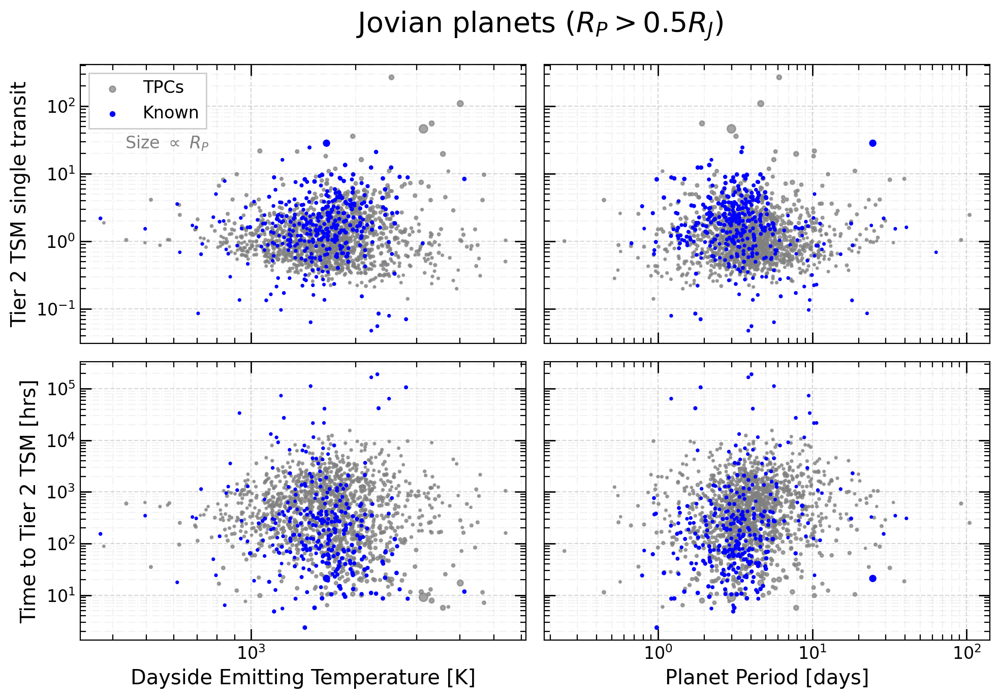

In [47]:
fig, ax = plot4axes(x1="Dayside Emitting Temperature [K]", 
          y1="Tier 2 TSM single transit", 
          x2="Planet Period [days]", 
          y2="Time to Tier 2 TSM [hrs]",
          knowncolor='blue', tpcscolor='grey',
          knowndf=Jk, tpcsdf=Jt,
          ts=Jt["Planet Radius [Rjup]"]*10, ks=Jk["Planet Radius [Rjup]"]*10,)

fig.suptitle(r"         Jovian planets ($R_P > 0.5 R_J$)", fontsize=20)

ax[0,0].text(0.1, 0.7, r'Size $\propto \ R_P$', transform=ax[0,0].transAxes, fontsize=12, color='grey')
# ax0xlim = ax[0,0].get_xlim()
# ax0ylim = ax[0,0].get_ylim()
# ax1xlim = ax[0,1].get_xlim()
# ax1ylim = ax[0,1].get_ylim()
# ax2xlim = ax[1,0].get_xlim()
# ax2ylim = ax[1,0].get_ylim()
# ax3xlim = ax[1,1].get_xlim()
# ax3ylim = ax[1,1].get_ylim()

# xmin,xmax = ax[0,0].get_xlim()
# ymin,ymax = ax[0,0].get_ylim()
# ax[0,0].set_xlim(xmin, xmax)
# ax[0,0].set_ylim(ymin, ymax)
# ax[0,0].fill_betweenx([ymin, ymax], xmin, 1e3, color='grey', alpha=0.1)
# ax[0,0].fill_betweenx([ymin, ymax], 1e3, 2e3, color='orange', alpha=0.1)
# ax[0,0].fill_betweenx([ymin, ymax], 2e3, xmax, color='red', alpha=0.1)
# low_temp = Jt[Jt["Dayside Emitting Temperature [K]"] < 1e3].shape[0] + Jk[Jk["Dayside Emitting Temperature [K]"] < 1e3].shape[0]
# ax[0,0].text(0.1, 0.75, f"{low_temp} targets", transform=ax[0,0].transAxes)

# mid_temp = Jt[(Jt["Dayside Emitting Temperature [K]"] > 1e3) & 
#               (Jt["Dayside Emitting Temperature [K]"] < 2e3)].shape[0] + Jk[(Jk["Dayside Emitting Temperature [K]"] > 1e3) &
#                                                                             (Jk["Dayside Emitting Temperature [K]"] < 2e3)].shape[0]
# ax[0,0].text(0.4, 0.75, f"{mid_temp} targets", transform=ax[0,0].transAxes)

# high_temp = Jt[Jt["Dayside Emitting Temperature [K]"] > 2e3].shape[0] + Jk[Jk["Dayside Emitting Temperature [K]"] > 2e3].shape[0]
# ax[0,0].text(0.7, 0.75, f"{high_temp} targets", transform=ax[0,0].transAxes)


# xmin,xmax = ax[1,0].get_xlim()
# ymin,ymax = ax[1,0].get_ylim()
# ax[1,0].set_xlim(xmin, xmax)
# ax[1,0].set_ylim(ymin, ymax)
# ax[1,0].fill_betweenx([ymin, ymax], xmin, 1e3, color='grey', alpha=0.1)
# ax[1,0].fill_betweenx([ymin, ymax], 1e3, 2e3, color='orange', alpha=0.1)
# ax[1,0].fill_betweenx([ymin, ymax], 2e3, xmax, color='red', alpha=0.1)


# xmin,xmax = ax[0,1].get_xlim()
# ymin,ymax = ax[0,1].get_ylim()
# ax[0,1].set_xlim(xmin, xmax)
# ax[0,1].set_ylim(ymin, ymax)
# ax[0,1].fill_betweenx([ymin, ymax], xmin, 1e0, color='grey', alpha=0.1)
# ax[0,1].fill_betweenx([ymin, ymax], 1e0, 1e1, color='orange', alpha=0.1)
# ax[0,1].fill_betweenx([ymin, ymax], 1e1, xmax, color='red', alpha=0.1)

# sub_day = Jt[Jt["Planet Period [days]"] < 1e0].shape[0] + Jk[Jk["Planet Period [days]"] < 1e0].shape[0]
# ax[0,1].text(0.05, 0.75, f"{sub_day} targets", transform=ax[0,1].transAxes)

# sub_10days = Jt[(Jt["Planet Period [days]"] > 1e0) & 
#               (Jt["Planet Period [days]"] < 1e1)].shape[0] + Jk[(Jk["Planet Period [days]"] > 1e0) &
#                                                                             (Jk["Planet Period [days]"] < 1e1)].shape[0]
# ax[0,1].text(0.33, 0.75, f"{sub_10days} targets", transform=ax[0,1].transAxes)

# more_days = Jt[Jt["Planet Period [days]"] > 1e1].shape[0] + Jk[Jk["Planet Period [days]"] > 1e1].shape[0]
# ax[0,1].text(0.7, 0.75, f"{more_days} targets", transform=ax[0,1].transAxes)

# # xmin,xmax = ax[1,1].get_xlim()
# # ymin,ymax = ax[1,1].get_ylim()
# # ax[1,1].set_xlim(xmin, xmax)
# # ax[1,1].set_ylim(ymin, ymax)
# # ax[1,1].fill_betweenx([ymin, ymax], xmin, 1e0, color='grey', alpha=0.1)
# # ax[1,1].fill_betweenx([ymin, ymax], 1e0, 1e1, color='orange', alpha=0.1)
# # ax[1,1].fill_betweenx([ymin, ymax], 1e1, xmax, color='red', alpha=0.1)

plt.show()

In [48]:
# def plot_regions_with_counts(
#     df,
#     x1, y1, x2, y2,
#     region_bounds, fig=None, ax=None, 
#     c='red'):
    
#     if fig is None or ax is None:
#         fig, ax = plt.subplots(2, 2, figsize=(10, 7), sharex='col', sharey='row', tight_layout=True)
    
    
    
#     # Helper to count targets in a region
#     def count_targets(df, x_col, y_col, xlim, ylim):
#         return df[
#             (df[x_col] >= xlim[0]) & (df[x_col] <= xlim[1]) &
#             (df[y_col] >= ylim[0]) & (df[y_col] <= ylim[1])
#         ].shape[0]
    
#     # Helper to draw regions and annotate counts
#     def draw_region(ax, x_col, y_col, xlim, ylim, df):
        
#         count = count_targets(df, x_col, y_col, xlim, ylim)
        
#         ax.fill_between(
#             (xlim[0], xlim[1]),
#             ylim[0],
#             ylim[1],
#             alpha= np.arctan(count / df.shape[0] + 1/4)/2,
#             color=c
#         )
        
        
#         ax.text(
#             (xlim[0] + xlim[1]) / 2,
#             (ylim[0] + ylim[1]) / 2,
#             f"{count}",
#             color='black',
#             fontsize=10,
#             ha='center',
#             va='center'
#         )

#     def plot_subplot(ax, x_col, y_col, df, bounds):
#         ax.set_xscale('log')
#         ax.set_yscale('log')
        
#         for xlim in bounds[x_col]:
#             for ylim in bounds[y_col]:
#                 draw_region(ax, x_col, y_col, xlim, ylim, df)

#     plot_subplot(ax[0, 0], x1, y1, df, region_bounds)
#     plot_subplot(ax[0, 1], x2, y1, df, region_bounds)
#     plot_subplot(ax[1, 0], x1, y2, df, region_bounds)
#     plot_subplot(ax[1, 1], x2, y2, df, region_bounds)
    
#     ax[0,0].set_ylabel(y1)
#     ax[1,0].set_ylabel(y2)
#     ax[1,0].set_xlabel(x1)
#     ax[1,1].set_xlabel(x2)

#     return fig, ax


In [49]:
# Jkt = pd.concat([Jk, Jt])

# colors = sns.color_palette('pastel')

# region_bounds = {
#     'Dayside Emitting Temperature [K]': [(ax0xlim[0], 1e3), (1e3, 2e3), (2e3, ax0xlim[1])],
#     'Tier 2 TSM single transit': [(ax0ylim[0], 1), (1, 7), (7, ax0ylim[1])],
#     'Planet Period [days]': [(ax1xlim[0], 1), (1, 10), (10, ax1xlim[1])],
#     'Time to Tier 2 TSM [hrs]': [(ax3ylim[0], 24), (24, 72), (72, 1e3), (1e3, 1e4), (1e4, ax3ylim[1])]
# }

# fig, ax = plt.subplots(2, 2, figsize=(10, 7), sharex='col', sharey='row', tight_layout=True)

# ax[0,0].set_xlim(ax0xlim)
# ax[0,0].set_ylim(ax0ylim)
# ax[0,1].set_xlim(ax1xlim)
# ax[0,1].set_ylim(ax1ylim)
# ax[1,0].set_xlim(ax2xlim)
# ax[1,0].set_ylim(ax2ylim)
# ax[1,1].set_xlim(ax3xlim)
# ax[1,1].set_ylim(ax3ylim)

# plot_regions_with_counts(
#     Jkt,
#     x1="Dayside Emitting Temperature [K]", 
#     y1="Tier 2 TSM single transit", 
#     x2="Planet Period [days]", 
#     y2="Time to Tier 2 TSM [hrs]",
#     region_bounds=region_bounds, 
#     fig=fig, 
#     ax=ax
# )

# for a in ax.flatten():
#     a.grid(which='both', alpha=0.2, linestyle='--', color='gray', zorder=0)
    
# fig.suptitle("Jovian planet count in parameter space", fontsize=20)


# plt.show()


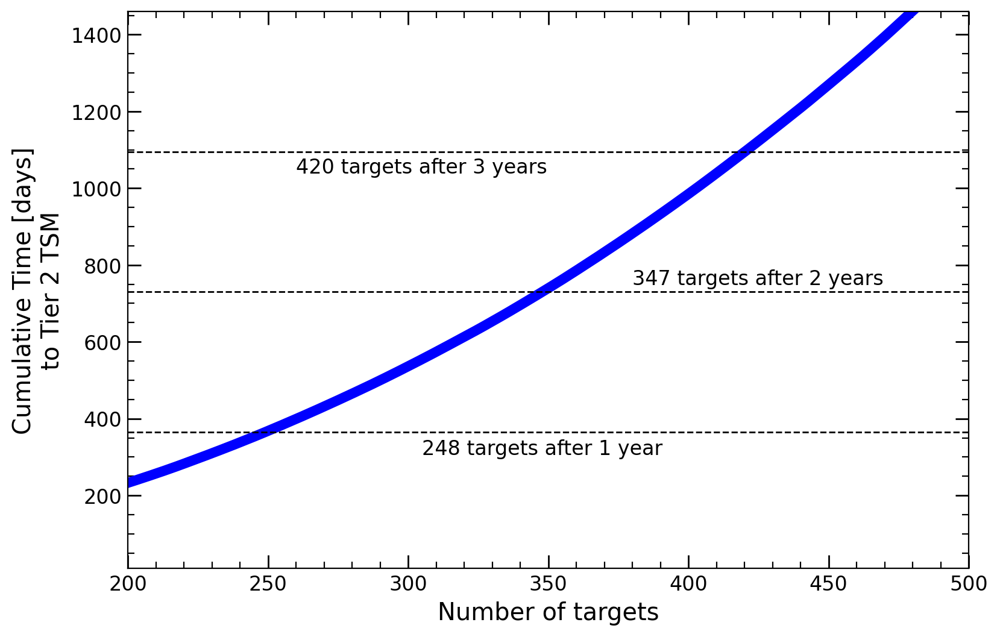

In [50]:
# cumulative plot for Tier 2 jovian planets
combined_Js = pd.concat([Jk, Jt])
TimetoT2sort = combined_Js.sort_values("Time to Tier 2 TSM [hrs]", ascending=True)
TimetoT2sort["Cum Sum Time to T2 [days]"] = TimetoT2sort["Time to Tier 2 TSM [hrs]"].cumsum()/24
cumulative_counts = np.arange(1, len(TimetoT2sort) + 1)

fig, ax = plt.subplots(figsize=(9, 6))

plt.plot(cumulative_counts, TimetoT2sort["Cum Sum Time to T2 [days]"], marker='', linewidth=6, color='blue')
# plt.yscale('log')
# plt.xscale('log')

plt.axhline(365, color='black', linestyle='--', linewidth=1)
plt.axhline(365*2, color='black', linestyle='--', linewidth=1)
plt.axhline(365*3, color='black', linestyle='--', linewidth=1)

plt.text(0.35, 0.205, f'{TimetoT2sort[TimetoT2sort["Cum Sum Time to T2 [days]"]<365].shape[0]} targets after 1 year', transform=plt.gca().transAxes, fontsize=12, color='black')
plt.text(0.6, 0.51, f'{TimetoT2sort[TimetoT2sort["Cum Sum Time to T2 [days]"]<2*365].shape[0]} targets after 2 years', transform=plt.gca().transAxes, fontsize=12, color='black')
plt.text(0.2, 0.71, f'{TimetoT2sort[TimetoT2sort["Cum Sum Time to T2 [days]"]<3*365].shape[0]} targets after 3 years', transform=plt.gca().transAxes, fontsize=12, color='black')

plt.xlim(200, 500)
plt.ylim(10, 4*365)

plt.xlabel("Number of targets")
plt.ylabel("Cumulative Time [days]\nto Tier 2 TSM")

plt.grid(which='major', alpha=0, linestyle='--', color='gray', zorder=0)
plt.grid(which='minor', alpha=0, linestyle='-.', color='gray', zorder=0)

plt.show()

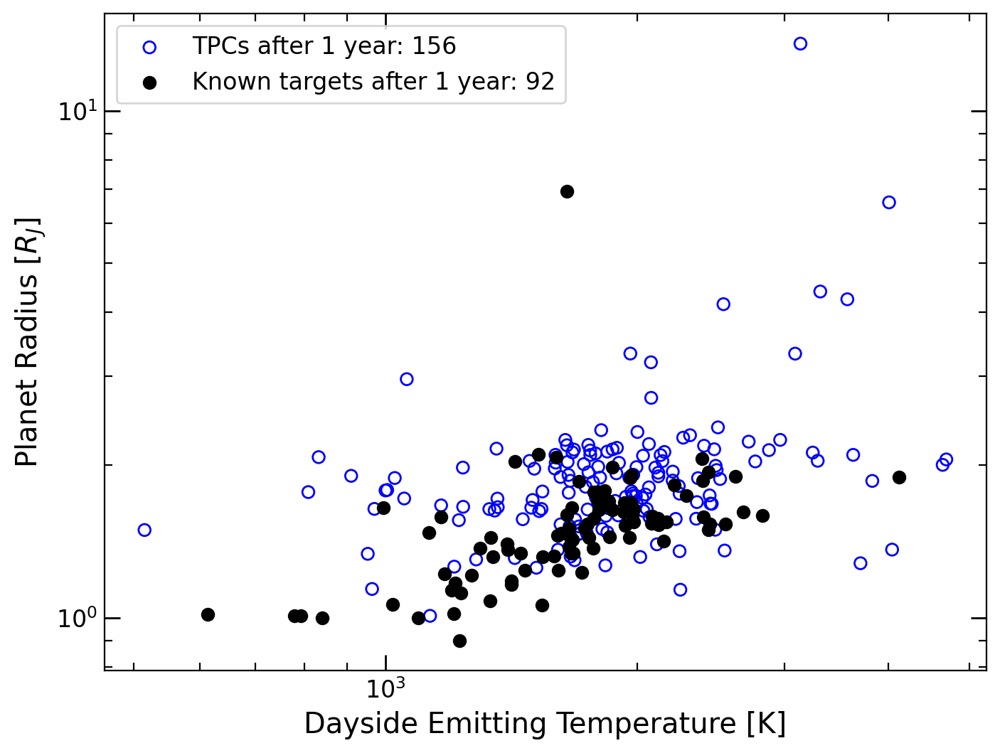

In [51]:
oneyrk = TimetoT2sort[(TimetoT2sort["Cum Sum Time to T2 [days]"]<365) & (TimetoT2sort["Known"] == True)]
oneyrT = TimetoT2sort[(TimetoT2sort["Cum Sum Time to T2 [days]"]<365) & (TimetoT2sort["Known"] == False)]

plt.scatter(oneyrT["Dayside Emitting Temperature [K]"], oneyrT["Planet Radius [Rjup]"], marker='o', facecolor='none', edgecolors='blue', label=f'TPCs after 1 year: {oneyrT.shape[0]}')
plt.scatter(oneyrk["Dayside Emitting Temperature [K]"], oneyrk["Planet Radius [Rjup]"], marker='o', color='black', label=f"Known targets after 1 year: {oneyrk.shape[0]}")

plt.xscale('log')
plt.yscale('log')
plt.ylabel(r"Planet Radius [$R_J$]")
plt.xlabel("Dayside Emitting Temperature [K]")
plt.grid(which='both', alpha=0)
plt.legend()
plt.show()

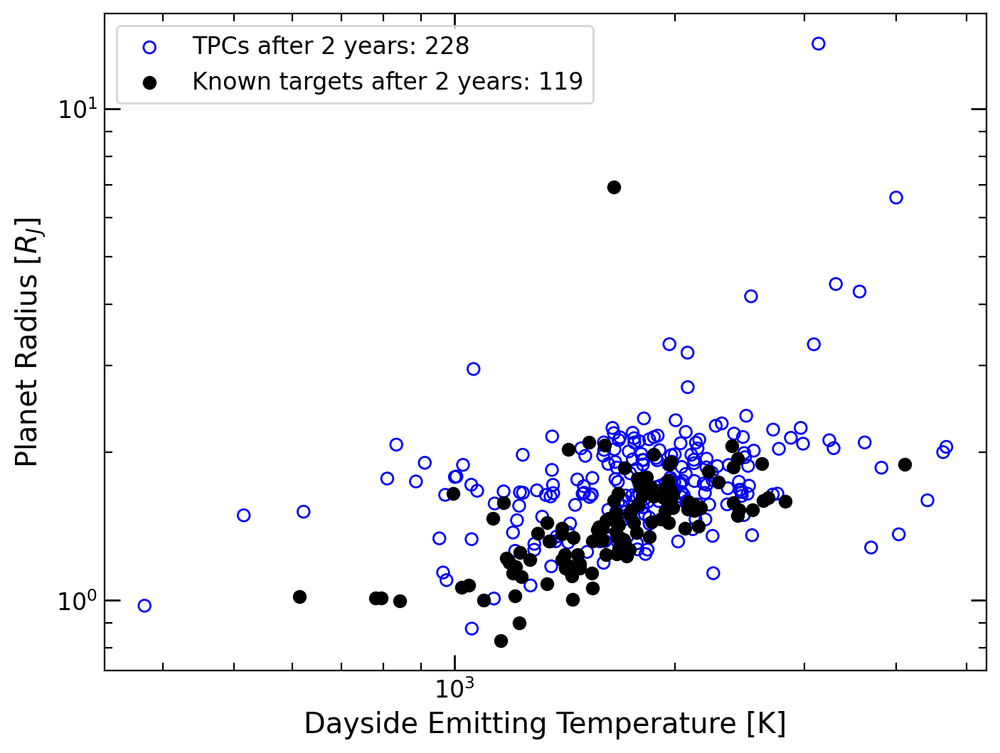

In [52]:
twoyrk = TimetoT2sort[(TimetoT2sort["Cum Sum Time to T2 [days]"]<2*365) & (TimetoT2sort["Known"] == True)]
twoyrT = TimetoT2sort[(TimetoT2sort["Cum Sum Time to T2 [days]"]<2*365) & (TimetoT2sort["Known"] == False)]

plt.scatter(twoyrT["Dayside Emitting Temperature [K]"], twoyrT["Planet Radius [Rjup]"], marker='o', facecolor='none', edgecolors='blue', label=f'TPCs after 2 years: {twoyrT.shape[0]}')
plt.scatter(twoyrk["Dayside Emitting Temperature [K]"], twoyrk["Planet Radius [Rjup]"], marker='o', color='black', label=f"Known targets after 2 years: {twoyrk.shape[0]}")

plt.xscale('log')
plt.yscale('log')
plt.ylabel(r"Planet Radius [$R_J$]")
plt.xlabel("Dayside Emitting Temperature [K]")
plt.grid(which='both', alpha=0)
plt.legend()
plt.show()

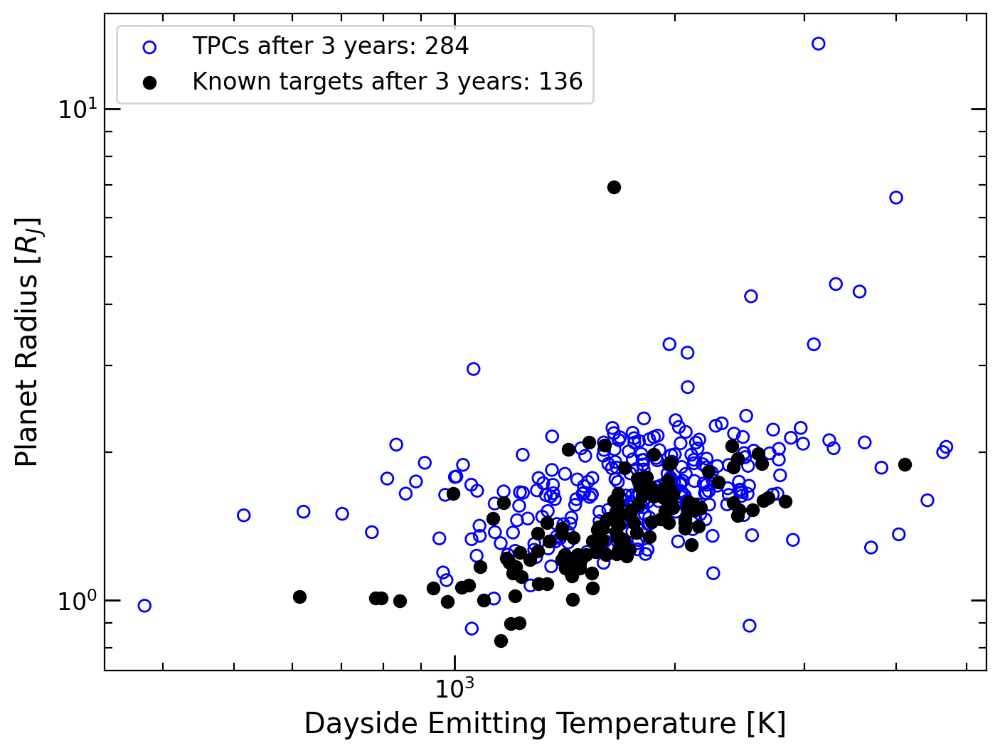

In [53]:
threeyrk = TimetoT2sort[(TimetoT2sort["Cum Sum Time to T2 [days]"]<3*365) & (TimetoT2sort["Known"] == True)]
threeyrT = TimetoT2sort[(TimetoT2sort["Cum Sum Time to T2 [days]"]<3*365) & (TimetoT2sort["Known"] == False)]

plt.scatter(threeyrT["Dayside Emitting Temperature [K]"], threeyrT["Planet Radius [Rjup]"], marker='o', facecolor='none', edgecolors='blue', label=f'TPCs after 3 years: {threeyrT.shape[0]}')
plt.scatter(threeyrk["Dayside Emitting Temperature [K]"], threeyrk["Planet Radius [Rjup]"], marker='o', color='black', label=f"Known targets after 3 years: {threeyrk.shape[0]}")

plt.xscale('log')
plt.yscale('log')
plt.ylabel(r"Planet Radius [$R_J$]")
plt.xlabel("Dayside Emitting Temperature [K]")
plt.grid(which='both', alpha=0)
plt.legend()
plt.show()

In [54]:
# region_bounds = {
#     'Dayside Emitting Temperature [K]': [(ax0xlim[0], 1e3), (1e3, 2e3), (2e3, ax0xlim[1])],
#     'Tier 2 TSM single transit': [(ax0ylim[0], 1), (1, 7), (7, ax0ylim[1])],
#     'Planet Period [days]': [(ax1xlim[0], 1), (1, 10), (10, ax1xlim[1])],
#     'Time to Tier 2 TSM [hrs]': [(ax3ylim[0], 24), (24, 72), (72, 1e3), (1e3, 1e4), (1e4, ax3ylim[1])]
# }

# fig, ax = plt.subplots(2, 2, figsize=(10, 7), sharex='col', sharey='row', tight_layout=True)

# ax[0,0].set_xlim(ax0xlim)
# ax[0,0].set_ylim(ax0ylim)
# ax[0,1].set_xlim(ax1xlim)
# ax[0,1].set_ylim(ax1ylim)
# ax[1,0].set_xlim(ax2xlim)
# ax[1,0].set_ylim(ax2ylim)
# ax[1,1].set_xlim(ax3xlim)
# ax[1,1].set_ylim(ax3ylim)

# plot_regions_with_counts(
#     TimetoT2sort[TimetoT2sort["Cum Sum Time to T2 [days]"] < 365],
#     x1="Dayside Emitting Temperature [K]", 
#     y1="Tier 2 TSM single transit", 
#     x2="Planet Period [days]", 
#     y2="Time to Tier 2 TSM [hrs]",
#     region_bounds=region_bounds, 
#     fig=fig, 
#     ax=ax
# )

# for a in ax.flatten():
#     a.grid(which='both', alpha=0.2, linestyle='--', color='gray', zorder=0)
    
# fig.suptitle("         Jovian planets after 1 year", fontsize=20)


# plt.show()


In [55]:
# region_bounds = {
#     'Dayside Emitting Temperature [K]': [(ax0xlim[0], 1e3), (1e3, 2e3), (2e3, ax0xlim[1])],
#     'Tier 2 TSM single transit': [(ax0ylim[0], 1), (1, 7), (7, ax0ylim[1])],
#     'Planet Period [days]': [(ax1xlim[0], 1), (1, 10), (10, ax1xlim[1])],
#     'Time to Tier 2 TSM [hrs]': [(ax3ylim[0], 24), (24, 72), (72, 1e3), (1e3, 1e4), (1e4, ax3ylim[1])]
# }

# fig, ax = plt.subplots(2, 2, figsize=(10, 7), sharex='col', sharey='row', tight_layout=True)

# ax[0,0].set_xlim(ax0xlim)
# ax[0,0].set_ylim(ax0ylim)
# ax[0,1].set_xlim(ax1xlim)
# ax[0,1].set_ylim(ax1ylim)
# ax[1,0].set_xlim(ax2xlim)
# ax[1,0].set_ylim(ax2ylim)
# ax[1,1].set_xlim(ax3xlim)
# ax[1,1].set_ylim(ax3ylim)

# plot_regions_with_counts(
#     TimetoT2sort[TimetoT2sort["Cum Sum Time to T2 [days]"] < 2*365],
#     x1="Dayside Emitting Temperature [K]", 
#     y1="Tier 2 TSM single transit", 
#     x2="Planet Period [days]", 
#     y2="Time to Tier 2 TSM [hrs]",
#     region_bounds=region_bounds, 
#     fig=fig, 
#     ax=ax
# )

# for a in ax.flatten():
#     a.grid(which='both', alpha=0.2, linestyle='--', color='gray', zorder=0)
    
# fig.suptitle("         Jovian planets after 2 years", fontsize=20)


# plt.show()


In [56]:
# region_bounds = {
#     'Dayside Emitting Temperature [K]': [(ax0xlim[0], 1e3), (1e3, 2e3), (2e3, ax0xlim[1])],
#     'Tier 2 TSM single transit': [(ax0ylim[0], 1), (1, 7), (7, ax0ylim[1])],
#     'Planet Period [days]': [(ax1xlim[0], 1), (1, 10), (10, ax1xlim[1])],
#     'Time to Tier 2 TSM [hrs]': [(ax3ylim[0], 24), (24, 72), (72, 1e3), (1e3, 1e4), (1e4, ax3ylim[1])]
# }

# fig, ax = plt.subplots(2, 2, figsize=(10, 7), sharex='col', sharey='row', tight_layout=True)

# ax[0,0].set_xlim(ax0xlim)
# ax[0,0].set_ylim(ax0ylim)
# ax[0,1].set_xlim(ax1xlim)
# ax[0,1].set_ylim(ax1ylim)
# ax[1,0].set_xlim(ax2xlim)
# ax[1,0].set_ylim(ax2ylim)
# ax[1,1].set_xlim(ax3xlim)
# ax[1,1].set_ylim(ax3ylim)

# plot_regions_with_counts(
#     TimetoT2sort[TimetoT2sort["Cum Sum Time to T2 [days]"] < 3*365],
#     x1="Dayside Emitting Temperature [K]", 
#     y1="Tier 2 TSM single transit", 
#     x2="Planet Period [days]", 
#     y2="Time to Tier 2 TSM [hrs]",
#     region_bounds=region_bounds, 
#     fig=fig, 
#     ax=ax
# )

# for a in ax.flatten():
#     a.grid(which='both', alpha=0.2, linestyle='--', color='gray', zorder=0)
    
# fig.suptitle("         Jovian planets after 3 years", fontsize=20)


# plt.show()


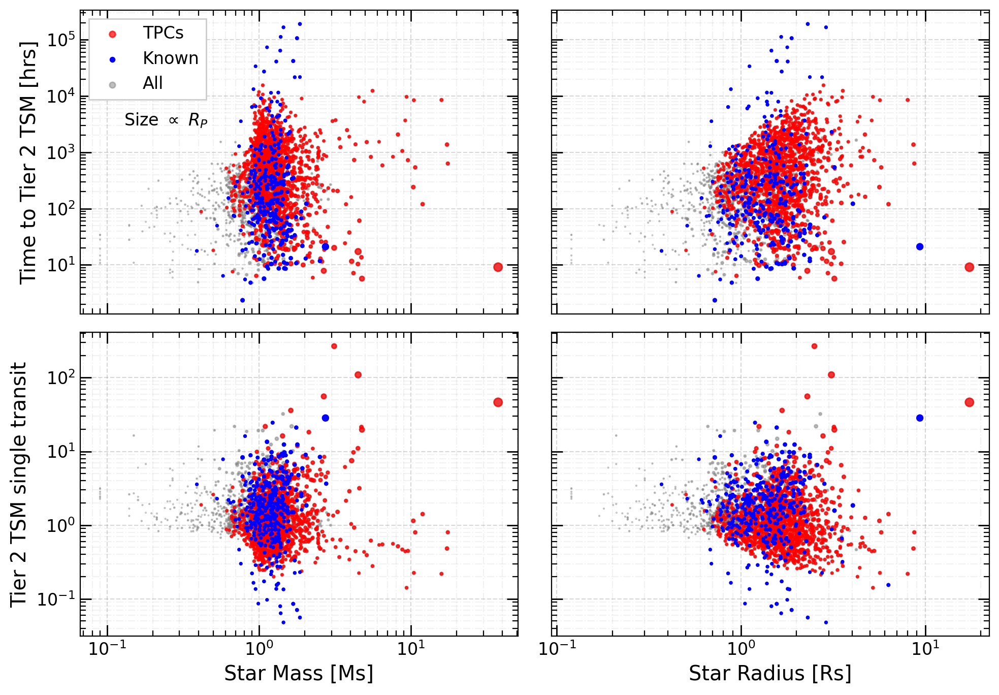

In [57]:
fig, ax = plot4axes(x1="Star Mass [Ms]", 
          y1="Time to Tier 2 TSM [hrs]", 
          x2="Star Radius [Rs]",
          y2="Tier 2 TSM single transit",
          knowncolor='blue', tpcscolor='red',
          knowndf=Jk, tpcsdf=Jt,
          ts=Jt["Planet Radius [Rjup]"]*10, ks=Jk["Planet Radius [Rjup]"]*10,)

# fig.suptitle(r"         Jovian planets ($R_P > 0.5 R_J$)", fontsize=20)

ax[0,0].text(0.1, 0.62, r'Size $\propto \ R_P$', transform=ax[0,0].transAxes, fontsize=12, color='black')

ax[0,0].scatter(combined["Star Mass [Ms]"], combined["Time to Tier 2 TSM [hrs]"], c='grey', alpha=0.5, label='All', marker='.', s=combined["Planet Radius [Rjup]"]*10, zorder=1)
ax[0,1].scatter(combined["Star Radius [Rs]"], combined["Time to Tier 2 TSM [hrs]"], c='grey', alpha=0.5, label='All', marker='.', s=combined["Planet Radius [Rjup]"]*10, zorder=1)
ax[1,0].scatter(combined["Star Mass [Ms]"], combined["Tier 2 TSM single transit"], c='grey', alpha=0.5, label='All', marker='.', s=combined["Planet Radius [Rjup]"]*10, zorder=1)
ax[1,1].scatter(combined["Star Radius [Rs]"], combined["Tier 2 TSM single transit"], c='grey', alpha=0.5, label='All', marker='.', s=combined["Planet Radius [Rjup]"]*10, zorder=1)

ax[0,0].legend(fancybox=False, framealpha=1)

plt.show()

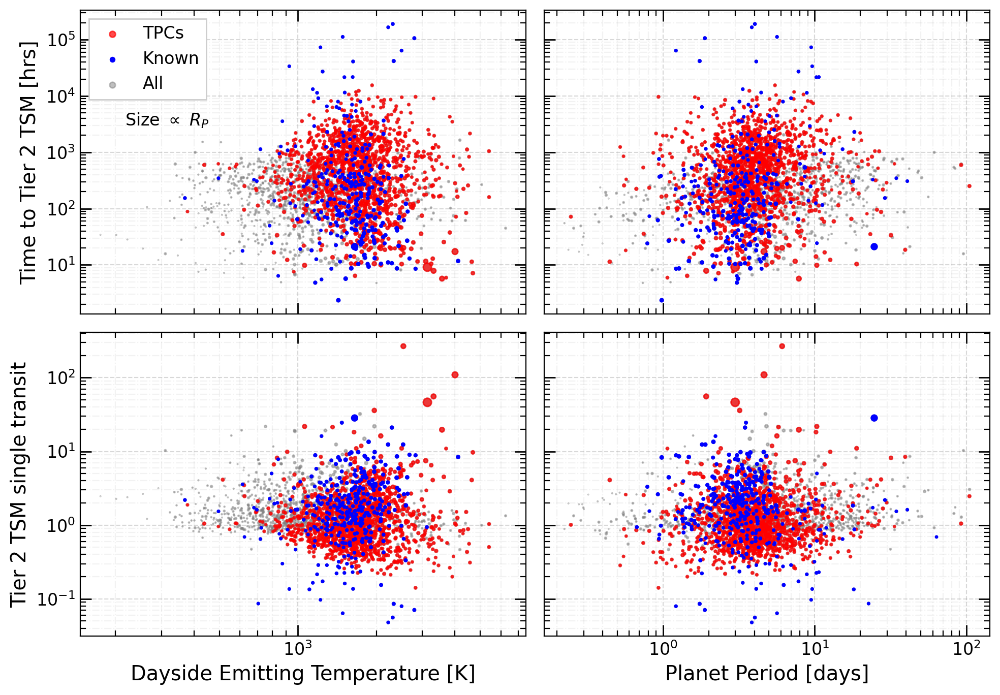

In [58]:
fig, ax = plot4axes(x1="Dayside Emitting Temperature [K]", 
          y1="Time to Tier 2 TSM [hrs]", 
          x2="Planet Period [days]",
          y2="Tier 2 TSM single transit",
          knowncolor='blue', tpcscolor='red',
          knowndf=Jk, tpcsdf=Jt,
          ts=Jt["Planet Radius [Rjup]"]*10, ks=Jk["Planet Radius [Rjup]"]*10,)

# fig.suptitle(r"         Jovian planets ($R_P > 0.5 R_J$)", fontsize=20)

ax[0,0].text(0.1, 0.62, r'Size $\propto \ R_P$', transform=ax[0,0].transAxes, fontsize=12, color='black')

ax[0,0].scatter(combined["Dayside Emitting Temperature [K]"], combined["Time to Tier 2 TSM [hrs]"], c='grey', alpha=0.5, label='All', marker='.', s=combined["Planet Radius [Rjup]"]*10, zorder=1)
ax[0,1].scatter(combined["Planet Period [days]"], combined["Time to Tier 2 TSM [hrs]"], c='grey', alpha=0.5, label='All', marker='.', s=combined["Planet Radius [Rjup]"]*10, zorder=1)
ax[1,0].scatter(combined["Dayside Emitting Temperature [K]"], combined["Tier 2 TSM single transit"], c='grey', alpha=0.5, label='All', marker='.', s=combined["Planet Radius [Rjup]"]*10, zorder=1)
ax[1,1].scatter(combined["Planet Period [days]"], combined["Tier 2 TSM single transit"], c='grey', alpha=0.5, label='All', marker='.', s=combined["Planet Radius [Rjup]"]*10, zorder=1)

ax[0,0].legend(fancybox=False, framealpha=1)

plt.show()

In [142]:
## breaking planets up into bins

'''
parameters to bin:
> Temperature
> Planet Period
> Star mass
'''

def create_bins(df, param_name, bins):
    df = df.sort_values(param_name)
    df.reset_index(inplace=True, drop=True)
    bin_name = f"{param_name} bin"
    df[bin_name] = 0
    n_targets_bin = df.shape[0] // bins
    remainder = df.shape[0] % bins
    for i in range(0,bins):
        for j in range(0, n_targets_bin):
            df.loc[j + i*n_targets_bin, bin_name] = i
    for r in range(0, remainder+1):
        df.loc[j + i*n_targets_bin + r, bin_name] = i
    return df

In [233]:
combined_Js = create_bins(combined_Js, "Dayside Emitting Temperature [K]", 2)
combined_Js = create_bins(combined_Js, "Planet Period [days]", 1)
combined_Js = create_bins(combined_Js, "Star Mass [Ms]", 2)

In [234]:
def balanced_ordering_multiple_bins(df, bin_columns, quality_column='Time to Tier 2 TSM [hrs]', ascending=True):
    sorted_groups = (
        df.sort_values(by=bin_columns + [quality_column], ascending=[True] * len(bin_columns) + [ascending])
        .groupby(bin_columns)
        .apply(lambda x: x.reset_index(drop=True))
        .reset_index(drop=True)
    )
    
    result = []
    group_sizes = sorted_groups.groupby(bin_columns).size()
    max_targets_in_group = group_sizes.max()
    
    for i in range(max_targets_in_group):
        for group_name, group_df in sorted_groups.groupby(bin_columns):
            if i < len(group_df):
                result.append(group_df.iloc[i])
    
    final_df = pd.DataFrame(result)
    return final_df

In [235]:
#, "Planet Period [days] bin", "Star Mass [Ms] bin"
combined_balanced_sort = balanced_ordering_multiple_bins(combined_Js, ["Dayside Emitting Temperature [K] bin", "Star Mass [Ms] bin"])

In [295]:
# combined_balanced_sort.tail(50)

In [246]:
import matplotlib.colors as mcolors

In [249]:
combined_balanced_sort["bin sum"] = combined_balanced_sort["Dayside Emitting Temperature [K] bin"] + combined_balanced_sort["Star Mass [Ms] bin"]

In [322]:
unique_vals = combined_balanced_sort["Star Mass [Ms] bin"].unique()
palette = sns.color_palette('hls', n_colors=len(unique_vals))
cat_to_color = dict(zip(unique_vals, palette))
combined_balanced_sort['color'] = combined_balanced_sort['Star Mass [Ms] bin'].map(cat_to_color)

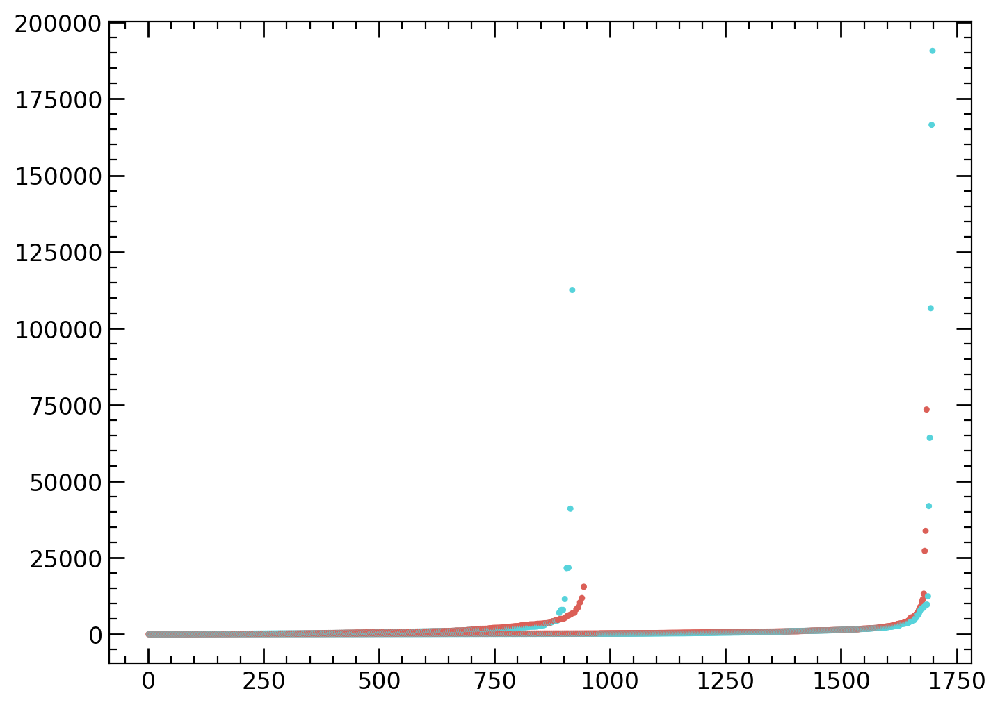

In [323]:
plt.scatter(cumulative_counts, combined_balanced_sort["Time to Tier 2 TSM [hrs]"], c=combined_balanced_sort["color"], s=5)
plt.grid(which='both', alpha=0)
plt.show()

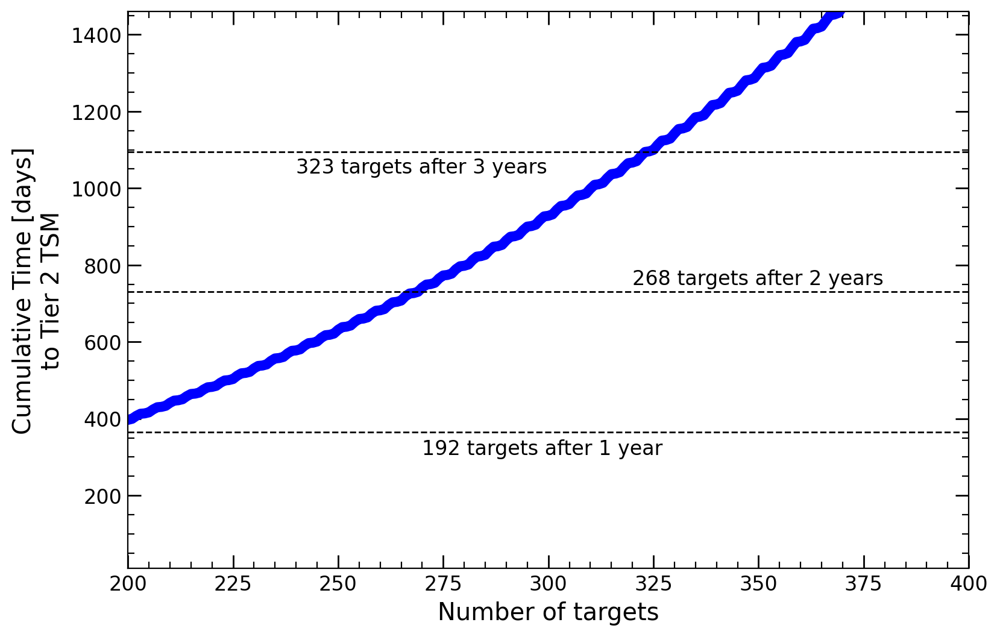

In [299]:
combined_balanced_sort["Cum Sum Time to T2 [days]"] = combined_balanced_sort["Time to Tier 2 TSM [hrs]"].cumsum()/24
cumulative_counts = np.arange(1, len(combined_balanced_sort) + 1)


fig, ax = plt.subplots(figsize=(9, 6))

plt.plot(cumulative_counts, combined_balanced_sort["Cum Sum Time to T2 [days]"], marker='', linewidth=6, color='blue')
# plt.yscale('log')
# plt.xscale('log')

plt.axhline(365, color='black', linestyle='--', linewidth=1)
plt.axhline(365*2, color='black', linestyle='--', linewidth=1)
plt.axhline(365*3, color='black', linestyle='--', linewidth=1)

plt.text(0.35, 0.205, f'{combined_balanced_sort[combined_balanced_sort["Cum Sum Time to T2 [days]"]<365].shape[0]} targets after 1 year', transform=plt.gca().transAxes, fontsize=12, color='black')
plt.text(0.6, 0.51, f'{combined_balanced_sort[combined_balanced_sort["Cum Sum Time to T2 [days]"]<2*365].shape[0]} targets after 2 years', transform=plt.gca().transAxes, fontsize=12, color='black')
plt.text(0.2, 0.71, f'{combined_balanced_sort[combined_balanced_sort["Cum Sum Time to T2 [days]"]<3*365].shape[0]} targets after 3 years', transform=plt.gca().transAxes, fontsize=12, color='black')

plt.xlim(200, 400)
plt.ylim(10, 4*365)

plt.xlabel("Number of targets")
plt.ylabel("Cumulative Time [days]\nto Tier 2 TSM")

plt.grid(which='major', alpha=0, linestyle='--', color='gray', zorder=0)
plt.grid(which='minor', alpha=0, linestyle='-.', color='gray', zorder=0)

plt.show()

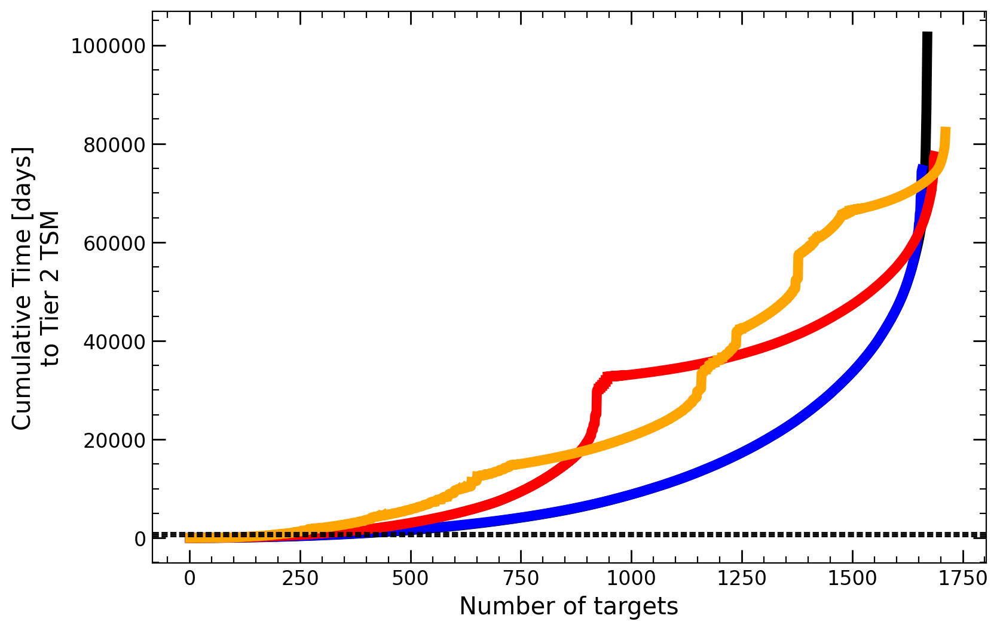

In [311]:
fig, ax = plt.subplots(figsize=(9, 6))

plt.plot(cumulative_counts, TimetoT2sort["Cum Sum Time to T2 [days]"], marker='', linewidth=6, color='black', label="Best targets")

combined_Js = create_bins(combined_Js, "Dayside Emitting Temperature [K]", 2)
balanced_2bins = balanced_ordering_multiple_bins(combined_Js, ["Dayside Emitting Temperature [K] bin"])
# combined_Js = create_bins(combined_Js, "Planet Period [days]", 1)
# combined_Js = create_bins(combined_Js, "Star Mass [Ms]", 2)
balanced_2bins["Cum Sum Time to T2 [days]"] = balanced_2bins["Time to Tier 2 TSM [hrs]"].cumsum()/24
cumulative_counts = np.arange(1, len(balanced_2bins) + 1)
plt.plot(cumulative_counts, balanced_2bins["Cum Sum Time to T2 [days]"], marker='', linewidth=6, color='blue', label="Round robin with 2 bins")


combined_Js = create_bins(combined_Js, "Dayside Emitting Temperature [K]", 2)
combined_Js = create_bins(combined_Js, "Star Mass [Ms]", 2)
balanced_4bins = balanced_ordering_multiple_bins(combined_Js, ["Dayside Emitting Temperature [K] bin", "Star Mass [Ms] bin"])
# combined_Js = create_bins(combined_Js, "Planet Period [days]", 1)
balanced_4bins["Cum Sum Time to T2 [days]"] = balanced_4bins["Time to Tier 2 TSM [hrs]"].cumsum()/24
cumulative_counts = np.arange(1, len(balanced_4bins) + 1)
plt.plot(cumulative_counts, balanced_4bins["Cum Sum Time to T2 [days]"], marker='', linewidth=6, color='red', label="Round robin with 4 bins")


combined_Js = create_bins(combined_Js, "Dayside Emitting Temperature [K]", 4)
combined_Js = create_bins(combined_Js, "Star Mass [Ms]", 4)
balanced_8bins = balanced_ordering_multiple_bins(combined_Js, ["Dayside Emitting Temperature [K] bin", "Star Mass [Ms] bin"])
# combined_Js = create_bins(combined_Js, "Planet Period [days]", 1)
balanced_8bins["Cum Sum Time to T2 [days]"] = balanced_8bins["Time to Tier 2 TSM [hrs]"].cumsum()/24
cumulative_counts = np.arange(1, len(balanced_8bins) + 1)
plt.plot(cumulative_counts, balanced_8bins["Cum Sum Time to T2 [days]"], marker='', linewidth=6, color='orange', label="Round robin with 8 bins")

plt.axhline(365, color='black', linestyle='--', linewidth=1)
plt.axhline(365*2, color='black', linestyle='--', linewidth=1)
plt.axhline(365*3, color='black', linestyle='--', linewidth=1)

# plt.xlim(200, 400)
# plt.ylim(10, 4*365)

plt.xlabel("Number of targets")
plt.ylabel("Cumulative Time [days]\nto Tier 2 TSM")

plt.grid(which='major', alpha=0, linestyle='--', color='gray', zorder=0)
plt.grid(which='minor', alpha=0, linestyle='-.', color='gray', zorder=0)

plt.show()

In [303]:
balanced_2bins

,Star Name,Star Mass [Ms],Star Mass Error Lower [Ms],Star Mass Error Upper [Ms],Star Temperature [K],Star Temperature Error Lower [K],Star Temperature Error Upper [K],Star Radius [Rs],Star Radius Error Lower [Rs],Star Radius Error Upper [Rs],...,Public Comment,Sectors,FP_Flag,EB,VS,NASA PC,Star T Mag,Dayside Emitting Temperature [K] bin,Planet Period [days] bin,Star Mass [Ms] bin
0,HIP65A,0.780000,-0.03,0.03,4590.0,-49.0,49.0,0.720000,-0.01,0.01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
865,TOI-3076,4.763720,NaN,NaN,14677.0,-166.0,166.0,3.206370,NaN,NaN,...,found in faint-star QLP search; no stellar radius,"[9, 10, 36, 37]",0.0,0.0,0.0,True,11.8468,1,0,1
1,WASP-177,0.880000,-0.04,0.04,5017.0,-70.0,70.0,0.890000,-0.05,0.05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
866,TOI-651,2.260792,NaN,NaN,8576.7,-231.6,231.6,2.083668,NaN,NaN,...,maybe odd-even; two stars on the same TESS pixel,"[6, 33]",0.0,0.0,0.0,True,9.0185,1,0,1
2,HD189733,0.810000,-0.04,0.04,5050.0,-20.0,20.0,0.770000,-0.02,0.02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
863,WASP-95,1.460000,-0.42,0.42,5830.0,-140.0,140.0,1.230000,-0.09,0.09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,1
1728,TOI-1518,1.790000,-0.26,0.26,7300.0,-100.0,100.0,1.950000,-0.05,0.05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0,1
864,WASP-81,1.080000,-0.06,0.06,5870.0,-120.0,120.0,1.280000,-0.04,0.04,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
1729,KOI-13,1.720000,-0.10,0.10,7650.0,-250.0,250.0,1.740000,-0.04,0.04,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0,1


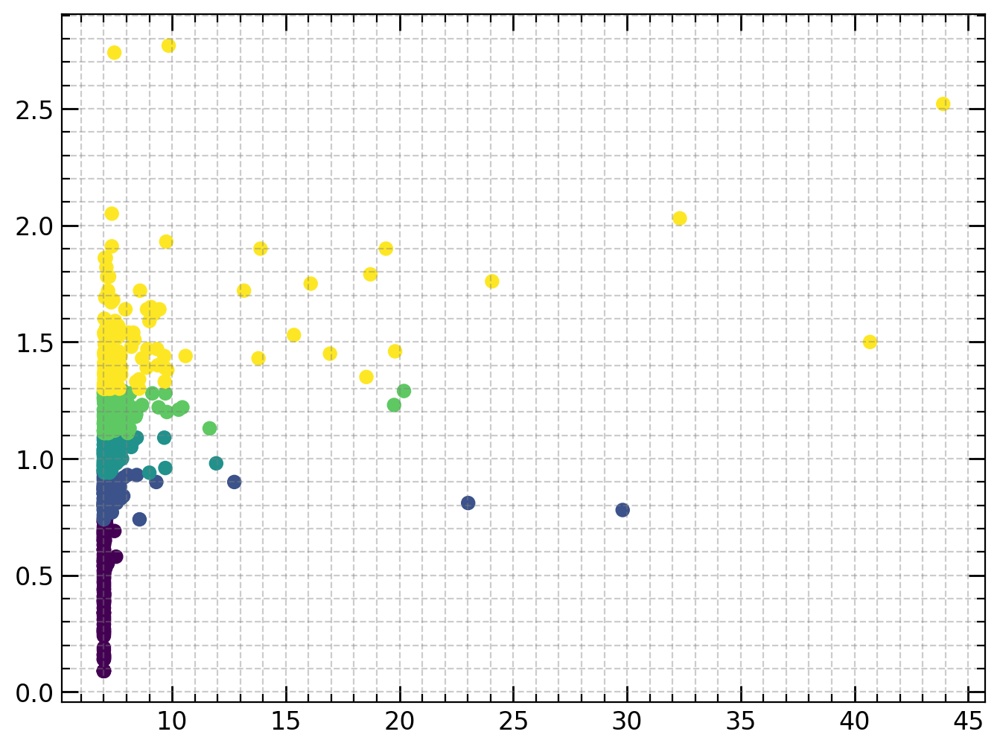

In [215]:
plt.scatter(known["Tier 2 ESM"], known["Star Mass [Ms]"], c=known["Star Mass [Ms] bin"])

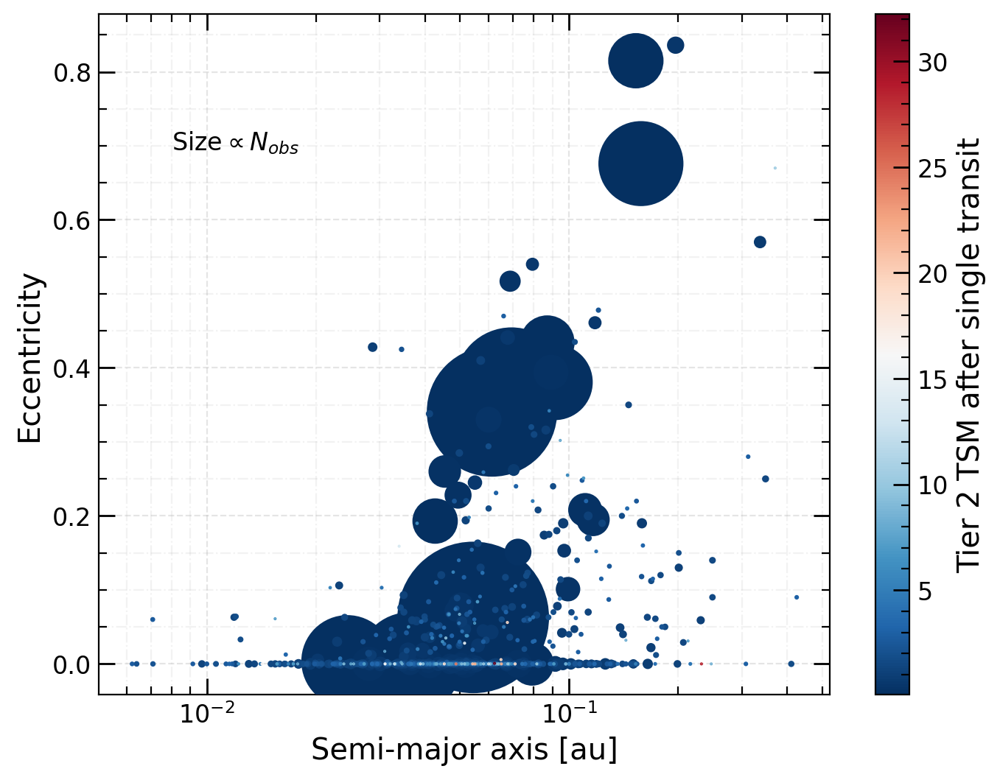

In [111]:
knownsort = known.sort_values("Tier 2 TSM single transit", ascending=True)
plt.scatter(knownsort["Planet Semi-major Axis [au]"], knownsort["Eccentricity"], c=knownsort["Tier 2 TSM single transit"], marker='.', 
            s=knownsort["Tier 2 Observations TSM"], cmap='RdBu_r', zorder=3)
plt.colorbar(label="Tier 2 TSM after single transit")
plt.xscale('log')
plt.xlabel("Semi-major axis [au]")
plt.ylabel("Eccentricity")

plt.grid(which='major', alpha=0.2, linestyle='--', color='gray', zorder=0)
plt.grid(which='minor', alpha=0.1, linestyle='-.', color='gray', zorder=0)

plt.text(0.1, 0.8, r"Size$\propto N_{obs}$", transform=plt.gca().transAxes, fontsize=12, color='black')

plt.show()

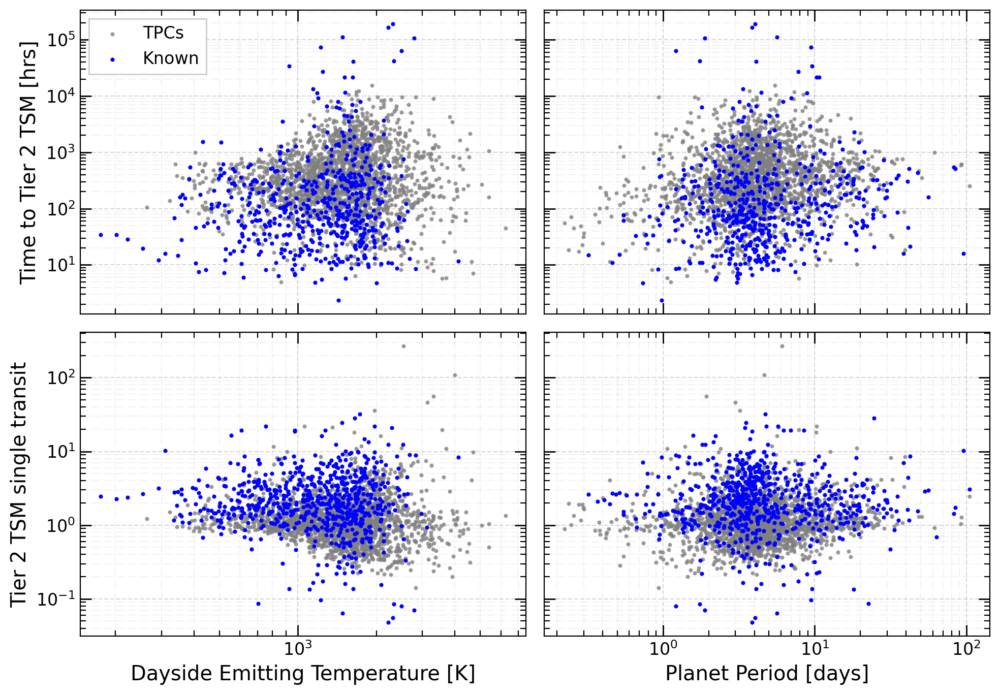

In [26]:
plot4axes(x1="Dayside Emitting Temperature [K]", 
          y1="Time to Tier 2 TSM [hrs]", 
          x2="Planet Period [days]", 
          y2="Tier 2 TSM single transit",
          knowncolor='blue', tpcscolor='grey')

plt.show()

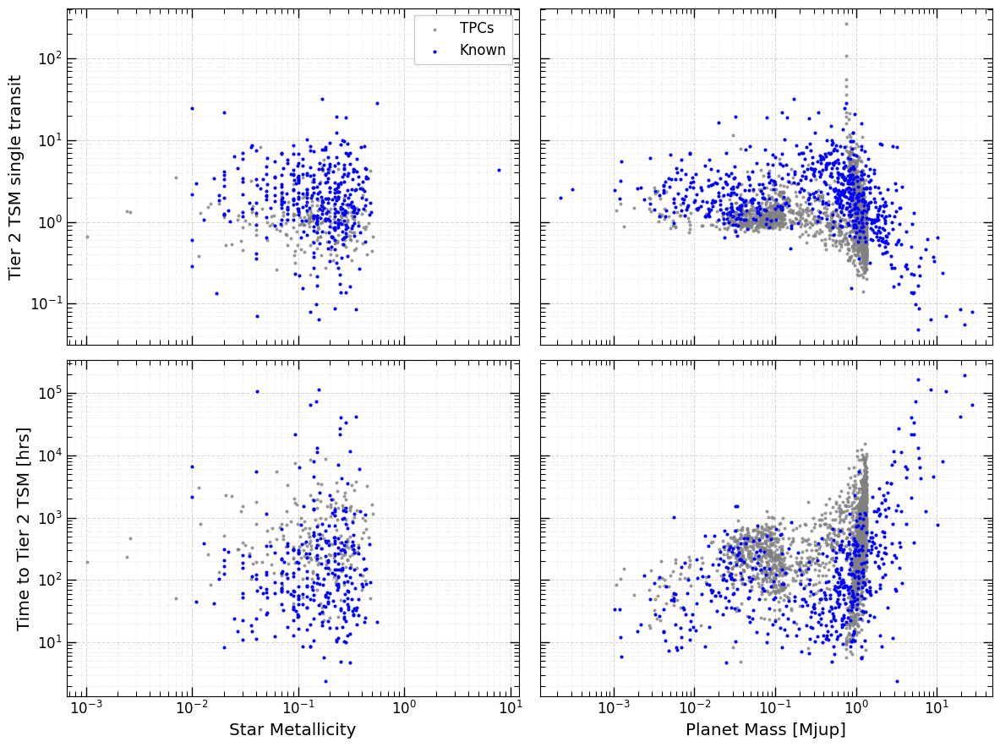

Number of known host stars with metallicity parameter: 629. Fraction of targets: 0.90
Number of TPC host stars with metallicity parameter: 329. Fraction of targets: 0.16


In [ ]:
plot4axes(x1="Star Metallicity",
          y1="Tier 2 TSM single transit",
          x2="Planet Mass [Mjup]",
          y2="Time to Tier 2 TSM [hrs]")

plt.show()

k_metal = known["Star Metallicity"].notna().sum()
t_metal = tpcs["Star Metallicity"].notna().sum()
print(f"Number of known host stars with metallicity parameter: {k_metal}. Fraction of targets: {k_metal/known.shape[0]:.2f}")
print(f"Number of TPC host stars with metallicity parameter: {t_metal}. Fraction of targets: {t_metal/tpcs.shape[0]:.2f}")

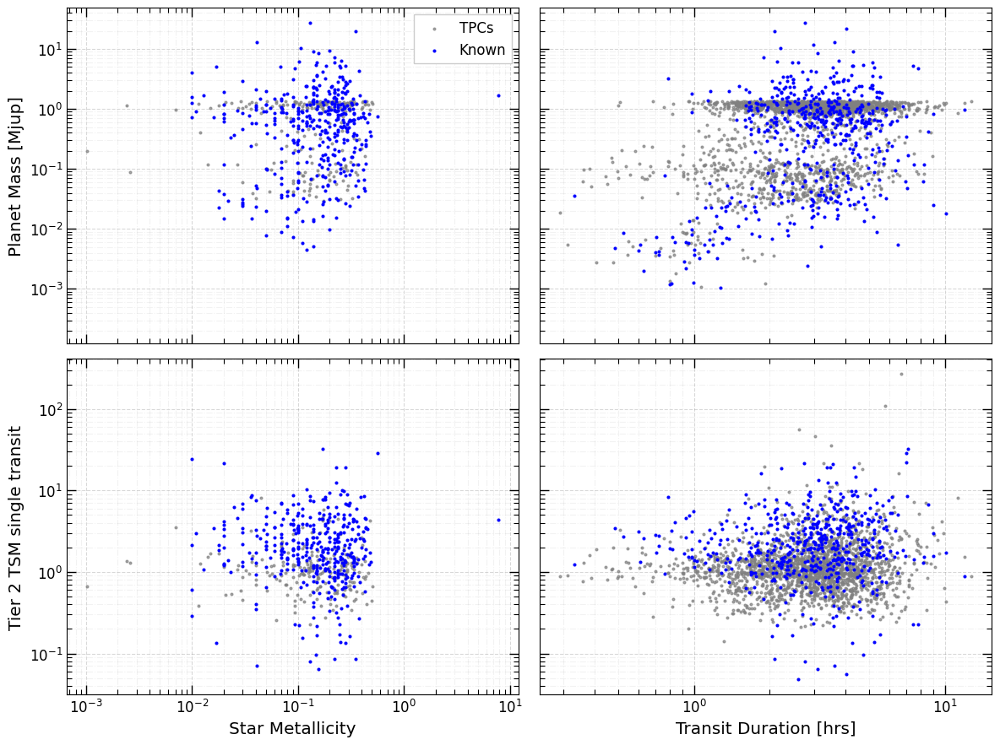

In [105]:
plot4axes(x1="Star Metallicity",
          y1="Planet Mass [Mjup]",
          x2="Transit Duration [hrs]",
          y2="Tier 2 TSM single transit")

plt.show()

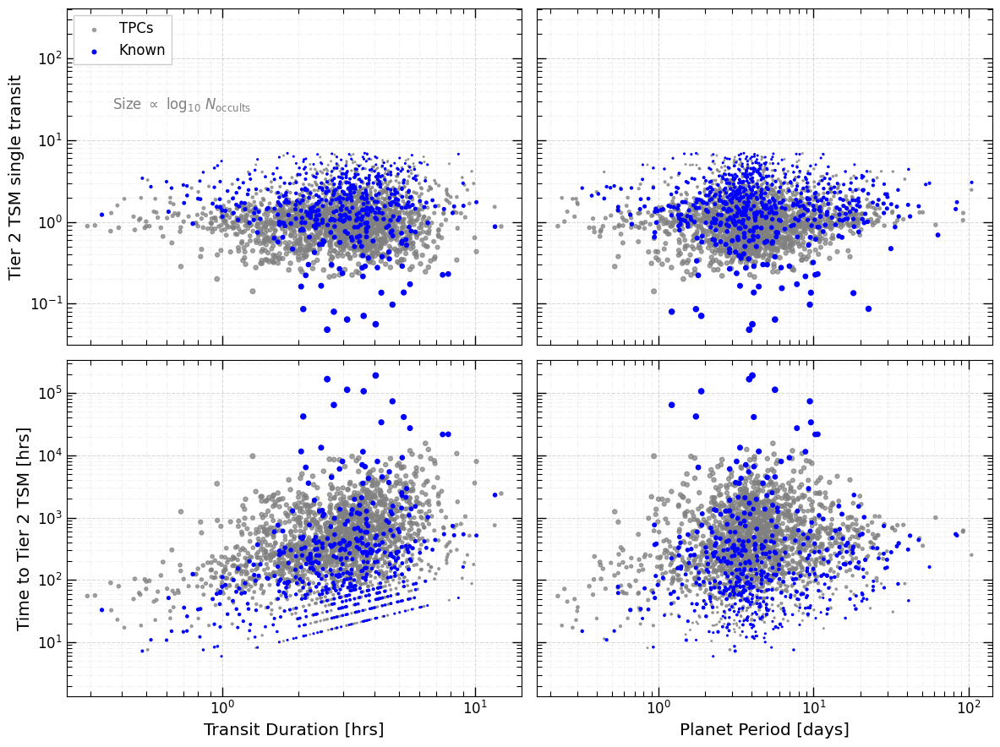

In [ ]:
k_temp = known["Tier 2 Observations TSM"].copy()
t_temp = tpcs["Tier 2 Observations TSM"].copy()

for i, (val1, val2) in enumerate(zip(k_temp, t_temp)):
    # make is so that above 50, each additional 50 increases by 1
    if val1 > 50:
        k_temp[i] = 50 + (val1 - 50) // 60
    if val2 > 50:
        t_temp[i] = 50 + (val1 - 50) // 60
        

k_temp["Observations_normalized"] = (k_temp - k_temp.min()) / (k_temp.max() - k_temp.min())
t_temp["Observations_normalized"] = (t_temp - t_temp.min()) / (t_temp.max() - t_temp.min())

fig, ax = plot4axes(x1="Transit Duration [hrs]",
          y1="Tier 2 TSM single transit",
          x2="Planet Period [days]",
          y2="Time to Tier 2 TSM [hrs]",
          ts=np.log10(tpcs["Tier 2 Observations TSM"])*20,
          ks=np.log10(known["Tier 2 Observations TSM"])*20
          )

ax[0,0].text(0.1, 0.7, r'Size $\propto \ \text{log}_{10} \ N_\text{occults}$', transform=ax[0,0].transAxes, fontsize=12, color='grey')


plt.show()

0      20.0
1       4.0
2       6.0
3      12.0
4      16.0
       ... 
692    23.0
693    50.0
694    13.0
695    50.0
696    17.0
Name: Tier 2 Observations TSM, Length: 697, dtype: float64

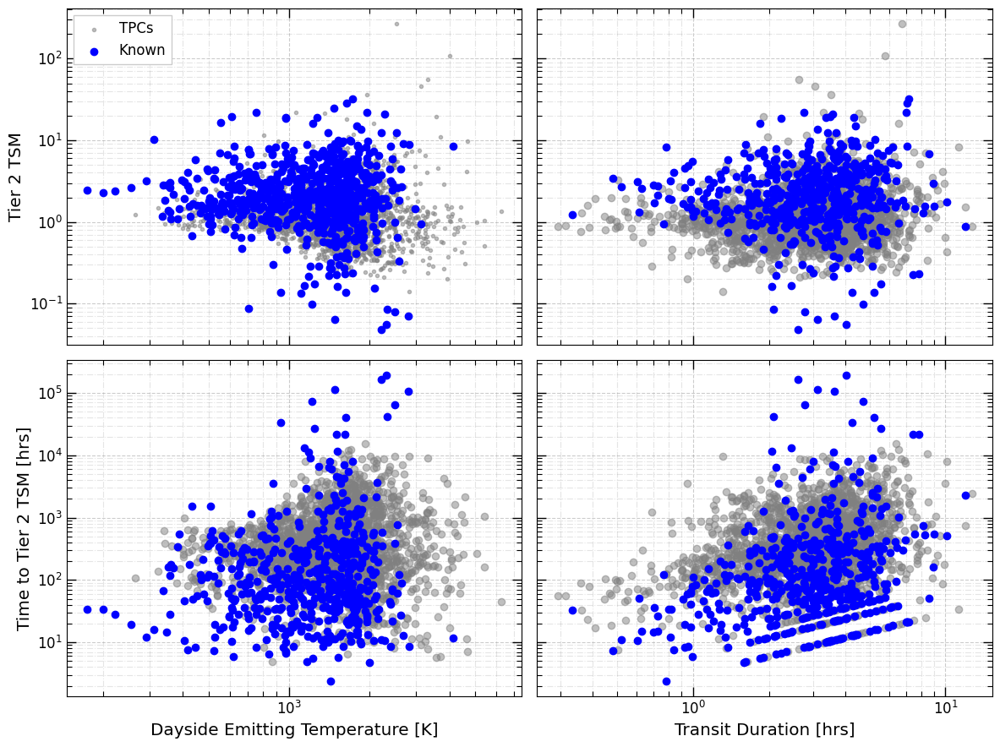

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(12, 9), sharex='col', sharey='row', tight_layout=True)

set_grid(fig)

ax[0,0].scatter(tpcs["Dayside Emitting Temperature [K]"], tpcs["Tier 2 TSM single transit"], color='grey', alpha=0.5, label='TPCs', zorder=2)
ax[0,0].scatter(known["Dayside Emitting Temperature [K]"], known["Tier 2 TSM single transit"], color='blue', label='Known', zorder=2)
ax[0,0].set_yscale('log')
ax[0,0].set_xscale('log')
ax[0,0].set_ylabel('Tier 2 TSM')
ax[0,0].legend(fancybox=False, framealpha=1)

ax[0,1].scatter(tpcs["Transit Duration [hrs]"], tpcs["Tier 2 TSM single transit"], color='grey', alpha=0.5, label='TPCs', zorder=2)
ax[0,1].scatter(known["Transit Duration [hrs]"], known["Tier 2 TSM single transit"], color='blue', label='Known', zorder=2)
ax[0,1].set_yscale('log')
ax[0,1].set_xscale('log')


ax[1,0].scatter(tpcs["Dayside Emitting Temperature [K]"], tpcs["Time to Tier 2 TSM [hrs]"], color='grey', alpha=0.5, label='TPCs', zorder=2)
ax[1,0].scatter(known["Dayside Emitting Temperature [K]"], known["Time to Tier 2 TSM [hrs]"], color='blue', label='Known', zorder=2)
ax[1,0].set_yscale('log')
ax[1,0].set_xscale('log')
ax[1,0].set_ylabel('Time to Tier 2 TSM [hrs]')
ax[1,0].set_xlabel('Dayside Emitting Temperature [K]')

ax[1,1].scatter(tpcs["Transit Duration [hrs]"], tpcs["Time to Tier 2 TSM [hrs]"], color='grey', alpha=0.5, label='TPCs', zorder=2)
ax[1,1].scatter(known["Transit Duration [hrs]"], known["Time to Tier 2 TSM [hrs]"], color='blue', label='Known', zorder=2)
ax[1,1].set_yscale('log')
ax[1,1].set_xscale('log')
ax[1,1].set_xlabel('Transit Duration [hrs]')

plt.show()

In [14]:
combined.shape[0]
# 2040+69

2737

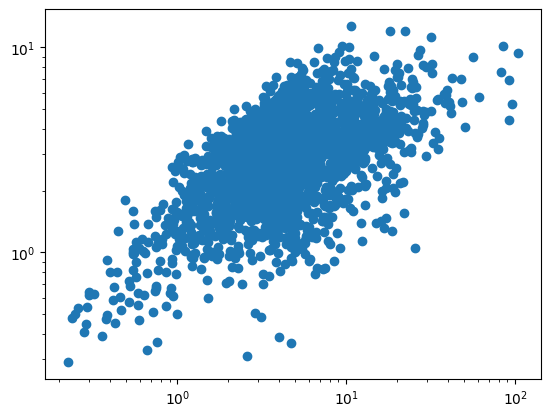

In [15]:
plt.scatter(combined["Planet Period [days]"], combined["Transit Duration [hrs]"])
plt.yscale('log')
plt.xscale('log')

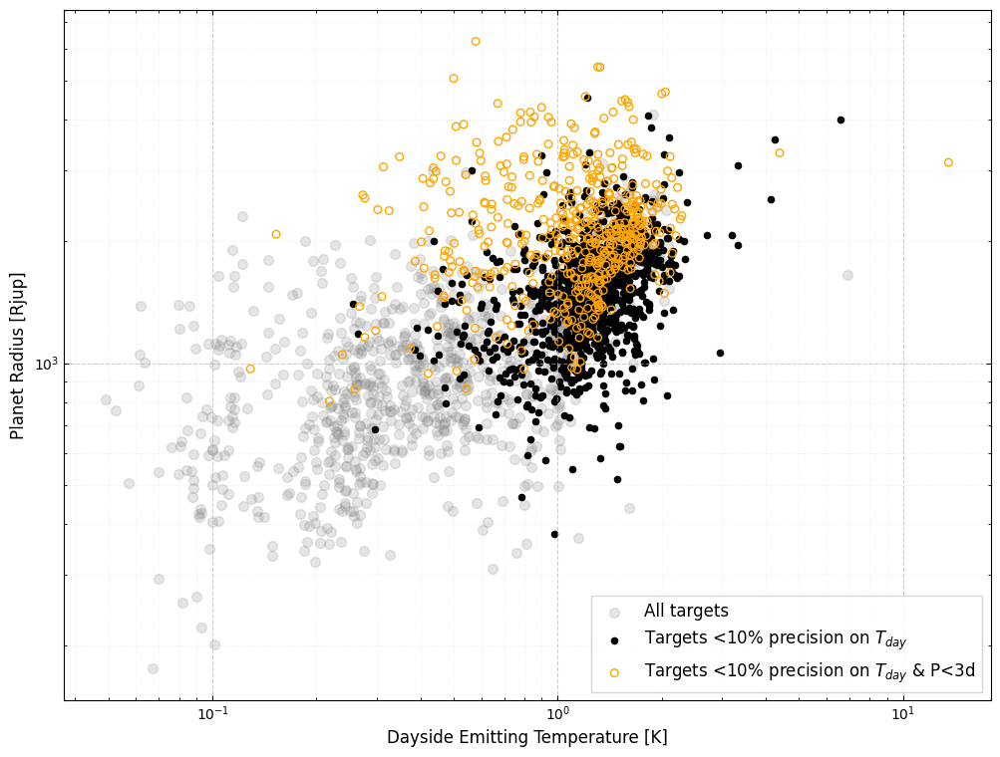

In [16]:
# plotting Rp vs Td
fig, ax = plt.subplots(figsize=(12,9))

ax.set_yscale('log')
ax.set_xscale('log')

ax.grid(which='major', alpha=0.6, linestyle='--', zorder=-3)
ax.grid(which='minor', alpha=0.2, linestyle=':')

w_combined = combined[combined["Relative Dayside Temperature Uncertainty Average"] >= 0.1]
ax.scatter(w_combined["Planet Radius [Rjup]"], w_combined["Dayside Emitting Temperature [K]"], color='grey', s=50, alpha=0.2, label="All targets")

best_combined = combined[(combined["Relative Dayside Temperature Uncertainty Average"] < 0.1) & (combined["Planet Period [days]"]>3)]
ax.scatter(best_combined["Planet Radius [Rjup]"], best_combined["Dayside Emitting Temperature [K]"], color='black', s=20, label=r"Targets <10% precision on $T_{day}$")

best_combined = combined[(combined["Relative Dayside Temperature Uncertainty Average"] < 0.1) & (combined["Planet Period [days]"]<=3)]
ax.scatter(best_combined["Planet Radius [Rjup]"], best_combined["Dayside Emitting Temperature [K]"],
           facecolor='none', edgecolors='orange', s=30, label=r"Targets <10% precision on $T_{day}$ & P<3d")

ax.set_ylabel("Planet Radius [Rjup]", fontsize=12)
ax.set_xlabel("Dayside Emitting Temperature [K]", fontsize=12)

ax.tick_params(right=True, top=True, which='both', direction='in')

ax.legend(fancybox=False, fontsize=12)

plt.show()

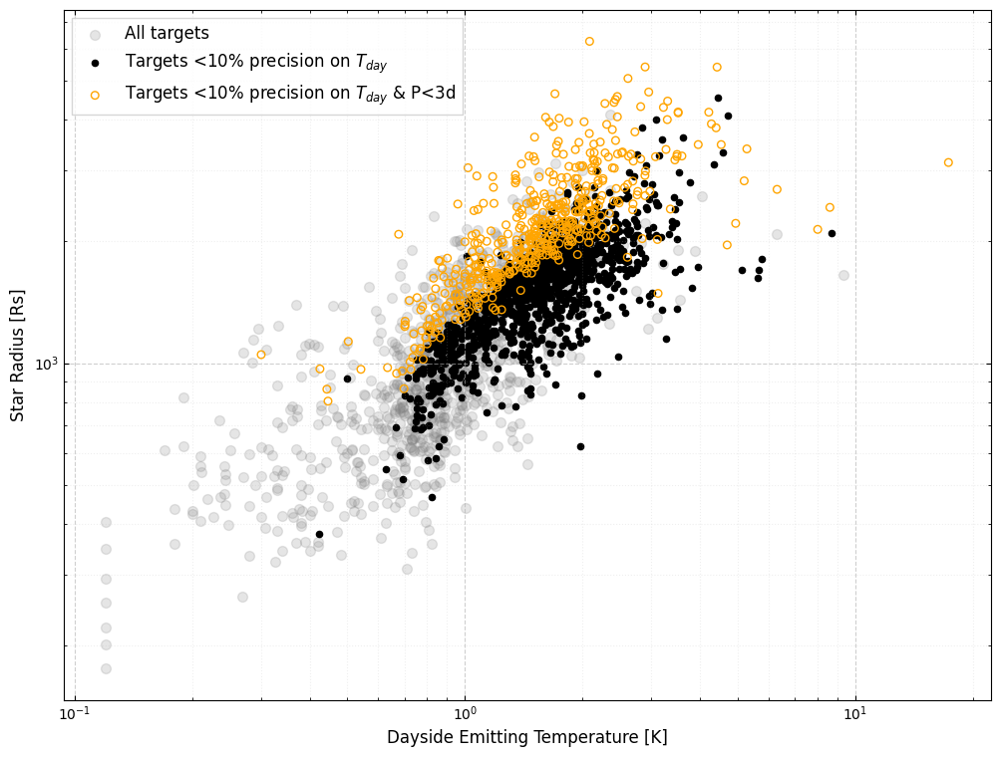

In [17]:
# plotting Rp vs Td
fig, ax = plt.subplots(figsize=(12,9))

ax.set_yscale('log')
ax.set_xscale('log')

ax.grid(which='major', alpha=0.6, linestyle='--', zorder=-3)
ax.grid(which='minor', alpha=0.2, linestyle=':')

w_combined = combined[combined["Relative Dayside Temperature Uncertainty Average"] >= 0.1]
ax.scatter(w_combined["Star Radius [Rs]"], w_combined["Dayside Emitting Temperature [K]"], color='grey', s=50, alpha=0.2, label="All targets")

best_combined = combined[(combined["Relative Dayside Temperature Uncertainty Average"] < 0.1) & (combined["Planet Period [days]"]>3)]
ax.scatter(best_combined["Star Radius [Rs]"], best_combined["Dayside Emitting Temperature [K]"], color='black', s=20, label=r"Targets <10% precision on $T_{day}$")

best_combined = combined[(combined["Relative Dayside Temperature Uncertainty Average"] < 0.1) & (combined["Planet Period [days]"]<=3)]
ax.scatter(best_combined["Star Radius [Rs]"], best_combined["Dayside Emitting Temperature [K]"],
           facecolor='none', edgecolors='orange', s=30, label=r"Targets <10% precision on $T_{day}$ & P<3d")

ax.set_ylabel("Star Radius [Rs]", fontsize=12)
ax.set_xlabel("Dayside Emitting Temperature [K]", fontsize=12)

ax.tick_params(right=True, top=True, which='both', direction='in')

ax.legend(fancybox=False, fontsize=12)

plt.show()

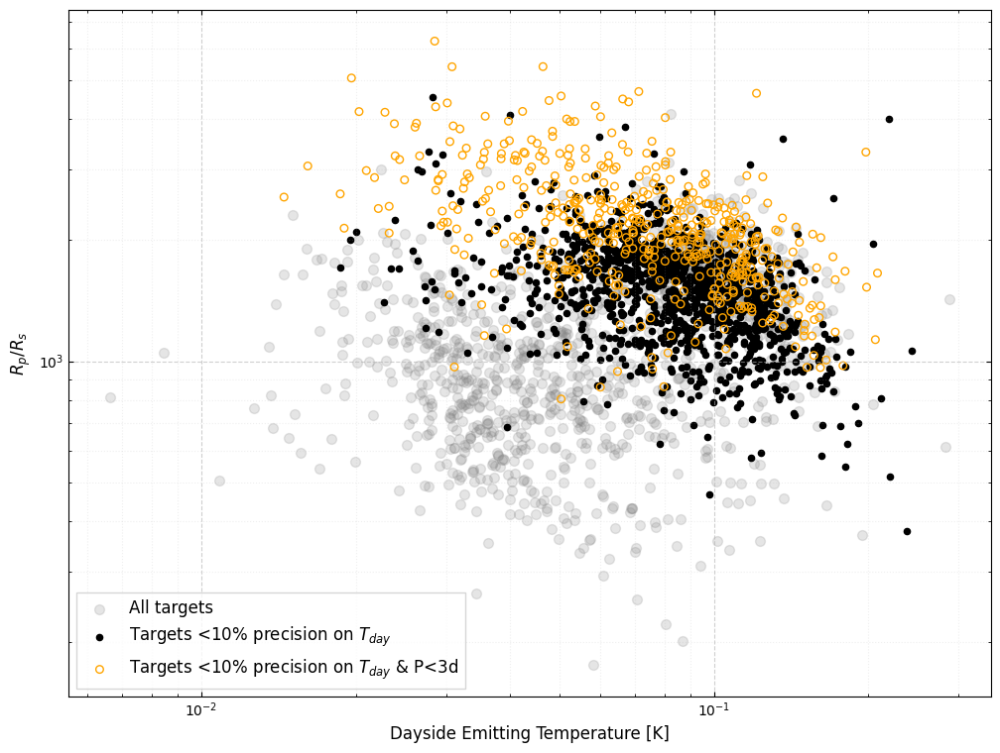

In [18]:
# plotting Rp vs Td
fig, ax = plt.subplots(figsize=(12,9))

ax.set_yscale('log')
ax.set_xscale('log')

ax.grid(which='major', alpha=0.6, linestyle='--', zorder=-3)
ax.grid(which='minor', alpha=0.2, linestyle=':')

w_combined = combined[combined["Relative Dayside Temperature Uncertainty Average"] >= 0.1]
ax.scatter(w_combined["Rp/Rs"], w_combined["Dayside Emitting Temperature [K]"], color='grey', s=50, alpha=0.2, label="All targets")

best_combined = combined[(combined["Relative Dayside Temperature Uncertainty Average"] < 0.1) & (combined["Planet Period [days]"]>3)]
ax.scatter(best_combined["Rp/Rs"], best_combined["Dayside Emitting Temperature [K]"], color='black', s=20, label=r"Targets <10% precision on $T_{day}$")

best_combined = combined[(combined["Relative Dayside Temperature Uncertainty Average"] < 0.1) & (combined["Planet Period [days]"]<=3)]
ax.scatter(best_combined["Rp/Rs"], best_combined["Dayside Emitting Temperature [K]"],
           facecolor='none', edgecolors='orange', s=30, label=r"Targets <10% precision on $T_{day}$ & P<3d")

ax.set_ylabel(r"$R_p/R_s$", fontsize=12)
ax.set_xlabel("Dayside Emitting Temperature [K]", fontsize=12)

ax.tick_params(right=True, top=True, which='both', direction='in')

ax.legend(fancybox=False, fontsize=12)

plt.show()

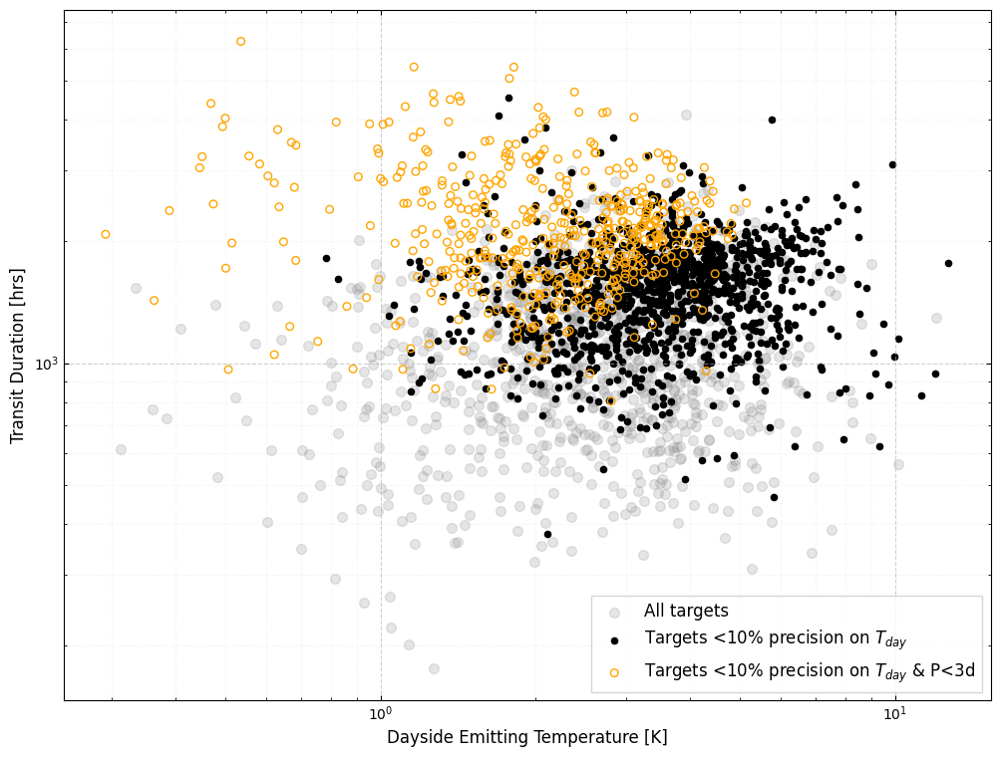

In [19]:
# plotting Rp vs Td
fig, ax = plt.subplots(figsize=(12,9))

ax.set_yscale('log')
ax.set_xscale('log')

ax.grid(which='major', alpha=0.6, linestyle='--', zorder=-3)
ax.grid(which='minor', alpha=0.2, linestyle=':')

w_combined = combined[combined["Relative Dayside Temperature Uncertainty Average"] >= 0.1]
ax.scatter(w_combined["Transit Duration [hrs]"], w_combined["Dayside Emitting Temperature [K]"], color='grey', s=50, alpha=0.2, label="All targets")

best_combined = combined[(combined["Relative Dayside Temperature Uncertainty Average"] < 0.1) & (combined["Planet Period [days]"]>3)]
ax.scatter(best_combined["Transit Duration [hrs]"], best_combined["Dayside Emitting Temperature [K]"], color='black', s=20, label=r"Targets <10% precision on $T_{day}$")

best_combined = combined[(combined["Relative Dayside Temperature Uncertainty Average"] < 0.1) & (combined["Planet Period [days]"]<=3)]
ax.scatter(best_combined["Transit Duration [hrs]"], best_combined["Dayside Emitting Temperature [K]"],
           facecolor='none', edgecolors='orange', s=30, label=r"Targets <10% precision on $T_{day}$ & P<3d")

ax.set_ylabel("Transit Duration [hrs]", fontsize=12)
ax.set_xlabel("Dayside Emitting Temperature [K]", fontsize=12)

ax.tick_params(right=True, top=True, which='both', direction='in')

ax.legend(fancybox=False, fontsize=12)

plt.show()

In [20]:
### More Tday precision testing

In [21]:
# toi5704 = combined.iloc[:1]
# plt.plot(toi5704["Daysi"])

In [22]:
nirspec = Ariel.getInstrument("Ariel AIRS CH0 R=3", "Ariel_MCS_TPCs_2024-03-27")
tab = nirspec.table.iloc[:1]
tab = tab.filter(like='Full Phase Curve Dayside Temperature Uncertainty')
tab["Estimated Dayside Temperature 1.95-2.6um"] = np.random.randn(1)
tab

,Full Phase Curve Dayside Temperature Uncertainty 1.95-2.6um,Full Phase Curve Dayside Temperature Uncertainty 2.6-3.25um,Full Phase Curve Dayside Temperature Uncertainty 3.25-3.9um,Estimated Dayside Temperature 1.95-2.6um
0,0.007074,0.008285,0.010338,1.688212


In [23]:
list(combined.columns)

['Star Name',
 'Star Mass [Ms]',
 'Star Mass Error Lower [Ms]',
 'Star Mass Error Upper [Ms]',
 'Star Temperature [K]',
 'Star Temperature Error Lower [K]',
 'Star Temperature Error Upper [K]',
 'Star Radius [Rs]',
 'Star Radius Error Lower [Rs]',
 'Star Radius Error Upper [Rs]',
 'Star log(g)',
 'Star log(g) Error Lower',
 'Star log(g) Error Upper',
 'Star Metallicity',
 'Star Metallicity Error Lower',
 'Star Metallicity Error Upper',
 'Metallicity Ratio',
 'Star Age [Gyr]',
 'Star Age Error Lower [Gyr]',
 'Star Age Error Upper [Gyr]',
 'Star Spectral Type',
 'Star Rotational Velocity [km/s]',
 'Star Rotational Velocity Error Lower [km/s]',
 'Star Rotational Velocity Error Upper [km/s]',
 'Star Rotation Period [days]',
 'Star Rotation Period Error Lower [days]',
 'Star Rotation Period Error Upper [days]',
 'Star Distance [pc]',
 'Star Distance Error Lower [pc]',
 'Star Distance Error Upper [pc]',
 'Star Parallax [mas]',
 'Star Parallax Error Lower [mas]',
 'Star Parallax Error Upper [

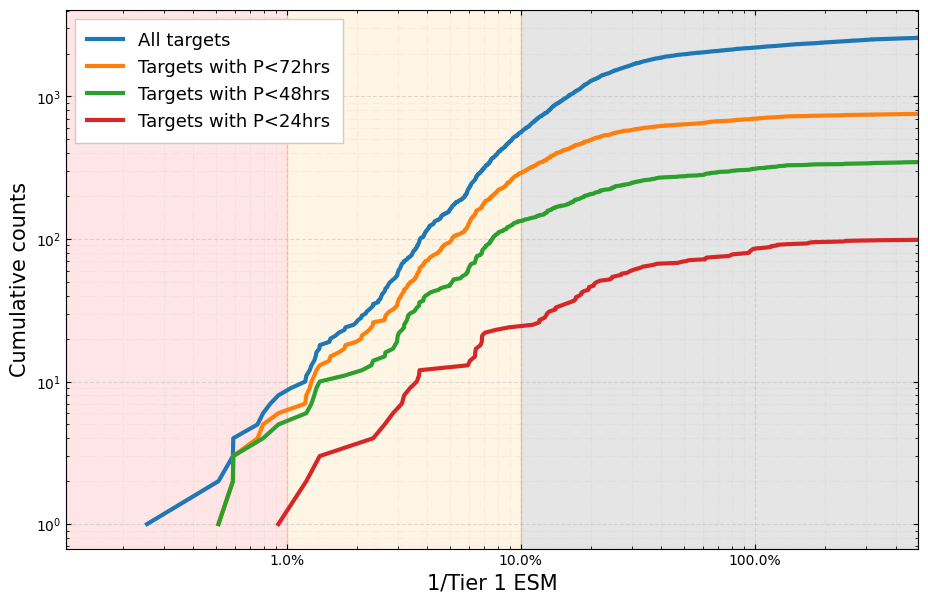

In [24]:
ESMsorted = combined.sort_values("Tier 1 ESM single eclipse", ascending=False)
cumulative_counts = np.arange(1, len(ESMsorted) + 1)

ESMsorted_P3 = combined[combined["Planet Period [days]"] <= 3].sort_values("Tier 1 ESM single eclipse", ascending=False)
cumulative_counts_P3 = np.arange(1, len(ESMsorted_P3) + 1)

ESMsorted_P2 = combined[combined["Planet Period [days]"] <= 2].sort_values("Tier 1 ESM single eclipse", ascending=False)
cumulative_counts_P2 = np.arange(1, len(ESMsorted_P2) + 1)

ESMsorted_P1 = combined[combined["Planet Period [days]"] <= 1].sort_values("Tier 1 ESM single eclipse", ascending=False)
cumulative_counts_P11 = np.arange(1, len(ESMsorted_P1) + 1)

fig, ax = plt.subplots(figsize=(11, 7))

ax.grid(True, which='major', linestyle='--', alpha=0.4, zorder=0)
ax.grid(True, which='minor', linestyle='-.', alpha=0.1, zorder=0)

plt.plot(1/ESMsorted["Tier 1 ESM single eclipse"], cumulative_counts, linewidth=3, zorder=2, label="All targets")
plt.plot(1/ESMsorted_P3["Tier 1 ESM single eclipse"], cumulative_counts_P3, linewidth=3, zorder=2, label="Targets with P<72hrs")
plt.plot(1/ESMsorted_P2["Tier 1 ESM single eclipse"], cumulative_counts_P2, linewidth=3, zorder=2, label="Targets with P<48hrs")
plt.plot(1/ESMsorted_P1["Tier 1 ESM single eclipse"], cumulative_counts_P11, linewidth=3, zorder=2, label="Targets with P<24hrs")

plt.xscale('log')
plt.yscale('log')

plt.xlim(None, 5)

plt.ylabel("Cumulative counts", fontsize=15)
plt.xlabel("1/Tier 1 ESM", fontsize=15)

plt.legend(loc="upper left", fontsize=13, fancybox=False, framealpha=1, borderpad=.7)


xmin, xmax = plt.xlim()

plt.axvspan(xmin, 1e-3, color='purple', alpha=0.1)
plt.axvspan(1e-3, 1e-2, color='red', alpha=0.1)
plt.axvspan(1e-2, 1e-1, color='orange', alpha=0.1)
plt.axvspan(1e-1, xmax, color='black', alpha=0.1)

plt.tick_params(axis='both', which='both', direction='in', top=True, right=True)
plt.minorticks_on()

ax.set_xticklabels([f"{i*100}%" for i in ax.get_xticks()])

plt.show()

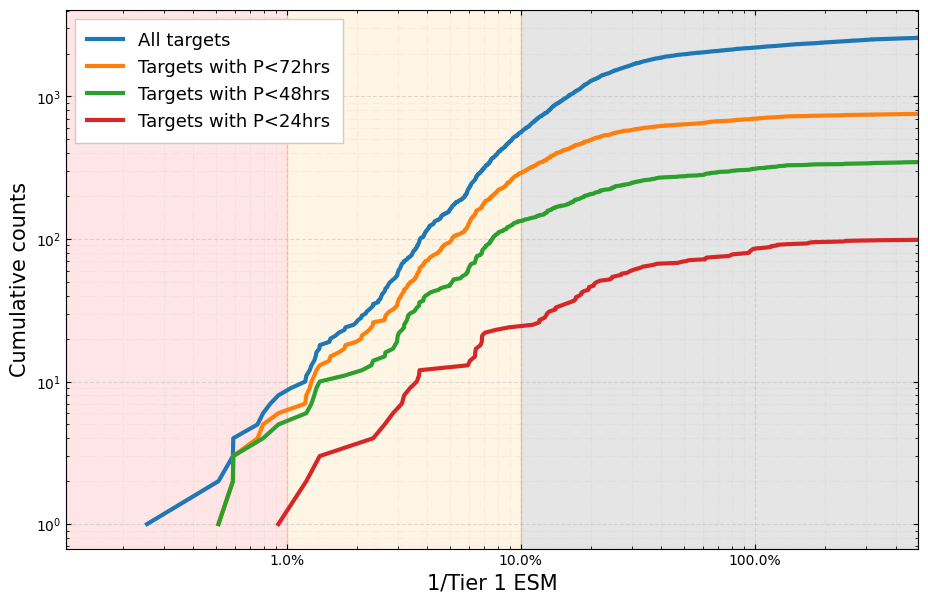

In [25]:
ESMsorted = combined.sort_values("Tier 1 ESM single eclipse", ascending=False)
cumulative_counts = np.arange(1, len(ESMsorted) + 1)

ESMsorted_P3 = combined[combined["Planet Period [days]"] <= 3].sort_values("Tier 1 ESM single eclipse", ascending=False)
cumulative_counts_P3 = np.arange(1, len(ESMsorted_P3) + 1)

ESMsorted_P2 = combined[combined["Planet Period [days]"] <= 2].sort_values("Tier 1 ESM single eclipse", ascending=False)
cumulative_counts_P2 = np.arange(1, len(ESMsorted_P2) + 1)

ESMsorted_P1 = combined[combined["Planet Period [days]"] <= 1].sort_values("Tier 1 ESM single eclipse", ascending=False)
cumulative_counts_P11 = np.arange(1, len(ESMsorted_P1) + 1)

fig, ax = plt.subplots(figsize=(11, 7))

ax.grid(True, which='major', linestyle='--', alpha=0.4, zorder=0)
ax.grid(True, which='minor', linestyle='-.', alpha=0.1, zorder=0)

plt.plot(1/ESMsorted["Tier 1 ESM single eclipse"], cumulative_counts, linewidth=3, zorder=2, label="All targets")
plt.plot(1/ESMsorted_P3["Tier 1 ESM single eclipse"], cumulative_counts_P3, linewidth=3, zorder=2, label="Targets with P<72hrs")
plt.plot(1/ESMsorted_P2["Tier 1 ESM single eclipse"], cumulative_counts_P2, linewidth=3, zorder=2, label="Targets with P<48hrs")
plt.plot(1/ESMsorted_P1["Tier 1 ESM single eclipse"], cumulative_counts_P11, linewidth=3, zorder=2, label="Targets with P<24hrs")

plt.xscale('log')
plt.yscale('log')

plt.xlim(None, 5)

plt.ylabel("Cumulative counts", fontsize=15)
plt.xlabel("1/Tier 1 ESM", fontsize=15)

plt.legend(loc="upper left", fontsize=13, fancybox=False, framealpha=1, borderpad=.7)


xmin, xmax = plt.xlim()

plt.axvspan(xmin, 1e-3, color='purple', alpha=0.1)
plt.axvspan(1e-3, 1e-2, color='red', alpha=0.1)
plt.axvspan(1e-2, 1e-1, color='orange', alpha=0.1)
plt.axvspan(1e-1, xmax, color='black', alpha=0.1)

plt.tick_params(axis='both', which='both', direction='in', top=True, right=True)
plt.minorticks_on()

ax.set_xticklabels([f"{i*100}%" for i in ax.get_xticks()])

plt.show()

In [26]:
ESMsorted["Tier 1 Observations Full Phase Curve SNR"]

796             1.0
281             1.0
100             1.0
1813            1.0
610             1.0
           ...     
29         395493.0
1703       135023.0
30        1744863.0
31        6266410.0
570     433130600.0
Name: Tier 1 Observations Full Phase Curve SNR, Length: 2737, dtype: float64

In [27]:
over_one_percent = combined[(combined["Relative Dayside Temperature Uncertainty Average"] > 1e-1)].shape[0] 

under_one_percent = combined[(combined["Relative Dayside Temperature Uncertainty Average"] <= 1e-1) & 
                             (combined["Relative Dayside Temperature Uncertainty Average"] > 1e-2)].shape[0] 

under_two_percent = combined[(combined["Relative Dayside Temperature Uncertainty Average"] <= 1e-2) & 
                             (combined["Relative Dayside Temperature Uncertainty Average"] > 1e-3)].shape[0] 

under_three_percent = combined[(combined["Relative Dayside Temperature Uncertainty Average"] <= 1e-3)].shape[0] 

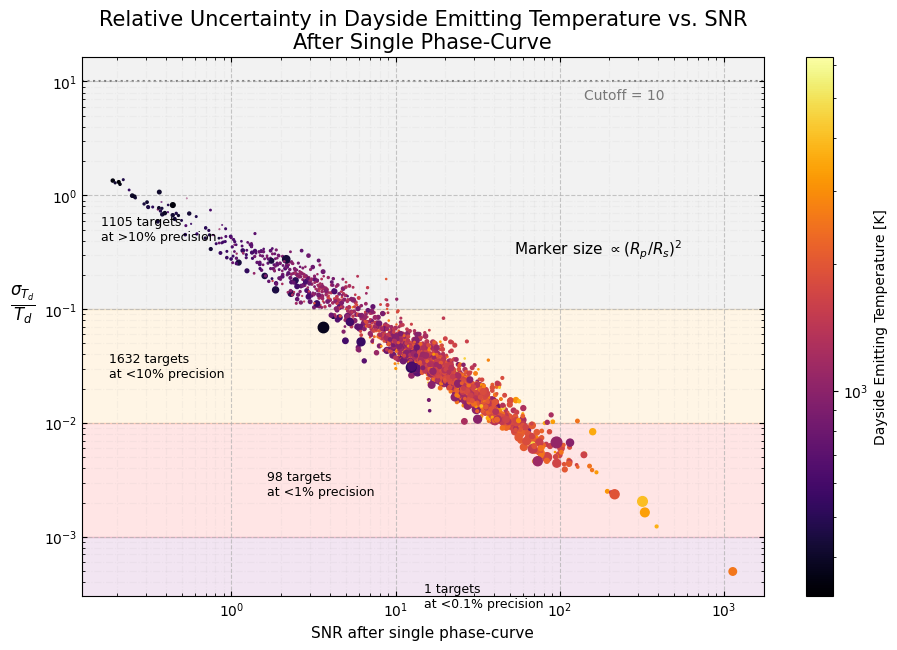

In [28]:
fig, ax = plt.subplots(figsize=(11, 7))

ax.set_yscale('log')
ax.set_xscale('log')

reduced = combined[(combined["Relative Dayside Temperature Uncertainty Average"] <= 10) &
                   (combined["Tier 1 ESM single PC"] > 1e-1)]

cax = reduced.plot(x='Tier 1 ESM single PC', y='Relative Dayside Temperature Uncertainty Average', kind='scatter', marker='o', 
             c='Dayside Emitting Temperature [K]', cmap='inferno', norm='log', s='Rp/Rs scaled', ax=ax, zorder=2)

ax.grid(True, which='major', linestyle='--', alpha=0.7, zorder=0)
ax.grid(True, which='minor', linestyle='-.', alpha=0.1, zorder=0)

ax.tick_params(axis='both', which='both', direction='in', top=True, right=True)

ax.text(5.3e1, 3e-1, r"Marker size $\propto (R_p/R_s)^2$", fontsize=11)

ax.axhline(10, color='black', linestyle=':', alpha=0.5, zorder=1)
ax.text(1.4e2, 7, "Cutoff = 10", fontsize=10, alpha=0.5)

ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin, ymax)

ax.axhspan(1e-1, ymax, color='grey', alpha=0.1)
ax.axhspan(1e-2, 1e-1, color='orange', alpha=0.1)
ax.axhspan(1e-3, 1e-2, color='red', alpha=0.1)
ax.axhspan(0, 1e-3, color='purple', alpha=0.1)

ax.text(1.6e-1, 4e-1, f"{over_one_percent} targets\nat >10% precision", fontsize=9, color='black')
ax.text(1.8e-1, 2.5e-2, f"{under_one_percent + under_two_percent + under_three_percent} targets\nat <10% precision", fontsize=9, color='black')
ax.text(1.65e0, 2.3e-3, f"{under_two_percent + under_three_percent} targets\nat <1% precision", fontsize=9, color='black')
ax.text(1.5e1, 2.4e-4, f"{under_three_percent} targets\nat <0.1% precision", fontsize=9, color='black')

ax.set_ylabel(r"$\frac{\sigma_{T_d}}{T_d}$", fontsize=17, rotation='horizontal', labelpad=15)
ax.set_xlabel("SNR after single phase-curve", fontsize=11)

ax.set_title("Relative Uncertainty in Dayside Emitting Temperature vs. SNR\nAfter Single Phase-Curve", fontsize=15)

plt.show()

In [31]:
reduced_known = known[(known["Relative Dayside Temperature Uncertainty Average"] <= 10) &
                   (known["Tier 1 ESM single PC"] > 1e-1)]

known["Relative Dayside Temperature Uncertainty Average"]

0      inf
1      inf
2      inf
3      inf
4      inf
      ... 
692    inf
693    inf
694    inf
695    inf
696    inf
Name: Relative Dayside Temperature Uncertainty Average, Length: 697, dtype: float64

In [ ]:
fig, ax = plt.subplots(figsize=(12, 7))

ax.set_yscale('log')
ax.set_xscale('log')

reduced_known = known[(known["Relative Dayside Temperature Uncertainty Average"] <= 10) &
                   (known["Tier 1 ESM single PC"] > 1e-1)]
reduced_tpcs = tpcs[(tpcs["Relative Dayside Temperature Uncertainty Average"] <= 10) &
                   (tpcs["Tier 1 ESM single PC"] > 1e-1)]

norm = colors.LogNorm(vmin=min(reduced_known['Dayside Emitting Temperature [K]'].min(), 
                               reduced_tpcs['Dayside Emitting Temperature [K]'].min()),
                      vmax=max(reduced_known['Dayside Emitting Temperature [K]'].max(), 
                               reduced_tpcs['Dayside Emitting Temperature [K]'].max()))

sc1 = ax.scatter(reduced_known['Tier 1 ESM single PC'],
                 reduced_known['Relative Dayside Temperature Uncertainty Average'],
                 c=reduced_known['Dayside Emitting Temperature [K]'],
                 cmap='inferno', norm=norm, s=reduced_known['Rp/Rs scaled'], marker='o',
                 zorder=2,
                 label='Known')

c = reduced_tpcs['Dayside Emitting Temperature [K]']
cmap = plt.get_cmap('inferno')
sc2 = ax.scatter(reduced_tpcs['Tier 1 ESM single PC'],
                 reduced_tpcs['Relative Dayside Temperature Uncertainty Average'],
                 facecolor='none', edgecolors=cmap(norm(c)),
                 s=reduced_tpcs['Rp/Rs scaled'], marker='o',
                 zorder=2,
                 label='TPCs')

cbar = fig.colorbar(sc1, ax=ax)
cbar.set_label('Dayside Emitting Temperature [K]')

ax.grid(True, which='major', linestyle='--', alpha=0.7, zorder=0)
ax.grid(True, which='minor', linestyle='-.', alpha=0.1, zorder=0)

ax.tick_params(axis='both', which='both', direction='in', top=True, right=True)

ax.text(5.3e1, 3e-1, r"Marker size $\propto (R_p/R_s)^2$", fontsize=11)

ax.axhline(10, color='black', linestyle=':', alpha=0.5, zorder=1)
ax.text(3e1, 7, "Cutoff = 10", fontsize=10, alpha=0.5)

ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin, ymax)

ax.axhspan(1e-1, ymax, color='grey', alpha=0.1)
ax.axhspan(1e-2, 1e-1, color='orange', alpha=0.1)
ax.axhspan(1e-3, 1e-2, color='red', alpha=0.1)
ax.axhspan(0, 1e-3, color='purple', alpha=0.1)

ax.text(1.6e-1, 4e-1, f"{over_one_percent} targets\nat >10% precision", fontsize=9, color='black')
ax.text(1.8e-1, 2.5e-2, f"{under_one_percent + under_two_percent + under_three_percent} targets\nat <10% precision", fontsize=9, color='black')
ax.text(1.65e0, 2.3e-3, f"{under_two_percent + under_three_percent} targets\nat <1% precision", fontsize=9, color='black')
ax.text(1.5e1, 2.4e-4, f"{under_three_percent} targets\nat <0.1% precision", fontsize=9, color='black')

ax.legend(loc=(0.82, 0.88), fancybox=False, framealpha=1)

ax.set_ylabel(r"$\frac{\sigma_{T_d}}{T_d}$", fontsize=17, rotation='horizontal', labelpad=15)
ax.set_xlabel("SNR after single phase-curve", fontsize=11)

ax.set_title("Relative Uncertainty in Dayside Emitting Temperature vs. SNR\nAfter Single Phase-Curve", fontsize=15)

plt.savefig("Results Plots/Relative uncertainty in dayside temperature vs. SNR after single phase-curve.png", dpi=300, bbox_inches='tight')

plt.show()

ValueError: Invalid vmin or vmax

Error in callback <function _draw_all_if_interactive at 0x0000024EAB7A6C00> (for post_execute):


ValueError: Invalid vmin or vmax

ValueError: Invalid vmin or vmax

<Figure size 1200x700 with 1 Axes>

In [ ]:
fig, ax = plt.subplots(figsize=(12, 7))

ax.set_yscale('log')
ax.set_xscale('log')

reduced_known = known[(known["Relative Dayside Temperature Uncertainty Average"] <= 10) &
                   (known["Tier 1 ESM single PC"] > 1e-1)]
reduced_tpcs = tpcs[(tpcs["Relative Dayside Temperature Uncertainty Average"] <= 10) &
                   (tpcs["Tier 1 ESM single PC"] > 1e-1)]

norm = colors.LogNorm(vmin=min(reduced_known['Dayside Emitting Temperature [K]'].min(), 
                               reduced_tpcs['Dayside Emitting Temperature [K]'].min()),
                      vmax=max(reduced_known['Dayside Emitting Temperature [K]'].max(), 
                               reduced_tpcs['Dayside Emitting Temperature [K]'].max()))

sc1 = ax.scatter(reduced_known['Tier 1 ESM single PC'],
                 reduced_known['Relative Dayside Temperature Uncertainty Average']*reduced_known['Dayside Emitting Temperature [K]'],
                 c=reduced_known['Dayside Emitting Temperature [K]'],
                 cmap='inferno', norm=norm, s=reduced_known['Rp/Rs scaled'], marker='o',
                 zorder=2,
                 label='Known')

c = reduced_tpcs['Dayside Emitting Temperature [K]']
cmap = plt.get_cmap('inferno')
sc2 = ax.scatter(reduced_tpcs['Tier 1 ESM single PC'],
                 reduced_tpcs['Relative Dayside Temperature Uncertainty Average']*reduced_tpcs['Dayside Emitting Temperature [K]'],
                 facecolor='none', edgecolors=cmap(norm(c)), s=reduced_tpcs['Rp/Rs scaled'], marker='o',
                 zorder=2,
                 label='TPCs')

cbar = fig.colorbar(sc1, ax=ax)
cbar.set_label('Dayside Emitting Temperature [K]')

ax.grid(True, which='major', linestyle='--', alpha=0.7, zorder=0)
ax.grid(True, which='minor', linestyle='-.', alpha=0.1, zorder=0)

ax.tick_params(axis='both', which='both', direction='in', top=True, right=True)

ax.text(5.3e1, 3e2, r"Marker size $\propto (R_p/R_s)^2$", fontsize=11)

ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin, ymax)

ax.legend(loc=(0.82, 0.88), fancybox=False, framealpha=1)

ax.set_ylabel(r"$\sigma_{T_d}$", fontsize=12, rotation='horizontal', labelpad=15)
ax.set_xlabel("SNR after single phase-curve", fontsize=11)

ax.set_title("Absolute Uncertainty in Dayside Emitting Temperature vs. SNR\nAfter Single Phase-Curve", fontsize=15)

plt.savefig("Results Plots/Absolute uncertainty in dayside temperature vs. SNR after single phase-curve.png", dpi=300, bbox_inches='tight')

plt.show()

ValueError: Invalid vmin or vmax

Error in callback <function _draw_all_if_interactive at 0x000001D79AA5EAC0> (for post_execute):


ValueError: Invalid vmin or vmax

ValueError: Invalid vmin or vmax

<Figure size 1200x700 with 1 Axes>

In [ ]:
fig, ax = plt.subplots(figsize=(12, 7))

ax.set_yscale('log')
ax.set_xscale('log')

reduced_known = known[(known["Relative Dayside Temperature Uncertainty Average"] <= 3) &
                   (known["Tier 1 ESM single PC"] > 1e-1)]
reduced_tpcs = tpcs[(tpcs["Relative Dayside Temperature Uncertainty Average"] <= 3) &
                   (tpcs["Tier 1 ESM single PC"] > 1e-1)]

norm = colors.LogNorm(vmin=min(reduced_known['Dayside Emitting Temperature [K]'].min(), 
                               reduced_tpcs['Dayside Emitting Temperature [K]'].min()),
                      vmax=max(reduced_known['Dayside Emitting Temperature [K]'].max(), 
                               reduced_tpcs['Dayside Emitting Temperature [K]'].max()))

sc1 = ax.scatter(reduced_known['Planet Period [days]'],
                 reduced_known['Relative Dayside Temperature Uncertainty Average'],
                 c=reduced_known['Dayside Emitting Temperature [K]'],
                 cmap='inferno', norm=norm, s=reduced_known['Rp/Rs scaled'], marker='o',
                 zorder=2,
                 label='Known')


c = reduced_tpcs['Dayside Emitting Temperature [K]']
cmap = plt.get_cmap('inferno')
sc2 = ax.scatter(reduced_tpcs['Planet Period [days]'],
                 reduced_tpcs['Relative Dayside Temperature Uncertainty Average'],
                 facecolor='none', edgecolors=cmap(norm(c)), s=reduced_tpcs['Rp/Rs scaled'], marker='o',
                 zorder=2,
                 label='TPCs')

cbar = fig.colorbar(sc1, ax=ax)
cbar.set_label('Dayside Emitting Temperature [K]')

ax.grid(True, which='major', linestyle='--', alpha=0.7, zorder=0)
ax.grid(True, which='minor', linestyle='-.', alpha=0.1, zorder=0)

ax.tick_params(axis='both', which='both', direction='in', top=True, right=True)

ax.text(2e1, 1.7e-3, r"Marker size $\propto (R_p/R_s)^2$", fontsize=11)

# ax.axhline(10, color='black', linestyle=':', alpha=0.5, zorder=1)
# ax.text(2e1, 7, "Cutoff = 10", fontsize=10, alpha=0.5)

ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin, ymax)

ax.axhspan(1e-1, ymax, color='grey', alpha=0.1)
ax.axhspan(1e-2, 1e-1, color='orange', alpha=0.1)
ax.axhspan(1e-3, 1e-2, color='red', alpha=0.1)
ax.axhspan(0, 1e-3, color='purple', alpha=0.1)

ax.text(1.7e-1, 2.5e-1, f"{over_one_percent} targets\nat >10% precision", fontsize=9, color='black')
ax.text(1.7e-1, 2.5e-2, f"{under_one_percent + under_two_percent + under_three_percent} targets\nat <10% precision", fontsize=9, color='black')
ax.text(1.7e-1, 3e-3, f"{under_two_percent + under_three_percent} targets\nat <1% precision", fontsize=9, color='black')
ax.text(1.7e-1, 5e-4, f"{under_three_percent} targets\nat <0.1% precision", fontsize=9, color='black')


ax.axvline(3, color='black', linestyle=':', linewidth=2, alpha=0.7, zorder=3)
ax.axvline(11/24, color='black', linestyle=':', linewidth=2, alpha=0.7, zorder=3)

ax.legend(loc=(0.84, 0.88), fancybox=False, framealpha=1, fontsize=12)

ax.set_ylabel(r"$\frac{\sigma_{T_d}}{T_d}$", fontsize=20, rotation='horizontal', labelpad=15)
ax.set_xlabel("Planet Period [days]", fontsize=15)

ax.set_title("Relative Uncertainty in Dayside Emitting Temperature vs. SNR\nAfter Single Phase-Curve", fontsize=18)

plt.savefig("Results Plots/Relative uncertainty in dayside temperature vs. planet period.png", dpi=300, bbox_inches='tight')

plt.show()

ValueError: Invalid vmin or vmax

Error in callback <function _draw_all_if_interactive at 0x000001D79AA5EAC0> (for post_execute):


ValueError: Invalid vmin or vmax

ValueError: Invalid vmin or vmax

<Figure size 1200x700 with 1 Axes>

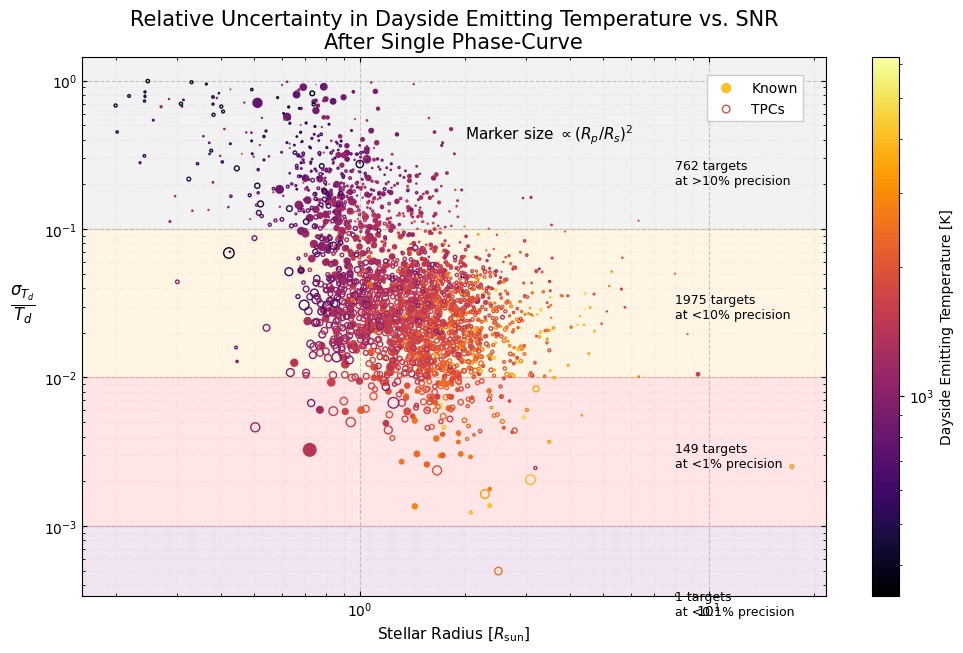

In [ ]:
fig, ax = plt.subplots(figsize=(12, 7))

ax.set_yscale('log')
ax.set_xscale('log')

reduced_known = known[(known["Relative Dayside Temperature Uncertainty Average"] <= 1) &
                   (known["Tier 1 ESM single PC"] > 1e-1)]
reduced_tpcs = tpcs[(tpcs["Relative Dayside Temperature Uncertainty Average"] <= 1) &
                   (tpcs["Tier 1 ESM single PC"] > 1e-1)]

norm = colors.LogNorm(vmin=min(reduced_known['Dayside Emitting Temperature [K]'].min(), 
                               reduced_tpcs['Dayside Emitting Temperature [K]'].min()),
                      vmax=max(reduced_known['Dayside Emitting Temperature [K]'].max(), 
                               reduced_tpcs['Dayside Emitting Temperature [K]'].max()))

sc1 = ax.scatter(reduced_known['Star Radius [Rs]'],
                 reduced_known['Relative Dayside Temperature Uncertainty Average'],
                 c=reduced_known['Dayside Emitting Temperature [K]'],
                 cmap='inferno', norm=norm, s=reduced_known['Rp/Rs scaled'], marker='o',
                 zorder=2,
                 label='Known')


c = reduced_tpcs['Dayside Emitting Temperature [K]']
cmap = plt.get_cmap('inferno')
sc2 = ax.scatter(reduced_tpcs['Star Radius [Rs]'],
                 reduced_tpcs['Relative Dayside Temperature Uncertainty Average'],
                 s=reduced_tpcs['Rp/Rs scaled'], marker='o',
                 facecolors='none', edgecolors=cmap(norm(c)),
                 zorder=2,
                 label='TPCs')

cbar = fig.colorbar(sc1, ax=ax)
cbar.set_label('Dayside Emitting Temperature [K]')

ax.grid(True, which='major', linestyle='--', alpha=0.7, zorder=0)
ax.grid(True, which='minor', linestyle='-.', alpha=0.1, zorder=0)

ax.tick_params(axis='both', which='both', direction='in', top=True, right=True)

ax.text(2e0, 4e-1, r"Marker size $\propto (R_p/R_s)^2$", fontsize=11)

# ax.axhline(10, color='black', linestyle=':', alpha=0.5, zorder=1)
# ax.text(2e1, 7, "Cutoff = 10", fontsize=10, alpha=0.5)

ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin, ymax)

ax.axhspan(1e-1, ymax, color='grey', alpha=0.1)
ax.axhspan(1e-2, 1e-1, color='orange', alpha=0.1)
ax.axhspan(1e-3, 1e-2, color='red', alpha=0.1)
ax.axhspan(0, 1e-3, color='purple', alpha=0.1)

ax.text(8e0, 2e-1, f"{over_one_percent} targets\nat >10% precision", fontsize=9, color='black')
ax.text(8e0, 2.5e-2, f"{under_one_percent + under_two_percent + under_three_percent} targets\nat <10% precision", fontsize=9, color='black')
ax.text(8e0, 2.5e-3, f"{under_two_percent + under_three_percent} targets\nat <1% precision", fontsize=9, color='black')
ax.text(8e0, 2.5e-4, f"{under_three_percent} targets\nat <0.1% precision", fontsize=9, color='black')

ax.legend(loc=(0.84, 0.88), fancybox=False, framealpha=1)

ax.set_ylabel(r"$\frac{\sigma_{T_d}}{T_d}$", fontsize=17, rotation='horizontal', labelpad=15)
ax.set_xlabel(r"Stellar Radius [$R_\text{sun}$]", fontsize=11)

ax.set_title("Relative Uncertainty in Dayside Emitting Temperature vs. SNR\nAfter Single Phase-Curve", fontsize=15)

plt.savefig("Results Plots/Relative uncertainty in dayside temperature vs Rs.png", dpi=300, bbox_inches='tight')

plt.show()

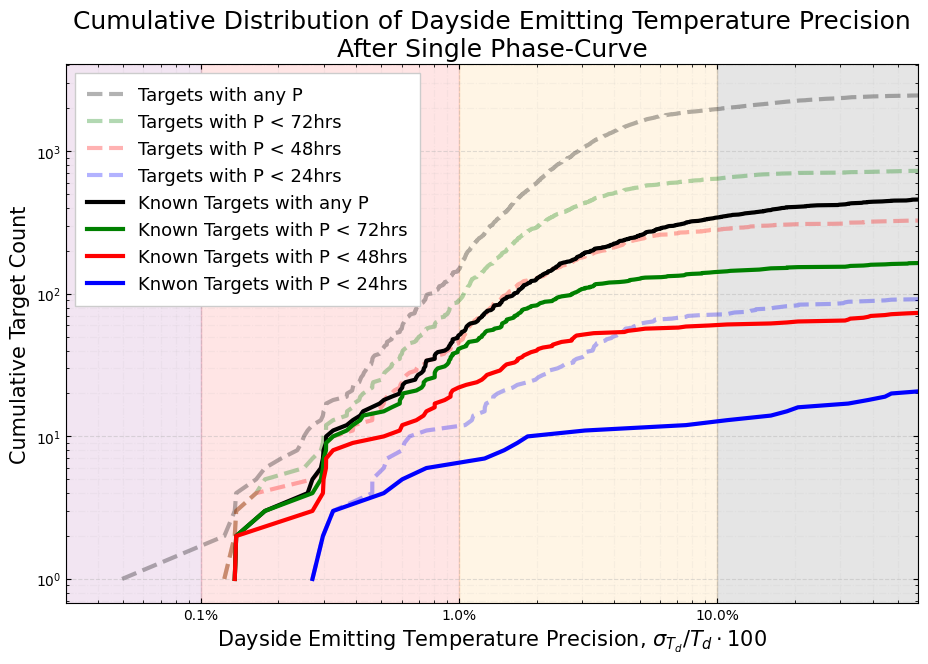

TODO: 
1. Add ALL lines to legend
2. Put them in order
3. Remove text ('dashed lines...' etc)
4. Increase fontsize FOR EVERYTHING (make them roughly the size of the title)


In [93]:
# cumulative distribution of Tday precision

reduced = combined[combined["Relative Dayside Temperature Uncertainty Average"] > 0]
reduced.sort_values(by="Relative Dayside Temperature Uncertainty Average", inplace=True)
cumulative_counts = np.arange(1, len(reduced) + 1)

fig, ax = plt.subplots(figsize=(11, 7))

ax.set_xscale('log')
ax.set_yscale('log')

ax.plot(reduced['Relative Dayside Temperature Uncertainty Average'], cumulative_counts, c='black', linestyle='--', linewidth=3, zorder=2, alpha=0.3, label="Targets with any P")


P_lt_72h = reduced[reduced["Planet Period [days]"] < 3]
cumulative_counts_Plt72 = np.arange(1, len(P_lt_72h) + 1)
P_lt_72h_all = P_lt_72h.shape[0]
P_lt_72h_U10 = P_lt_72h[P_lt_72h["Relative Dayside Temperature Uncertainty Average"] < 1e-1].shape[0]
P_lt_72h_U1 = P_lt_72h[P_lt_72h["Relative Dayside Temperature Uncertainty Average"] < 1e-2].shape[0]
P_lt_72h_U0_1 = P_lt_72h[P_lt_72h["Relative Dayside Temperature Uncertainty Average"] < 1e-3].shape[0]
ax.plot(P_lt_72h['Relative Dayside Temperature Uncertainty Average'], cumulative_counts_Plt72, c='green', linestyle='--', linewidth=3, zorder=2, alpha=0.3, label="Targets with P < 72hrs")

P_lt_48h = reduced[reduced["Planet Period [days]"] < 2]
cumulative_counts_Plt48 = np.arange(1, len(P_lt_48h) + 1)
P_lt_48h_all = P_lt_48h.shape[0]
P_lt_48h_U10 = P_lt_48h[P_lt_48h["Relative Dayside Temperature Uncertainty Average"] < 1e-1].shape[0]
P_lt_48h_U1 = P_lt_48h[P_lt_48h["Relative Dayside Temperature Uncertainty Average"] < 1e-2].shape[0]
P_lt_48h_U0_1 = P_lt_48h[P_lt_48h["Relative Dayside Temperature Uncertainty Average"] < 1e-3].shape[0]
ax.plot(P_lt_48h['Relative Dayside Temperature Uncertainty Average'], cumulative_counts_Plt48, c='red', linestyle='--', linewidth=3, zorder=2, alpha=0.3, label="Targets with P < 48hrs")

P_lt_24h = reduced[reduced["Planet Period [days]"] < 1]
cumulative_counts_Plt24 = np.arange(1, len(P_lt_24h) + 1)
P_lt_24h_all = P_lt_24h.shape[0]
P_lt_24h_U10 = P_lt_24h[P_lt_24h["Relative Dayside Temperature Uncertainty Average"] < 1e-1].shape[0]
P_lt_24h_U1 = P_lt_24h[P_lt_24h["Relative Dayside Temperature Uncertainty Average"] < 1e-2].shape[0]
P_lt_24h_U0_1 = P_lt_24h[P_lt_24h["Relative Dayside Temperature Uncertainty Average"] < 1e-3].shape[0]
ax.plot(P_lt_24h['Relative Dayside Temperature Uncertainty Average'], cumulative_counts_Plt24, c='blue', linestyle='--', linewidth=3, zorder=2, alpha=0.3, label="Targets with P < 24hrs")



## KNOWN
known_allP = reduced[reduced['Known'] == True]
cumulative_counts_known = np.arange(1, len(known_allP) + 1)
known_allP_all= known_allP.shape[0]
known_allP_U10 = known_allP[known_allP["Relative Dayside Temperature Uncertainty Average"] < 1e-1].shape[0]
known_allP_U1 = known_allP[known_allP["Relative Dayside Temperature Uncertainty Average"] < 1e-2].shape[0]
known_allP_U0_1 = known_allP[known_allP["Relative Dayside Temperature Uncertainty Average"] < 1e-3].shape[0]
ax.plot(known_allP['Relative Dayside Temperature Uncertainty Average'], cumulative_counts_known, c='black', linewidth=3, zorder=2, label="Known Targets with any P")

P_lt_72h = reduced[(reduced["Planet Period [days]"] < 3) & (reduced["Known"] == True)]
cumulative_counts_Plt72 = np.arange(1, len(P_lt_72h) + 1)
P_lt_72h_Known_all = P_lt_72h.shape[0]
P_lt_72h_Known_U10 = P_lt_72h[P_lt_72h["Relative Dayside Temperature Uncertainty Average"] < 1e-1].shape[0]
P_lt_72h_Known_U1 = P_lt_72h[P_lt_72h["Relative Dayside Temperature Uncertainty Average"] < 1e-2].shape[0]
P_lt_72h_Known_U0_1 = P_lt_72h[P_lt_72h["Relative Dayside Temperature Uncertainty Average"] < 1e-3].shape[0]
ax.plot(P_lt_72h['Relative Dayside Temperature Uncertainty Average'], cumulative_counts_Plt72, c='green', linewidth=3, zorder=2, label="Known Targets with P < 72hrs")

P_lt_48h = reduced[(reduced["Planet Period [days]"] < 2) & (reduced["Known"] == True)]
cumulative_counts_Plt48 = np.arange(1, len(P_lt_48h) + 1)
P_lt_48h_Known_all = P_lt_48h.shape[0]
P_lt_48h_Known_U10 = P_lt_48h[P_lt_48h["Relative Dayside Temperature Uncertainty Average"] < 1e-1].shape[0]
P_lt_48h_Known_U1 = P_lt_48h[P_lt_48h["Relative Dayside Temperature Uncertainty Average"] < 1e-2].shape[0]
P_lt_48h_Known_U0_1 = P_lt_48h[P_lt_48h["Relative Dayside Temperature Uncertainty Average"] < 1e-3].shape[0]
ax.plot(P_lt_48h['Relative Dayside Temperature Uncertainty Average'], cumulative_counts_Plt48, c='red', linewidth=3, zorder=2, label="Known Targets with P < 48hrs")

P_lt_24h = reduced[(reduced["Planet Period [days]"] < 1) & (reduced["Known"] == True)]
cumulative_counts_Plt24 = np.arange(1, len(P_lt_24h) + 1)
P_lt_24h_Known_all = P_lt_24h.shape[0]
P_lt_24h_Known_U10 = P_lt_24h[P_lt_24h["Relative Dayside Temperature Uncertainty Average"] < 1e-1].shape[0]
P_lt_24h_Known_U1 = P_lt_24h[P_lt_24h["Relative Dayside Temperature Uncertainty Average"] < 1e-2].shape[0]
P_lt_24h_Known_U0_1 = P_lt_24h[P_lt_24h["Relative Dayside Temperature Uncertainty Average"] < 1e-3].shape[0]
ax.plot(P_lt_24h['Relative Dayside Temperature Uncertainty Average'], cumulative_counts_Plt24, c='blue', linewidth=3, zorder=2, label="Knwon Targets with P < 24hrs")

xmin, xmax = 3e-4, 0.6
ax.set_xlim(xmin, xmax)
# ax.set_ylim(None, 4000)

# ax.axhline(under_three_percent, xmax=0.2, color='blue', linestyle=':', alpha=1, zorder=1)
# ax.axhline(under_three_percent + under_two_percent, xmax=0.4, color='red', linestyle=':', alpha=1, zorder=1)
# ax.axhline(under_three_percent + under_two_percent + under_one_percent, xmax=0.59, color='orange', linestyle=':', alpha=1, zorder=1)
# ax.axhline(under_three_percent + under_two_percent + under_one_percent + over_one_percent, color='black', linestyle=':', alpha=0.5, zorder=1)

# ax.text(1.2e-4, 40, f"{under_three_percent} targets\nat <0.1% precision", fontsize=9, color='black')
# ax.text(2.3e-4, 1235, f"{under_three_percent + under_two_percent} targets at <1% precision", fontsize=9, color='black')
# ax.text(8e-4, 2475, f"{under_three_percent + under_two_percent + under_one_percent} targets at <10% precision", fontsize=9, color='black')
# ax.text(4e-2, 2770, f"{under_three_percent + under_two_percent + under_one_percent + over_one_percent} targets total", fontsize=9, color='black')


ax.axvspan(xmin, 1e-3, color='purple', alpha=0.1)
ax.axvspan(1e-3, 1e-2, color='red', alpha=0.1)
ax.axvspan(1e-2, 1e-1, color='orange', alpha=0.1)
ax.axvspan(1e-1, xmax, color='black', alpha=0.1)

ax.tick_params(axis='both', which='both', direction='in', top=True, right=True)
ax.minorticks_on()

ax.set_xticklabels([f"{i*100}%" for i in ax.get_xticks()])

ax.grid(True, which='major', linestyle='--', alpha=0.4, zorder=0)
ax.grid(True, which='minor', linestyle='-.', alpha=0.1, zorder=0)

ax.set_xlabel(r"Dayside Emitting Temperature Precision, $\sigma_{T_d}/T_d \cdot 100$", fontsize=15)
ax.set_ylabel("Cumulative Target Count", fontsize=15)

ax.legend(loc='upper left', fontsize=13, fancybox=False, framealpha=1, borderpad=.7)

ax.set_title("Cumulative Distribution of Dayside Emitting Temperature Precision\nAfter Single Phase-Curve", fontsize=18)

plt.savefig("Results Plots/Cumulative distribution of dayside temperature precision after single phase-curve.png", dpi=300, bbox_inches='tight')

plt.show()

print("TODO: \n1. Add ALL lines to legend\n2. Put them in order\n3. Remove text ('dashed lines...' etc)\n4. Increase fontsize FOR EVERYTHING (make them roughly the size of the title)")

In [90]:
# tabulate the number of targets at each precision level
num_targets = pd.DataFrame({"All Targets": [over_one_percent, under_one_percent+under_two_percent+under_three_percent, under_two_percent+under_three_percent, under_three_percent]},
                index=["Over 10%", "Under 10%", "Under 1%", "Under 0.1%"])

num_targets["All Targets P < 24hrs"] = [P_lt_24h_all, P_lt_24h_U10, P_lt_24h_U1, P_lt_24h_U0_1]
num_targets["All Targets P < 48hrs"] = [P_lt_48h_all, P_lt_48h_U10, P_lt_48h_U1, P_lt_48h_U0_1]
num_targets["All Targets P < 72hrs"] = [P_lt_72h_all, P_lt_72h_U10, P_lt_72h_U1, P_lt_72h_U0_1]

num_targets["All Known Targets"] = [known_allP_all, known_allP_U10, known_allP_U1, known_allP_U0_1]
num_targets["All Known Targets P < 24hrs"] = [P_lt_24h_Known_all, P_lt_24h_Known_U10, P_lt_24h_Known_U1, P_lt_24h_Known_U0_1]
num_targets["All Known Targets P < 48hrs"] = [P_lt_48h_Known_all, P_lt_48h_Known_U10, P_lt_48h_Known_U1, P_lt_48h_Known_U0_1]
num_targets["All Known Targets P < 72hrs"] = [P_lt_72h_Known_all, P_lt_72h_Known_U10, P_lt_72h_Known_U1, P_lt_72h_Known_U0_1]

num_targets

,All Targets,All Targets P < 24hrs,All Targets P < 48hrs,All Targets P < 72hrs,All Known Targets,All Known Targets P < 24hrs,All Known Targets P < 48hrs,All Known Targets P < 72hrs
Over 10%,762,101,353,772,697,29,98,202
Under 10%,1975,71,281,641,343,12,60,142
Under 1%,149,11,46,90,51,6,22,41
Under 0.1%,1,0,0,0,0,0,0,0


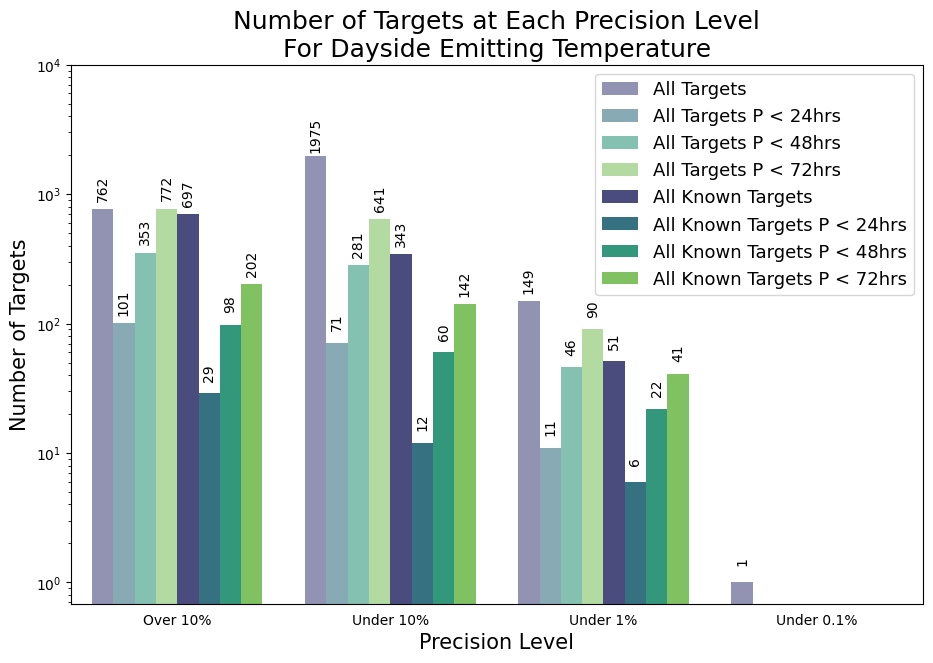

In [92]:
num_targets_melted = num_targets.reset_index().melt(id_vars='index', var_name='Category', value_name='Value')

def lighten_color(color, amount=0.5):
    try:
        c = colors.to_rgb(color)
    except ValueError:
        c = color
    return [(1 - amount) * component + amount for component in c]

base_palette = sns.color_palette("viridis", 4)
lightened_palette = [lighten_color(c, amount=0.4) for c in base_palette]

color_mapping = {
    "All Targets": lightened_palette[0],
    "All Targets P < 24hrs": lightened_palette[1],
    "All Targets P < 48hrs": lightened_palette[2],
    "All Targets P < 72hrs": lightened_palette[3],
    "All Known Targets": base_palette[0],
    "All Known Targets P < 24hrs": base_palette[1],
    "All Known Targets P < 48hrs": base_palette[2],
    "All Known Targets P < 72hrs": base_palette[3],
}

plt.figure(figsize=(11, 7))
ax = sns.barplot(x='index', y='Value', hue='Category', data=num_targets_melted, width=0.8, palette=color_mapping)

plt.yscale('log')

for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 15), 
                textcoords = 'offset points', 
                rotation=90)
    
plt.xlabel('Precision Level', fontsize=15)
plt.ylabel('Number of Targets', fontsize=15)

plt.ylim(None, 1e4)

plt.tick_params(bottom=False)

plt.title('Number of Targets at Each Precision Level\nFor Dayside Emitting Temperature', fontsize=18)
plt.legend(fontsize=13)

plt.savefig("Results Plots/Number of targets at each precision level for dayside temperature.png", dpi=300, bbox_inches='tight')

plt.show()

In [69]:
combined["RSM 1 PC"] = combined["RSM"] / np.sqrt(combined["Observations RSM"])
combined["Relative Geometric Albedo Uncertainty Average"] = 1 / combined["RSM 1 PC"]

over_one_percent = combined[(combined["Relative Geometric Albedo Uncertainty Average"] > 1e-1)].shape[0] 

under_one_percent = combined[(combined["Relative Geometric Albedo Uncertainty Average"] <= 1e-1) & 
                             (combined["Relative Geometric Albedo Uncertainty Average"] > 1e-2)].shape[0] 

under_two_percent = combined[(combined["Relative Geometric Albedo Uncertainty Average"] <= 1e-2) & 
                             (combined["Relative Geometric Albedo Uncertainty Average"] > 1e-3)].shape[0] 

under_three_percent = combined[(combined["Relative Geometric Albedo Uncertainty Average"] <= 1e-3)].shape[0] 

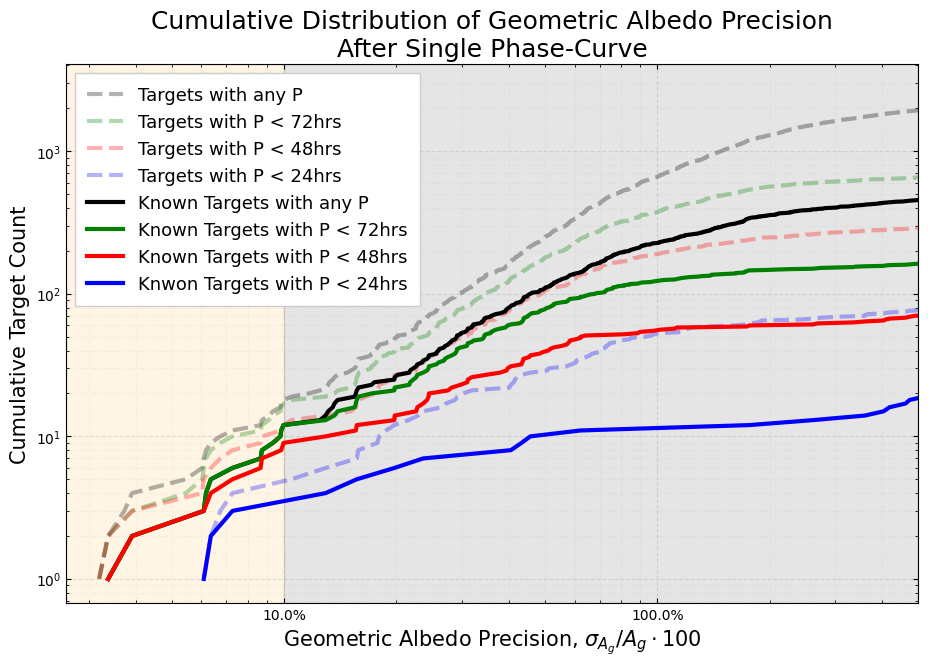

In [70]:
# cumulative distribution of geometric albedo precision after one FPC

reduced = combined[combined["Relative Geometric Albedo Uncertainty Average"] > 0]

reduced.sort_values(by="Relative Geometric Albedo Uncertainty Average", inplace=True)
cumulative_counts = np.arange(1, len(reduced) + 1)


fig, ax = plt.subplots(figsize=(11, 7))

ax.set_xscale('log')
ax.set_yscale('log')

ax.plot(reduced['Relative Geometric Albedo Uncertainty Average'], cumulative_counts, c='black', linestyle='--', linewidth=3, zorder=2, alpha=0.3, label="Targets with any P")


P_lt_72h = reduced[reduced["Planet Period [days]"] < 3]
cumulative_counts_Plt72 = np.arange(1, len(P_lt_72h) + 1)
P_lt_72h_all = P_lt_72h.shape[0]
P_lt_72h_U10 = P_lt_72h[P_lt_72h["Relative Geometric Albedo Uncertainty Average"] < 1e-1].shape[0]
P_lt_72h_U1 = P_lt_72h[P_lt_72h["Relative Geometric Albedo Uncertainty Average"] < 1e-2].shape[0]
P_lt_72h_U0_1 = P_lt_72h[P_lt_72h["Relative Geometric Albedo Uncertainty Average"] < 1e-3].shape[0]
ax.plot(P_lt_72h['Relative Geometric Albedo Uncertainty Average'], cumulative_counts_Plt72, c='green', linestyle='--', linewidth=3, zorder=2, alpha=0.3, label="Targets with P < 72hrs")

P_lt_48h = reduced[reduced["Planet Period [days]"] < 2]
cumulative_counts_Plt48 = np.arange(1, len(P_lt_48h) + 1)
P_lt_48h_all = P_lt_48h.shape[0]
P_lt_48h_U10 = P_lt_48h[P_lt_48h["Relative Geometric Albedo Uncertainty Average"] < 1e-1].shape[0]
P_lt_48h_U1 = P_lt_48h[P_lt_48h["Relative Geometric Albedo Uncertainty Average"] < 1e-2].shape[0]
P_lt_48h_U0_1 = P_lt_48h[P_lt_48h["Relative Geometric Albedo Uncertainty Average"] < 1e-3].shape[0]
ax.plot(P_lt_48h['Relative Geometric Albedo Uncertainty Average'], cumulative_counts_Plt48, c='red', linestyle='--', linewidth=3, zorder=2, alpha=0.3, label="Targets with P < 48hrs")

P_lt_24h = reduced[reduced["Planet Period [days]"] < 1]
cumulative_counts_Plt24 = np.arange(1, len(P_lt_24h) + 1)
P_lt_24h_all = P_lt_24h.shape[0]
P_lt_24h_U10 = P_lt_24h[P_lt_24h["Relative Geometric Albedo Uncertainty Average"] < 1e-1].shape[0]
P_lt_24h_U1 = P_lt_24h[P_lt_24h["Relative Geometric Albedo Uncertainty Average"] < 1e-2].shape[0]
P_lt_24h_U0_1 = P_lt_24h[P_lt_24h["Relative Geometric Albedo Uncertainty Average"] < 1e-3].shape[0]
ax.plot(P_lt_24h['Relative Geometric Albedo Uncertainty Average'], cumulative_counts_Plt24, c='blue', linestyle='--', linewidth=3, zorder=2, alpha=0.3, label="Targets with P < 24hrs")



## KNOWN
known_allP = reduced[reduced['Known'] == True]
cumulative_counts_known = np.arange(1, len(known_allP) + 1)
known_allP_all= known_allP.shape[0]
known_allP_U10 = known_allP[known_allP["Relative Geometric Albedo Uncertainty Average"] < 1e-1].shape[0]
known_allP_U1 = known_allP[known_allP["Relative Geometric Albedo Uncertainty Average"] < 1e-2].shape[0]
known_allP_U0_1 = known_allP[known_allP["Relative Geometric Albedo Uncertainty Average"] < 1e-3].shape[0]
ax.plot(known_allP['Relative Geometric Albedo Uncertainty Average'], cumulative_counts_known, c='black', linewidth=3, zorder=2, label="Known Targets with any P")

P_lt_72h = reduced[(reduced["Planet Period [days]"] < 3) & (reduced["Known"] == True)]
cumulative_counts_Plt72 = np.arange(1, len(P_lt_72h) + 1)
P_lt_72h_Known_all = P_lt_72h.shape[0]
P_lt_72h_Known_U10 = P_lt_72h[P_lt_72h["Relative Geometric Albedo Uncertainty Average"] < 1e-1].shape[0]
P_lt_72h_Known_U1 = P_lt_72h[P_lt_72h["Relative Geometric Albedo Uncertainty Average"] < 1e-2].shape[0]
P_lt_72h_Known_U0_1 = P_lt_72h[P_lt_72h["Relative Geometric Albedo Uncertainty Average"] < 1e-3].shape[0]
ax.plot(P_lt_72h['Relative Geometric Albedo Uncertainty Average'], cumulative_counts_Plt72, c='green', linewidth=3, zorder=2, label="Known Targets with P < 72hrs")

P_lt_48h = reduced[(reduced["Planet Period [days]"] < 2) & (reduced["Known"] == True)]
cumulative_counts_Plt48 = np.arange(1, len(P_lt_48h) + 1)
P_lt_48h_Known_all = P_lt_48h.shape[0]
P_lt_48h_Known_U10 = P_lt_48h[P_lt_48h["Relative Geometric Albedo Uncertainty Average"] < 1e-1].shape[0]
P_lt_48h_Known_U1 = P_lt_48h[P_lt_48h["Relative Geometric Albedo Uncertainty Average"] < 1e-2].shape[0]
P_lt_48h_Known_U0_1 = P_lt_48h[P_lt_48h["Relative Geometric Albedo Uncertainty Average"] < 1e-3].shape[0]
ax.plot(P_lt_48h['Relative Geometric Albedo Uncertainty Average'], cumulative_counts_Plt48, c='red', linewidth=3, zorder=2, label="Known Targets with P < 48hrs")

P_lt_24h = reduced[(reduced["Planet Period [days]"] < 1) & (reduced["Known"] == True)]
cumulative_counts_Plt24 = np.arange(1, len(P_lt_24h) + 1)
P_lt_24h_Known_all = P_lt_24h.shape[0]
P_lt_24h_Known_U10 = P_lt_24h[P_lt_24h["Relative Geometric Albedo Uncertainty Average"] < 1e-1].shape[0]
P_lt_24h_Known_U1 = P_lt_24h[P_lt_24h["Relative Geometric Albedo Uncertainty Average"] < 1e-2].shape[0]
P_lt_24h_Known_U0_1 = P_lt_24h[P_lt_24h["Relative Geometric Albedo Uncertainty Average"] < 1e-3].shape[0]
ax.plot(P_lt_24h['Relative Geometric Albedo Uncertainty Average'], cumulative_counts_Plt24, c='blue', linewidth=3, zorder=2, label="Knwon Targets with P < 24hrs")

xmin, xmax = 0.026, 5
ax.set_xlim(xmin, xmax)
# ax.set_ylim(None, 4000)

# ax.axhline(under_three_percent, xmax=0.2, color='blue', linestyle=':', alpha=1, zorder=1)
# ax.axhline(under_three_percent + under_two_percent, xmax=0.4, color='red', linestyle=':', alpha=1, zorder=1)
# ax.axhline(under_three_percent + under_two_percent + under_one_percent, xmax=0.59, color='orange', linestyle=':', alpha=1, zorder=1)
# ax.axhline(under_three_percent + under_two_percent + under_one_percent + over_one_percent, color='black', linestyle=':', alpha=0.5, zorder=1)

# ax.text(1.2e-4, 40, f"{under_three_percent} targets\nat <0.1% precision", fontsize=9, color='black')
# ax.text(2.3e-4, 1235, f"{under_three_percent + under_two_percent} targets at <1% precision", fontsize=9, color='black')
# ax.text(8e-4, 2475, f"{under_three_percent + under_two_percent + under_one_percent} targets at <10% precision", fontsize=9, color='black')
# ax.text(4e-2, 2770, f"{under_three_percent + under_two_percent + under_one_percent + over_one_percent} targets total", fontsize=9, color='black')


ax.axvspan(xmin, 1e-3, color='purple', alpha=0.1)
ax.axvspan(1e-3, 1e-2, color='red', alpha=0.1)
ax.axvspan(1e-2, 1e-1, color='orange', alpha=0.1)
ax.axvspan(1e-1, xmax, color='black', alpha=0.1)

ax.tick_params(axis='both', which='both', direction='in', top=True, right=True)
ax.minorticks_on()

ax.set_xticklabels([f"{i*100}%" for i in ax.get_xticks()])

ax.grid(True, which='major', linestyle='--', alpha=0.4, zorder=0)
ax.grid(True, which='minor', linestyle='-.', alpha=0.1, zorder=0)

ax.set_xlabel(r"Geometric Albedo Precision, $\sigma_{A_g}/A_g \cdot 100$", fontsize=15)
ax.set_ylabel("Cumulative Target Count", fontsize=15)

ax.legend(loc='upper left', fontsize=13, fancybox=False, framealpha=1, borderpad=.7)

ax.set_title("Cumulative Distribution of Geometric Albedo Precision\nAfter Single Phase-Curve", fontsize=18)

plt.savefig("Results Plots/Cumulative distribution of geometric albedo precision after single phase-curve.png", dpi=300, bbox_inches='tight')

plt.show()

In [76]:
# tabulate the number of targets at each precision level
num_targets = pd.DataFrame({"All Targets": [over_one_percent, under_one_percent+under_two_percent+under_three_percent, under_two_percent+under_three_percent, under_three_percent]},
                index=["Over 10%", "Under 10%", "Under 1%", "Under 0.1%"])

num_targets["All Targets P < 24hrs"] = [P_lt_24h_all, P_lt_24h_U10, P_lt_24h_U1, P_lt_24h_U0_1]
num_targets["All Targets P < 48hrs"] = [P_lt_48h_all, P_lt_48h_U10, P_lt_48h_U1, P_lt_48h_U0_1]
num_targets["All Targets P < 72hrs"] = [P_lt_72h_all, P_lt_72h_U10, P_lt_72h_U1, P_lt_72h_U0_1]

num_targets["All Known Targets"] = [known_allP_all, known_allP_U10, known_allP_U1, known_allP_U0_1]
num_targets["All Known Targets P < 24hrs"] = [P_lt_24h_Known_all, P_lt_24h_Known_U10, P_lt_24h_Known_U1, P_lt_24h_Known_U0_1]
num_targets["All Known Targets P < 48hrs"] = [P_lt_48h_Known_all, P_lt_48h_Known_U10, P_lt_48h_Known_U1, P_lt_48h_Known_U0_1]
num_targets["All Known Targets P < 72hrs"] = [P_lt_72h_Known_all, P_lt_72h_Known_U10, P_lt_72h_Known_U1, P_lt_72h_Known_U0_1]

num_targets.drop(index=["Under 1%", "Under 0.1%"], inplace=True)

num_targets

,All Targets,All Targets P < 24hrs,All Targets P < 48hrs,All Targets P < 72hrs,All Known Targets,All Known Targets P < 24hrs,All Known Targets P < 48hrs,All Known Targets P < 72hrs
Over 10%,2719,101,353,772,697,29,98,202
Under 10%,18,4,12,17,12,3,9,12


In [23]:
762 + 1975

2737

In [9]:
762 + 1975 

2737

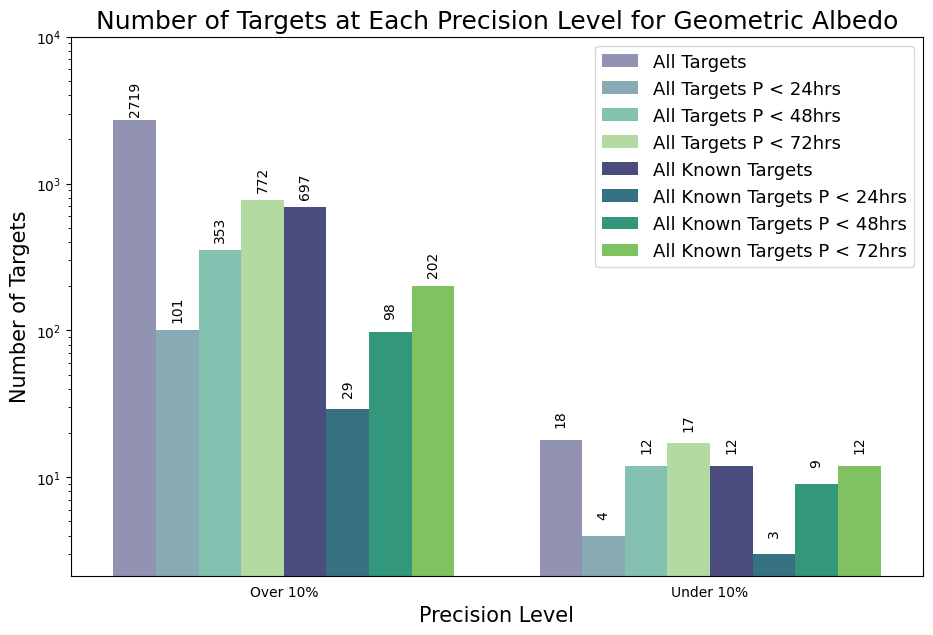

In [80]:
num_targets_melted = num_targets.reset_index().melt(id_vars='index', var_name='Category', value_name='Value')

def lighten_color(color, amount=0.5):
    try:
        c = colors.to_rgb(color)
    except ValueError:
        c = color
    return [(1 - amount) * component + amount for component in c]

base_palette = sns.color_palette("viridis", 4)
lightened_palette = [lighten_color(c, amount=0.4) for c in base_palette]

color_mapping = {
    "All Targets": lightened_palette[0],
    "All Targets P < 24hrs": lightened_palette[1],
    "All Targets P < 48hrs": lightened_palette[2],
    "All Targets P < 72hrs": lightened_palette[3],
    "All Known Targets": base_palette[0],
    "All Known Targets P < 24hrs": base_palette[1],
    "All Known Targets P < 48hrs": base_palette[2],
    "All Known Targets P < 72hrs": base_palette[3],
}

plt.figure(figsize=(11, 7))
ax = sns.barplot(x='index', y='Value', hue='Category', data=num_targets_melted, width=0.8, palette=color_mapping)

plt.yscale('log')

for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 15), 
                textcoords = 'offset points', 
                rotation=90)
    
plt.xlabel('Precision Level', fontsize=15)
plt.ylabel('Number of Targets', fontsize=15)

plt.ylim(None, 1e4)

plt.tick_params(bottom=False)

plt.title('Number of Targets at Each Precision Level for Geometric Albedo', fontsize=18)
plt.legend(fontsize=13)

plt.savefig("Results Plots/Number of targets at each precision level for geometric albedo.png", dpi=300, bbox_inches='tight')

plt.show()

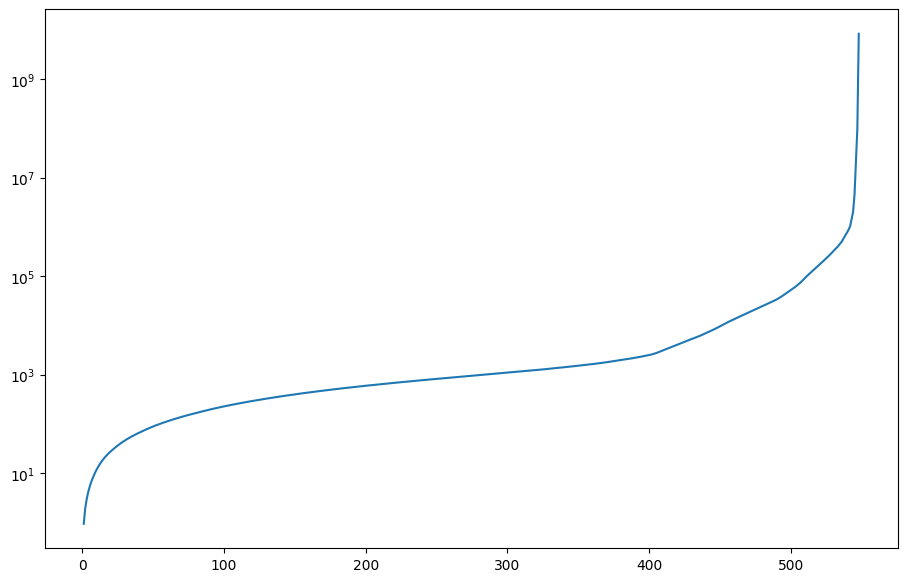

In [112]:
# cumulative time plot

fig, ax = plt.subplots(figsize=(11, 7))

# ax.set_xscale('log')
ax.set_yscale('log')

combined["PC Total Observing Time [days]"] = combined["Tier 1 Observations Full Phase Curve SNR"] * (combined["Planet Period [days]"]+ combined["Transit Duration [hrs]"]/24 * 3)
PCsorted = combined.sort_values(by="PC Total Observing Time [days]", ascending=True)
cumulative_time = np.cumsum(PCsorted['PC Total Observing Time [days]'])
cumulative_counts = np.arange(1, len(PCsorted) + 1)
ax.plot(cumulative_counts, cumulative_time)

combined["RSM Total Observing Time [days]"] = combined["Tier 1 Observations RSM"] * (combined["Planet Period [days]"]+ combined["Transit Duration [hrs]"]/24 * 3)
PCsorted = combined.sort_values(by="PC Total Observing Time [days]", ascending=True)
cumulative_time = np.cumsum(PCsorted['PC Total Observing Time [days]'])
cumulative_counts = np.arange(1, len(PCsorted) + 1)
ax.plot(cumulative_counts, cumulative_time)

In [333]:
# plotting test data to see where discrepancies are from

# params
wavelength_range = np.tile(np.array([(1.1, 7.8)]), (1000, 1))

Td1 = 500 * np.ones(1000)
Ts1 = 5800 * np.ones(1000)
Rs1 = 1 * np.ones(1000)
Rp1 = 1 * np.ones(1000)
Flux1 = 1e-6 * np.ones(1000)

Td2 = 1000 * np.ones(1000)
Ts2 = 4000 * np.ones(1000)
Rs2 = 0.8 * np.ones(1000)
Rp2 = 1.5 * np.ones(1000)
Flux2 = 1e-5 * np.ones(1000)

Td3 = 1500 * np.ones(1000)
Ts3 = 6500 * np.ones(1000)
Rs3 = 1.5 * np.ones(1000)
Rp3 = 0.5 * np.ones(1000)
Flux3 = 1e-7 * np.ones(1000)

ESM = np.logspace(-1, 3, 1000)

In [335]:
df = pd.DataFrame([Td1, Ts1, Rs1, Rp1, Flux1, 
                   Td2, Ts2, Rs2, Rp2, Flux2,
                   Td3, Ts3, Rs3, Rp3, Flux3,
                   ESM], 
                  
                  index=['Td1', 'Ts1', 'Rs1', 'Rp1', 'Flux1', 
                         'Td2', 'Ts2', 'Rs2', 'Rp2', 'Flux2',
                         'Td3', 'Ts3', 'Rs3', 'Rp3', 'Flux3',
                         'ESM']).T

w_range = (1.1, 7.8)
wrange = pd.Series([w_range]*df.shape[0])


In [336]:
df['Tday uncertainty 1'] = v_Tdayunc(wrange, df['Td1'], df['Ts1'], df['Rs1'], df['Rp1'], df['Flux1'])/df['ESM']
df['Tday uncertainty 2'] = v_Tdayunc(wrange, df['Td2'], df['Ts2'], df['Rs2'], df['Rp2'], df['Flux2'])/df['ESM']
df['Tday uncertainty 3'] = v_Tdayunc(wrange, df['Td3'], df['Ts3'], df['Rs3'], df['Rp3'], df['Flux3'])/df['ESM']

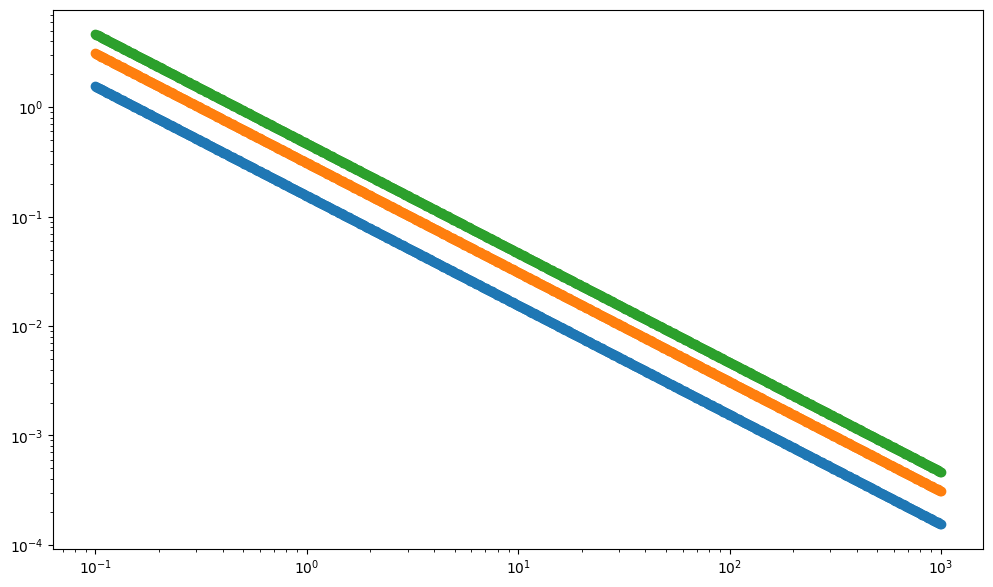

In [337]:
fig, ax = plt.subplots(figsize=(12, 7))
ax.set_yscale('log')
ax.set_xscale('log')
ax.scatter(df["ESM"], df["Tday uncertainty 1"])
ax.scatter(df["ESM"], df["Tday uncertainty 2"])
ax.scatter(df["ESM"], df["Tday uncertainty 3"])


In [ ]:
known = pd.read_csv("target_lists/Ariel_MCS_Known_2024-03-27.csv")
tpcs = pd.read_csv("target_lists/Ariel_MCS_TPCs_2024-03-27.csv")

In [ ]:
clean_tpcs = cleanTargetList(tpcs, separate_errors=False)

In [36]:
clean_tpcs = clean_tpcs.loc[:, ~clean_tpcs.columns.str.contains('^Unnamed')]

In [37]:
known = known.iloc[:, ~known.columns.str.contains('^Unnamed')]

In [50]:
print(known.index.duplicated().sum())   # Check for duplicate indices in 'known'
print(clean_tpcs.index.duplicated().sum())  # Check for duplicate indices in 'clean_tpcs'

0
0


In [51]:
known = known.reset_index(drop=True)
clean_tpcs = clean_tpcs.reset_index(drop=True)

In [52]:
clean_tpcs

,TIC,Star Name,Planet Geometric Albedo,Star Temperature [K],Star Temperature Error Lower [K],Star Temperature Error Upper [K],Star Radius [Rs],Star Radius Error Lower [Rs],Star Radius Error Upper [Rs],Star log(g),...,Tier 3 Eclipses,Preferred Method,Tier 1 Observations,Tier 2 Observations,Tier 3 Observations,FGS1_Flag,FGS2_Flag,FGS_Flag,Max Tier,Dayside Emitting Temperature [K]
0,65212867,TOI-1007,TOI-1007.01,6596.02,-139.2,139.2,2.702350,-0.130000,0.130000,3.71320,...,5.0,Eclipse,1.0,2.0,5.0,0,0,0,2,1882.590382
1,107782586,TOI-1009,TOI-1009.01,8868.70,-809.8,809.8,2.184184,NaN,NaN,NaN,...,134.0,Eclipse,8.0,67.0,134.0,0,0,0,1,3156.937286
2,341420329,TOI-1019,TOI-1019.01,7645.00,-134.4,134.4,1.562030,-0.048126,0.048126,4.30354,...,1.0,Eclipse,1.0,1.0,1.0,0,0,0,3,1749.339510
3,20318757,TOI-1027,TOI-1027.01,4272.00,-122.7,122.7,0.680275,-0.060000,0.060000,4.59877,...,599.0,Transit,4.0,41.0,82.0,0,0,0,1,887.741765
4,20318757,TOI-1027,TOI-1027.02,4272.00,-122.7,122.7,0.680275,-0.060000,0.060000,4.59877,...,5931.0,Transit,5.0,46.0,92.0,0,0,0,1,592.772548
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2035,174599051,TOI-970,TOI-970.01,5189.00,-121.3,121.3,1.065320,-0.060000,0.060000,4.32759,...,655.0,Transit,6.0,69.0,137.0,0,0,0,1,1121.861053
2036,73038411,TOI-978,TOI-978.01,6368.00,-126.8,126.8,1.521490,-0.070000,0.070000,4.17699,...,41.0,Eclipse,3.0,21.0,41.0,0,0,0,1,1119.722550
2037,320536216,TOI-986,TOI-986.01,8031.00,-181.1,181.1,1.645520,-0.060000,0.060000,4.29326,...,15.0,Eclipse,1.0,7.0,15.0,0,0,0,2,3949.472097
2038,88684250,TOI-990,TOI-990.01,8388.00,-125.1,125.1,1.855080,-0.070000,0.070000,4.21940,...,19.0,Eclipse,1.0,10.0,19.0,0,0,0,2,2131.605422


In [48]:
known

,Star Name,Star Mass [Ms],Star Mass Error Lower [Ms],Star Mass Error Upper [Ms],Star Temperature [K],Star Temperature Error Lower [K],Star Temperature Error Upper [K],Star Radius [Rs],Star Radius Error Lower [Rs],Star Radius Error Upper [Rs],...,Tier 3 Eclipses,Preferred Method,Tier 1 Observations,Tier 2 Observations,Tier 3 Observations,FGS1_Flag,FGS2_Flag,FGS_Flag,Max Tier,Dayside Emitting Temperature [K]
0,TOI-5704,0.73,-0.08,0.08,4590.0,-126.0,126.0,0.76,-0.06,0.06,...,540.0,Transit,4.0,44.0,88.0,0,0,0,1,964.505606
1,TOI-672,0.54,-0.02,0.02,3765.0,-65.0,65.0,0.54,-0.02,0.02,...,233.0,Transit,1.0,11.0,21.0,0,0,0,2,687.146421
2,TOI-199,0.94,-0.01,0.00,5255.0,-10.0,12.0,0.82,0.00,0.00,...,56322.0,Transit,1.0,5.0,9.0,0,0,0,2,357.537322
3,WASP-176,1.34,-0.13,0.08,5941.0,-79.0,77.0,1.93,-0.04,0.05,...,9.0,Eclipse,1.0,5.0,9.0,0,0,0,2,1748.645580
4,TOI-1801,0.56,-0.04,0.04,3863.0,-77.0,77.0,0.55,-0.02,0.03,...,25592.0,Transit,5.0,34.0,67.0,0,0,0,1,501.567301
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
692,TOI-1693,0.49,-0.03,0.03,3499.0,-70.0,70.0,0.46,-0.01,0.01,...,3287.0,Transit,9.0,99.0,196.0,0,0,0,1,773.586919
693,NGTS-8,0.89,-0.04,0.05,5241.0,-50.0,50.0,0.98,-0.02,0.02,...,30.0,Eclipse,3.0,15.0,30.0,1,0,1,2,1359.044427
694,K2-405,1.03,-0.31,0.46,4927.0,-138.0,138.0,0.77,-0.05,0.05,...,125.0,Transit,3.0,32.0,64.0,0,0,0,1,1407.255306
695,TOI-532,0.64,-0.02,0.02,3927.0,-37.0,37.0,0.61,-0.01,0.01,...,223.0,Transit,7.0,98.0,199.0,1,0,1,1,873.615724


In [55]:
clean_tpcs.rename(columns={"Transit Duration [hr]": "Transit Duration [hrs]"}, inplace=True)

In [60]:
combined = pd.concat([known, clean_tpcs], axis=1 ,ignore_index=False)

In [61]:
combined

,Star Name,Star Mass [Ms],Star Mass Error Lower [Ms],Star Mass Error Upper [Ms],Star Temperature [K],Star Temperature Error Lower [K],Star Temperature Error Upper [K],Star Radius [Rs],Star Radius Error Lower [Rs],Star Radius Error Upper [Rs],...,Tier 3 Eclipses,Preferred Method,Tier 1 Observations,Tier 2 Observations,Tier 3 Observations,FGS1_Flag,FGS2_Flag,FGS_Flag,Max Tier,Dayside Emitting Temperature [K]
0,TOI-5704,0.73,-0.08,0.08,4590.0,-126.0,126.0,0.76,-0.06,0.06,...,5.0,Eclipse,1.0,2.0,5.0,0,0,0,2,1882.590382
1,TOI-672,0.54,-0.02,0.02,3765.0,-65.0,65.0,0.54,-0.02,0.02,...,134.0,Eclipse,8.0,67.0,134.0,0,0,0,1,3156.937286
2,TOI-199,0.94,-0.01,0.00,5255.0,-10.0,12.0,0.82,0.00,0.00,...,1.0,Eclipse,1.0,1.0,1.0,0,0,0,3,1749.339510
3,WASP-176,1.34,-0.13,0.08,5941.0,-79.0,77.0,1.93,-0.04,0.05,...,599.0,Transit,4.0,41.0,82.0,0,0,0,1,887.741765
4,TOI-1801,0.56,-0.04,0.04,3863.0,-77.0,77.0,0.55,-0.02,0.03,...,5931.0,Transit,5.0,46.0,92.0,0,0,0,1,592.772548
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2035,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,655.0,Transit,6.0,69.0,137.0,0,0,0,1,1121.861053
2036,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,41.0,Eclipse,3.0,21.0,41.0,0,0,0,1,1119.722550
2037,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,15.0,Eclipse,1.0,7.0,15.0,0,0,0,2,3949.472097
2038,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,19.0,Eclipse,1.0,10.0,19.0,0,0,0,2,2131.605422


In [14]:
combined.to_csv("target_lists/Ariel_MCS_Combined_2024-03-27.csv", index=True)

In [20]:
list(known.columns)

['Unnamed: 0.4',
 'Unnamed: 0.3',
 'Unnamed: 0.2',
 'Unnamed: 0.1',
 'Unnamed: 0',
 'Star Name',
 'Star Mass [Ms]',
 'Star Mass Error Lower [Ms]',
 'Star Mass Error Upper [Ms]',
 'Star Temperature [K]',
 'Star Temperature Error Lower [K]',
 'Star Temperature Error Upper [K]',
 'Star Radius [Rs]',
 'Star Radius Error Lower [Rs]',
 'Star Radius Error Upper [Rs]',
 'Star log(g)',
 'Star log(g) Error Lower',
 'Star log(g) Error Upper',
 'Star Metallicity',
 'Star Metallicity Error Lower',
 'Star Metallicity Error Upper',
 'Metallicity Ratio',
 'Star Age [Gyr]',
 'Star Age Error Lower [Gyr]',
 'Star Age Error Upper [Gyr]',
 'Star Spectral Type',
 'Star Rotational Velocity [km/s]',
 'Star Rotational Velocity Error Lower [km/s]',
 'Star Rotational Velocity Error Upper [km/s]',
 'Star Rotation Period [days]',
 'Star Rotation Period Error Lower [days]',
 'Star Rotation Period Error Upper [days]',
 'Star Distance [pc]',
 'Star Distance Error Lower [pc]',
 'Star Distance Error Upper [pc]',
 'Star

In [19]:
list(combined.columns)

['Unnamed: 0.4',
 'Unnamed: 0.3',
 'Unnamed: 0.2',
 'Unnamed: 0.1',
 'Unnamed: 0',
 'Star Name',
 'Star Mass [Ms]',
 'Star Mass Error Lower [Ms]',
 'Star Mass Error Upper [Ms]',
 'Star Temperature [K]',
 'Star Temperature Error Lower [K]',
 'Star Temperature Error Upper [K]',
 'Star Radius [Rs]',
 'Star Radius Error Lower [Rs]',
 'Star Radius Error Upper [Rs]',
 'Star log(g)',
 'Star log(g) Error Lower',
 'Star log(g) Error Upper',
 'Star Metallicity',
 'Star Metallicity Error Lower',
 'Star Metallicity Error Upper',
 'Metallicity Ratio',
 'Star Age [Gyr]',
 'Star Age Error Lower [Gyr]',
 'Star Age Error Upper [Gyr]',
 'Star Spectral Type',
 'Star Rotational Velocity [km/s]',
 'Star Rotational Velocity Error Lower [km/s]',
 'Star Rotational Velocity Error Upper [km/s]',
 'Star Rotation Period [days]',
 'Star Rotation Period Error Lower [days]',
 'Star Rotation Period Error Upper [days]',
 'Star Distance [pc]',
 'Star Distance Error Lower [pc]',
 'Star Distance Error Upper [pc]',
 'Star

In [15]:
Ariel.constructArielInstruments("Ariel_MCS_Combined_2024-03-27")

ValueError: operands could not be broadcast together with shapes (2737,) (2737,) () (2737,2) (2737,) () (2737,) 

In [6]:
Ariel.setTargetList('Ariel_MCS_Known_2024-03-27')
Ariel.getTargetList()[0]

'Ariel_MCS_Known_2024-03-27'

In [7]:
Ariel.openArielInstruments('Ariel_MCS_Known_2024-03-27')

Ariel
  |--> Ariel_MCS_Known_2024-03-27
             |--> Ariel AIRS CH0 1.95-3.9um D=1 R=100 tau=0.18
             |--> Ariel AIRS CH0 1.95-3.9um D=1 R=3 tau=0.18
             |--> Ariel AIRS CH0 1.95-3.9um D=1 R=30 tau=0.18
             |--> Ariel AIRS CH0 1.95-3.9um D=1 R=50 tau=0.18
             |--> Ariel AIRS CH1 3.9-7.8um D=1 R=1 tau=0.18
             |--> Ariel AIRS CH1 3.9-7.8um D=1 R=10 tau=0.18
             |--> Ariel AIRS CH1 3.9-7.8um D=1 R=100 tau=0.18
             |--> Ariel AIRS CH1 3.9-7.8um D=1 R=3 tau=0.18
             |--> Ariel AIRS CH1 3.9-7.8um D=1 R=30 tau=0.18
             |--> Ariel FGS1 0.6-0.8um D=1 R=1 tau=0.17
             |--> Ariel FGS2 0.8-1.1um D=1 R=1 tau=0.25
             |--> Ariel NIRSpec 1.1-1.95um D=1 R=1 tau=0.27
             |--> Ariel NIRSpec 1.1-1.95um D=1 R=10 tau=0.27
             |--> Ariel NIRSpec 1.1-1.95um D=1 R=100 tau=0.27
             |--> Ariel NIRSpec 1.1-1.95um D=1 R=15 tau=0.27
             |--> Ariel NIRSpec 1.1-1.95um D=1 R=20 

In [4]:
Ariel.constructObservationTable('Ariel_MCS_Known_2024-03-27')

     Planet Name  Full Phase Curve Dayside Temperature Uncertainty 1.1-1.95um
0              0                                       4.633601e+00          
1              0                                       3.340366e-01          
2              0                                       1.981701e-08          
3              0                                       8.646737e+03          
4              0                                       3.412688e-05          
..           ...                                                ...          
692            0                                       7.921518e-02          
693            0                                       1.130355e+03          
694            0                                       3.786513e+02          
695            0                                       5.578857e+00          
696            0                                       7.934367e-04          

[697 rows x 2 columns]
     Planet Name  Full Phase Curve Daysi

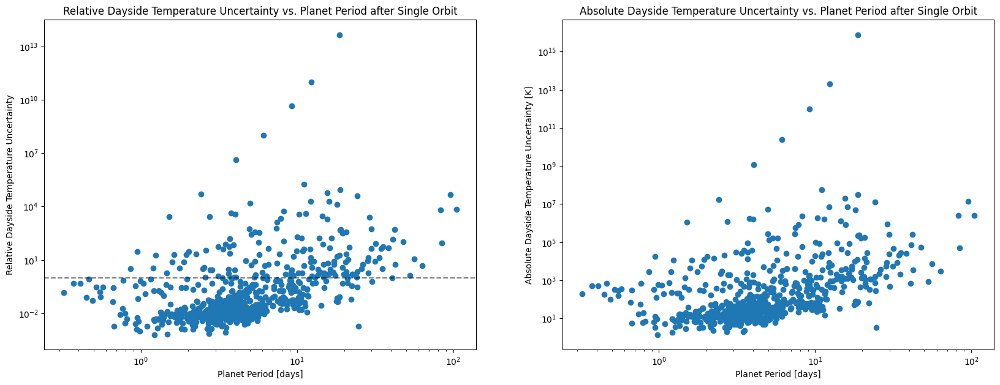

In [179]:
df = Ariel.getObservationTable()

fig, (ax, ax1) = plt.subplots(1,2, figsize=(20,7))

ax.axhline(y=1, color='black', linestyle='--', alpha=0.5)
ax.scatter(df['Planet Period [days]'], df['Relative Dayside Temperature Uncertainty Average'])
ax.set_xlabel('Planet Period [days]')
ax.set_ylabel('Relative Dayside Temperature Uncertainty')
ax.set_title('Relative Dayside Temperature Uncertainty vs. Planet Period after Single Orbit')
ax.set_yscale('log')
ax.set_xscale('log')

ax1.scatter(df['Planet Period [days]'], df['Relative Dayside Temperature Uncertainty Average'] * df["Dayside Emitting Temperature [K]"])
ax1.set_xlabel('Planet Period [days]')
ax1.set_ylabel('Absolute Dayside Temperature Uncertainty [K]')
ax1.set_title('Absolute Dayside Temperature Uncertainty vs. Planet Period after Single Orbit')
ax1.set_yscale('log')
ax1.set_xscale('log')

plt.savefig("Results Plots/Tday uncertainty vs Period for all planets.png", dpi=300, bbox_inches='tight')

plt.show()

In [91]:
df_filtered = df[df['Relative Dayside Temperature Uncertainty Average'] < 1e4]

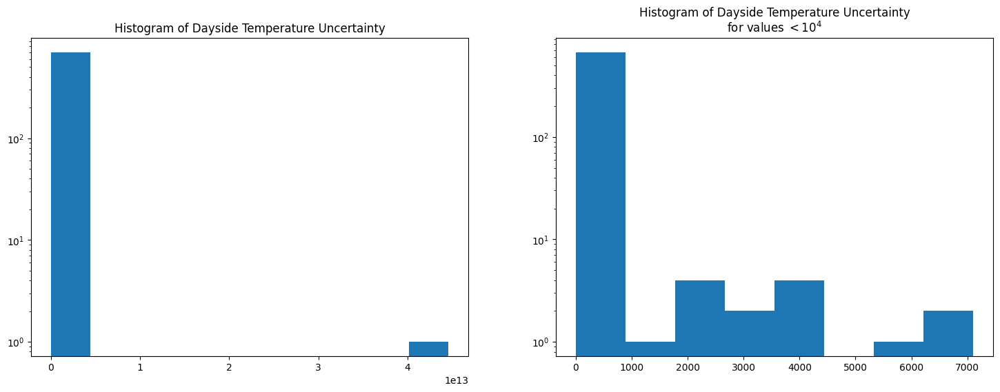

In [174]:
fig, ax = plt.subplots(1, 2, figsize=(18,6))

ax[0].hist(df['Relative Dayside Temperature Uncertainty Average'], bins=10)
ax[0].set_yscale('log')
ax[0].set_title('Histogram of Dayside Temperature Uncertainty')

ax[1].hist(df_filtered['Relative Dayside Temperature Uncertainty Average'], bins=8)
ax[1].set_yscale('log')
ax[1].set_title('Histogram of Dayside Temperature Uncertainty\n' + r'for values $< 10^4$')

plt.savefig("Results Plots/Histograms of Tday uncertainty.png", dpi=300, bbox_inches='tight')

plt.show()

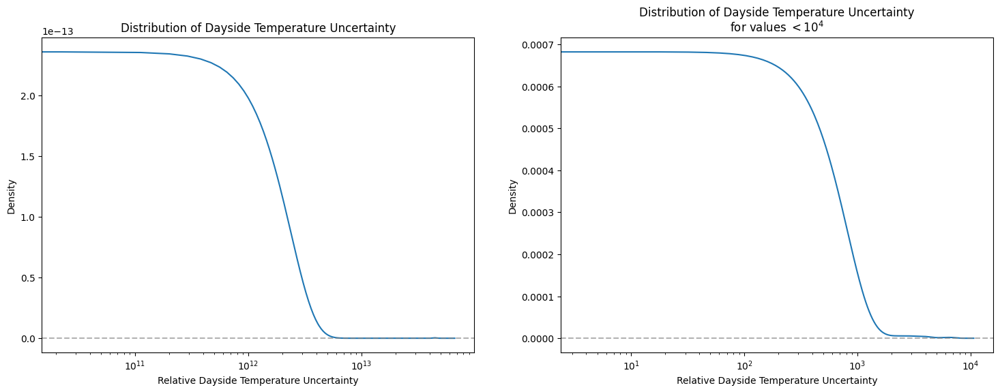

In [175]:
fig, ax = plt.subplots(1, 2, figsize=(18,6))

df['Relative Dayside Temperature Uncertainty Average'].plot(kind='kde', bw_method=1, ax=ax[0])
# ax.set_xlim(000)
# ax.set_yscale('log')
ax[0].set_xscale('log')
ax[0].axhline(0, c='grey', alpha=0.6, linestyle='--')
ax[0].set_xlabel('Relative Dayside Temperature Uncertainty')
ax[0].set_title('Distribution of Dayside Temperature Uncertainty')

df_filtered['Relative Dayside Temperature Uncertainty Average'].plot(kind='kde', bw_method=1, ax=ax[1])
# ax.set_xlim(000)
# ax.set_yscale('log')
ax[1].set_xscale('log')
ax[1].axhline(0, c='grey', alpha=0.6, linestyle='--')
ax[1].set_xlabel('Relative Dayside Temperature Uncertainty')
ax[1].set_title('Distribution of Dayside Temperature Uncertainty\n' + r'for values $< 10^4$')

plt.savefig("Results Plots/Distributions of Tday uncertainty.png", dpi=300, bbox_inches='tight')

plt.show()

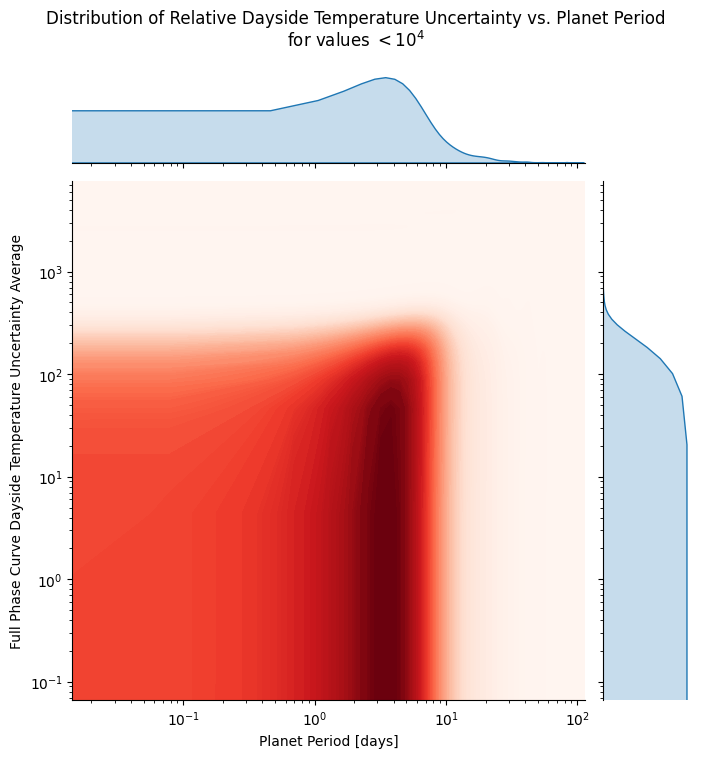

In [181]:
# plt.figure(figsize=(10,6))
sns.jointplot(data=df_filtered, x='Planet Period [days]', y='Relative Dayside Temperature Uncertainty Average', kind='kde', fill=True, cmap="Reds", thresh=0, levels=100, height=7)
plt.xscale('log')
plt.yscale('log')
# plt.xlim(-10, 1e4)


plt.savefig("Results Plots/Distribution for Relative Dayside Temperature Uncertainty vs. Planet Period (under 10000) NO TITLE.png", dpi=300, bbox_inches='tight')
plt.suptitle('Distribution of Relative Dayside Temperature Uncertainty vs. Planet Period\n' + r'for values $< 10^4$', y=1.07)

plt.savefig("Results Plots/Distribution for Relative Dayside Temperature Uncertainty vs. Planet Period (under 10000).png", dpi=300, bbox_inches='tight')

plt.show()

In [183]:
instst1 = ["NIRSpec R=1", "AIRS CH0 R=3", "AIRS CH1 R=1"]
instst2 = ["NIRSpec R=10", "AIRS CH0 R=50", "AIRS CH1 R=10"]
instst3 = ["NIRSpec R=20", "AIRS CH0 R=100", "AIRS CH1 R=30"]

In [184]:
getTargetList()[1]["Planet Name"]

0      TOI-5704b
1       TOI-672b
2       TOI-199b
3      WASP-176b
4      TOI-1801b
         ...    
692    TOI-1693b
693      NGTS-8b
694      K2-405b
695     TOI-532b
696      GJ3929b
Name: Planet Name, Length: 697, dtype: object

In [185]:
tel = Ariel.getInstrument("NIRSPec R=10")

In [189]:
tier1 = []
tier2 = []
tier3 = []
for i in range(0,3):
    tier1.append(Ariel.getInstrument(instst1[i]))
    tier2.append(Ariel.getInstrument(instst2[i]))
    tier3.append(Ariel.getInstrument(instst3[i]))

In [190]:
avgst1 = {}
avgst2 = {}
avgst3 = {}


for i in range(0,3):
    
    tempst1 = tier1[i].getParam("Full Phase Curve Dayside Temperature Uncertainty")
    tempst2 = tier2[i].getParam("Full Phase Curve Dayside Temperature Uncertainty")
    tempst3 = tier3[i].getParam("Full Phase Curve Dayside Temperature Uncertainty")
    
    weights = 0
    for col in tempst1.columns:
        if col != "Planet Name":
            weights += 1/tempst1[col][i]**2
            print(1/tempst1[col][i]**2)
    avgst1[tempst1["Planet Name"][i]] = 1/np.sqrt(weights)
    
    weights = 0
    for col in tempst2.columns:
        if col != "Planet Name":
            weights += 1/tempst2[col][i]**2
    avgst2[tempst2["Planet Name"][i]] = 1/np.sqrt(weights)
    
    weights = 0
    for col in tempst3.columns:
        if col != "Planet Name":
            weights += 1/tempst3[col][i]**2
    avgst3[tempst3["Planet Name"][i]] = 1/np.sqrt(weights)

avgst1, avgst2, avgst3

4.633601177437037
[11.35358094 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094
 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094
 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094
 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094
 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094
 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094
 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094
 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094
 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094
 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094
 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094
 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094
 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094 11.35358094
 11.35358094 11.35358094 11.35358

({'TOI-5704b': 0.4645587823803205,
  'TOI-672b': array([0.05687704, 0.05687704, 0.05687704, 0.05687704, 0.05687704,
         0.05687704, 0.05687704, 0.05687704, 0.05687704, 0.05687704,
         0.05687704, 0.05687704, 0.05687704, 0.05687704, 0.05687704,
         0.05687704, 0.05687704, 0.05687704, 0.05687704, 0.05687704,
         0.05687704, 0.05687704, 0.05687704, 0.05687704, 0.05687704,
         0.05687704, 0.05687704, 0.05687704, 0.05687704, 0.05687704,
         0.05687704, 0.05687704, 0.05687704, 0.05687704, 0.05687704,
         0.05687704, 0.05687704, 0.05687704, 0.05687704, 0.05687704,
         0.05687704, 0.05687704, 0.05687704, 0.05687704, 0.05687704,
         0.05687704, 0.05687704, 0.05687704, 0.05687704, 0.05687704,
         0.05687704, 0.05687704, 0.05687704, 0.05687704, 0.05687704,
         0.05687704, 0.05687704, 0.05687704, 0.05687704, 0.05687704,
         0.05687704, 0.05687704, 0.05687704, 0.05687704, 0.05687704,
         0.05687704, 0.05687704, 0.05687704, 0.05687704,

In [17]:
Ariel.getObservationTable().head(1)["Dayside Emitting Temperature [K]"][0]

687.1464206404843

In [18]:
Ariel.getObservationTable().head(1)["Relative Dayside Temperature Uncertainty Average"][0]

0.015023290464652153

In [22]:
tier1[i].getParam("Full Phase Curve Dayside Temperature Uncertainty")

,Planet Name,Full Phase Curve Dayside Temperature Uncertainty 3.9-7.8um
0,TOI-672b,0.015611
1,TOI-199b,0.032897
2,WASP-176b,0.013543


In [20]:
avgst1_abs = {}
avgst2_abs = {}
avgst3_abs = {}


for i in range(0,3):
    
    tempst1_abs = tier1[i].getParam("Full Phase Curve Dayside Temperature Uncertainty")
    tempst2_abs = tier2[i].getParam("Full Phase Curve Dayside Temperature Uncertainty")
    tempst3_abs = tier3[i].getParam("Full Phase Curve Dayside Temperature Uncertainty")
    
    weights = 0
    for col in tempst1_abs.columns:
        if col != "Planet Name":
            weights += 1/(tempst1_abs[col][i] * tier1[i].table["Dayside Emitting Temperature [K]"][i])**2
    avgst1_abs[tempst1_abs["Planet Name"][i]] = 1/np.sqrt(weights)
    
    weights = 0
    for col in tempst2_abs.columns:
        if col != "Planet Name":
            weights += 1/(tempst2_abs[col][i] * tier2[i].table["Dayside Emitting Temperature [K]"][i])**2
    avgst2_abs[tempst2_abs["Planet Name"][i]] = 1/np.sqrt(weights)
    
    weights = 0
    for col in tempst3_abs.columns:
        if col != "Planet Name":
            weights += 1/(tempst3_abs[col][i] * tier3[i].table["Dayside Emitting Temperature [K]"][i])**2
    avgst3_abs[tempst3_abs["Planet Name"][i]] = 1/np.sqrt(weights)

avgst1_abs, avgst2_abs, avgst3_abs

({'TOI-672b': 1155.7210840143875,
  'TOI-199b': 493.64601822395304,
  'WASP-176b': 23.681978274417713},
 {'TOI-672b': 1028.349334179972,
  'TOI-199b': 486.3928730104541,
  'WASP-176b': 22.552740748404066},
 {'TOI-672b': 1026.6859715431146,
  'TOI-199b': 486.3700375184654,
  'WASP-176b': 22.545102701977648})

In [21]:
temps = {}

for planet in avgst1.keys():
    temps[planet] = getPlanet(tier1[0].table, planet)["Dayside Emitting Temperature [K]"].reset_index(drop=True)[0]
    
temps

{'TOI-672b': 687.1464206404843,
 'TOI-199b': 357.5373216683036,
 'WASP-176b': 1748.645580494196}

In [28]:
Ariel.getInstrument("Ariel NIRSPec R=20","Mini List for Tests")

NameError: name 'instst1' is not defined

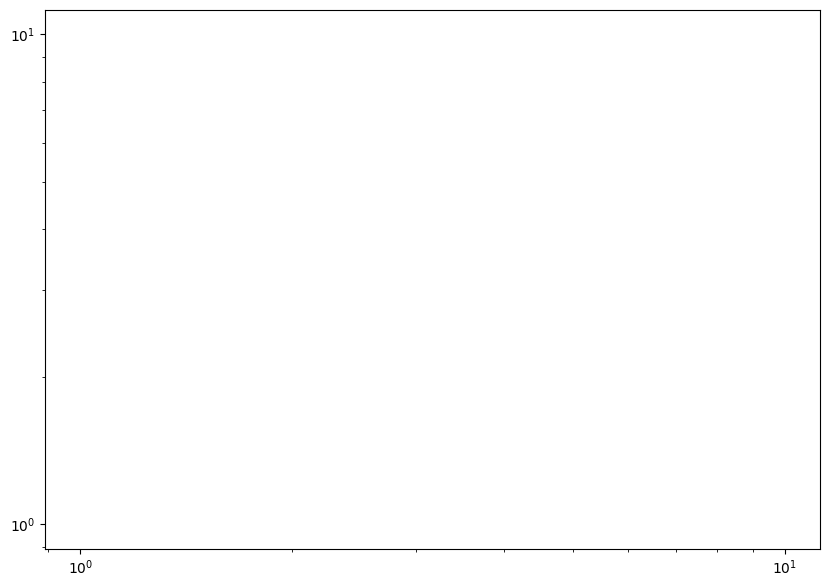

In [182]:
fig, ax = plt.subplots(figsize=(10,7))

ax.set_xscale('log')
ax.set_yscale('log')

Ariel.plotParamProfile('TOI-672b', instst1, "Full Phase Curve Dayside Temperature Uncertainty", ppm=False, ax=ax, marker='.', linestyle='', c='b', zorder=6, label="Tier 1 SR")
Ariel.plotParamProfile('TOI-672b', instst2, "Full Phase Curve Dayside Temperature Uncertainty", ppm=False, ax=ax, marker='.', linestyle='', c='r', zorder=6, label="Tier 2 SR")
Ariel.plotParamProfile('TOI-672b', instst3, "Full Phase Curve Dayside Temperature Uncertainty", ppm=False, ax=ax, marker='.', linestyle='', c='g', zorder=6, label="Tier 3 SR")


Ariel.plotSensitivityRange(instst1, ax=ax)


x = np.linspace(1.1, 7.8, 100)
vals = []
for wavelength in x:
    vals.append(planckFunc(wavelength, getPlanet(Ariel.getInstrument("NIRSpec R=1").table, "TOI-672b")["Dayside Emitting Temperature [K]"]))
ax2 = ax.twinx()
ax2.plot(x, vals, c='k', linestyle='--', zorder=1, label="Planck Function")

ax.set_xlabel('Wavelength [µm]')
ax.set_ylabel('Relative Uncertainty on Dayside Temperature')
ax2.set_ylabel('Planck Function Value')

ax.axhline(y=avgst1["TOI-672b"], c='b', linestyle=':', zorder=1)
ax.axhline(y=avgst2["TOI-672b"], c='r', linestyle=':', zorder=1)
ax.axhline(y=avgst3["TOI-672b"], c='g', linestyle=':', zorder=1)

ax.text(3.3, avgst1["TOI-672b"]*1.12, f'Estimated Uncertainty (from EWM)')


handles_ax, labels_ax = ax.get_legend_handles_labels()
handles_ax2, labels_ax2 = ax2.get_legend_handles_labels()

handles = handles_ax + handles_ax2
labels = labels_ax + labels_ax2

ax.legend(handles, labels, loc='upper right')

ax.set_title('TOI-672b - Relative Dayside Temperature Uncertainty\nfrom Single Phase Curve')

plt.savefig("TOI-672b - Relative Dayside Temperature Uncertainty from Single Secondary Phase Curve.png")

plt.show()

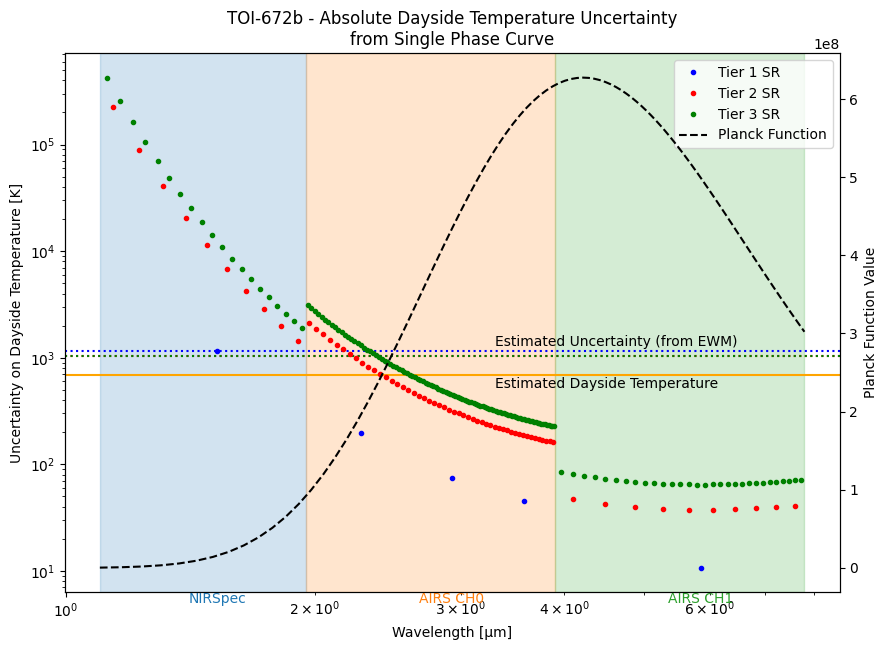

In [30]:
fig, ax = plt.subplots(figsize=(10,7))

ax.set_xscale('log')
ax.set_yscale('log')

temperature = temps["TOI-672b"]

# getting the absolute temperature uncertainties
Ariel.plotParamProfile('TOI-672b', instst1, "Full Phase Curve Dayside Temperature Uncertainty", ppm=False, factor=temperature, ax=ax, marker='.', linestyle='', c='b', zorder=6, label="Tier 1 SR")
Ariel.plotParamProfile('TOI-672b', instst2, "Full Phase Curve Dayside Temperature Uncertainty", ppm=False, factor=temperature, ax=ax, marker='.', linestyle='', c='r', zorder=6, label="Tier 2 SR")
Ariel.plotParamProfile('TOI-672b', instst3, "Full Phase Curve Dayside Temperature Uncertainty", ppm=False, factor=temperature, ax=ax, marker='.', linestyle='', c='g', zorder=6, label="Tier 3 SR")


Ariel.plotSensitivityRange(instst1, ax=ax)

ax.axhline(y=temperature, c='orange', linestyle='-', zorder=1)
ax.text(3.3, temperature*0.75, f'Estimated Dayside Temperature')


x = np.linspace(1.1, 7.8, 100)
vals = []
for wavelength in x:
    vals.append(planckFunc(wavelength, getPlanet(Ariel.getInstrument("NIRSpec R=1").table, "TOI-672b")["Dayside Emitting Temperature [K]"]))
ax2 = ax.twinx()
ax2.plot(x, vals, c='k', linestyle='--', zorder=1, label="Planck Function")

ax.set_xlabel('Wavelength [µm]')
ax.set_ylabel('Uncertainty on Dayside Temperature [K]')
ax2.set_ylabel('Planck Function Value')

ax.axhline(y=avgst1["TOI-672b"]*temperature, c='b', linestyle=':', zorder=1)
ax.axhline(y=avgst2["TOI-672b"]*temperature, c='r', linestyle=':', zorder=1)
ax.axhline(y=avgst3["TOI-672b"]*temperature, c='g', linestyle=':', zorder=1)

ax.text(3.3, avgst1["TOI-672b"]*temperature*1.12, f'Estimated Uncertainty (from EWM)')


handles_ax, labels_ax = ax.get_legend_handles_labels()
handles_ax2, labels_ax2 = ax2.get_legend_handles_labels()

handles = handles_ax + handles_ax2
labels = labels_ax + labels_ax2

ax.legend(handles, labels, loc='upper right')

ax.set_title('TOI-672b - Absolute Dayside Temperature Uncertainty\nfrom Single Phase Curve')

plt.savefig("TOI-672b - Absolute Dayside Temperature Uncertainty from Single Secondary Phase Curve.png")

plt.show()

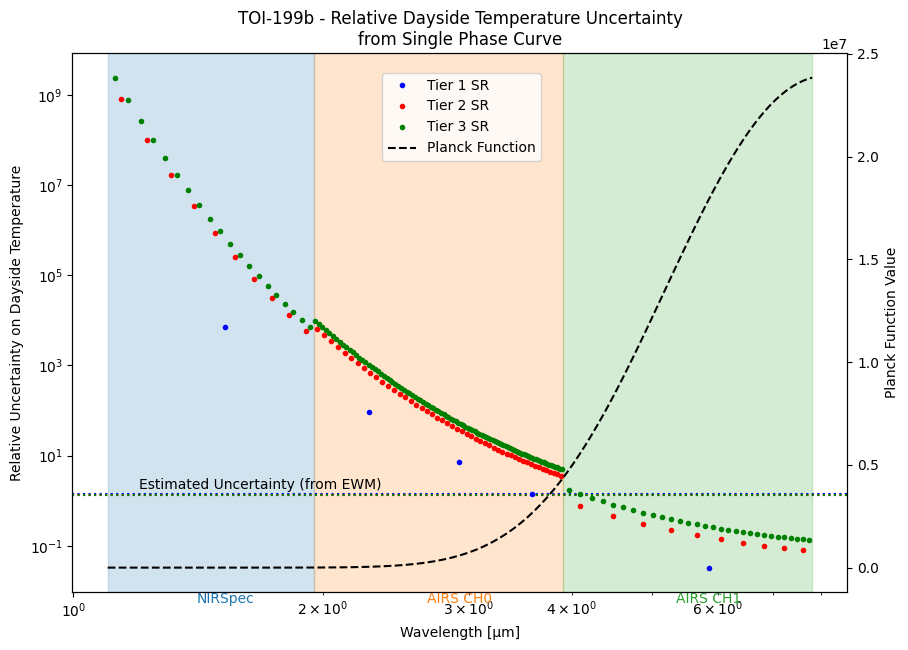

In [31]:
fig, ax = plt.subplots(figsize=(10,7))

ax.set_xscale('log')
ax.set_yscale('log')

Ariel.plotParamProfile('TOI-199b', instst1, "Full Phase Curve Dayside Temperature Uncertainty", ppm=False, ax=ax, marker='.', linestyle='', c='b', zorder=6, label="Tier 1 SR")
Ariel.plotParamProfile('TOI-199b', instst2, "Full Phase Curve Dayside Temperature Uncertainty", ppm=False, ax=ax, marker='.', linestyle='', c='r', zorder=6, label="Tier 2 SR")
Ariel.plotParamProfile('TOI-199b', instst3, "Full Phase Curve Dayside Temperature Uncertainty", ppm=False, ax=ax, marker='.', linestyle='', c='g', zorder=6, label="Tier 3 SR")


Ariel.plotSensitivityRange(instst1, ax=ax)


x = np.linspace(1.1, 7.8, 100)
vals = []
for wavelength in x:
    vals.append(planckFunc(wavelength, getPlanet(Ariel.getInstrument("NIRSpec R=1").table, "TOI-199b")["Dayside Emitting Temperature [K]"]))
ax2 = ax.twinx()
ax2.plot(x, vals, c='k', linestyle='--', zorder=1, label="Planck Function")

ax.set_xlabel('Wavelength [µm]')
ax.set_ylabel('Relative Uncertainty on Dayside Temperature')
ax2.set_ylabel('Planck Function Value')

ax.axhline(y=avgst1["TOI-199b"], c='b', linestyle=':', zorder=1)
ax.axhline(y=avgst2["TOI-199b"], c='r', linestyle=':', zorder=1)
ax.axhline(y=avgst3["TOI-199b"], c='g', linestyle=':', zorder=1)

ax.text(1.2, avgst1["TOI-199b"]*1.3, f'Estimated Uncertainty (from EWM)')

handles_ax, labels_ax = ax.get_legend_handles_labels()
handles_ax2, labels_ax2 = ax2.get_legend_handles_labels()

handles = handles_ax + handles_ax2
labels = labels_ax + labels_ax2

ax.legend(handles, labels, loc=(0.4,0.8))

ax.set_title('TOI-199b - Relative Dayside Temperature Uncertainty\nfrom Single Phase Curve')

plt.savefig("TOI-199b - Relative Dayside Temperature Uncertainty from Single Secondary Phase Curve.png")

plt.show()

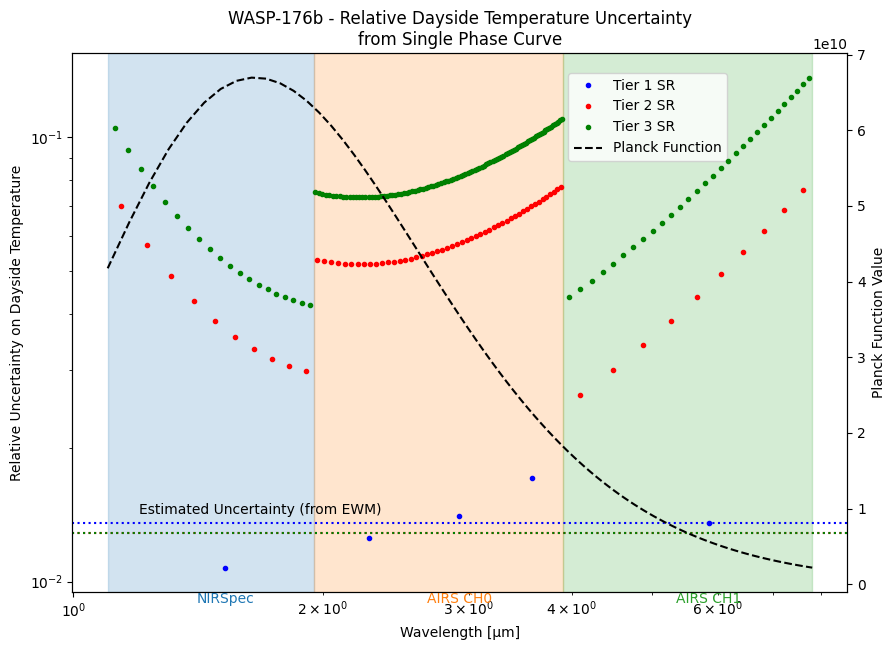

In [49]:
fig, ax = plt.subplots(figsize=(10,7))

ax.set_xscale('log')
ax.set_yscale('log')

Ariel.plotParamProfile('WASP-176b', instst1, "Full Phase Curve Dayside Temperature Uncertainty", ppm=False, ax=ax, marker='.', linestyle='', c='b', zorder=6, label="Tier 1 SR")
Ariel.plotParamProfile('WASP-176b', instst2, "Full Phase Curve Dayside Temperature Uncertainty", ppm=False, ax=ax, marker='.', linestyle='', c='r', zorder=6, label="Tier 2 SR")
Ariel.plotParamProfile('WASP-176b', instst3, "Full Phase Curve Dayside Temperature Uncertainty", ppm=False, ax=ax, marker='.', linestyle='', c='g', zorder=6, label="Tier 3 SR")


Ariel.plotSensitivityRange(instst1, ax=ax)


x = np.linspace(1.1, 7.8, 100)
vals = []
for wavelength in x:
    vals.append(planckFunc(wavelength, getPlanet(Ariel.getInstrument("NIRSpec R=1").table, "WASP-176b")["Dayside Emitting Temperature [K]"]))
ax2 = ax.twinx()
ax2.plot(x, vals, c='k', linestyle='--', zorder=1, label="Planck Function")

ax.set_xlabel('Wavelength [µm]')
ax.set_ylabel('Relative Uncertainty on Dayside Temperature')
ax2.set_ylabel('Planck Function Value')

ax.axhline(y=avgst1["WASP-176b"], c='b', linestyle=':', zorder=1)
ax.axhline(y=avgst2["WASP-176b"], c='r', linestyle=':', zorder=1)
ax.axhline(y=avgst3["WASP-176b"], c='g', linestyle=':', zorder=1)

ax.text(1.2, avgst1["WASP-176b"]*1.05, f'Estimated Uncertainty (from EWM)')

handles_ax, labels_ax = ax.get_legend_handles_labels()
handles_ax2, labels_ax2 = ax2.get_legend_handles_labels()

handles = handles_ax + handles_ax2
labels = labels_ax + labels_ax2

ax.legend(handles, labels, loc=(0.64, 0.8))

ax.set_title('WASP-176b - Relative Dayside Temperature Uncertainty\nfrom Single Phase Curve')

plt.savefig("WASP-176b - Relative Dayside Temperature Uncertainty from Single Secondary Phase Curve.png")

plt.show()

In [ ]:
nirspec = getTelescope("Ariel Nirspec R=10", target_list_name="Mini List for Tests")
# nirspec.table.filter(like='um')

# nirspec.wavelength_range
# nirspec.resolution = 10
# ws = np.array(nirspec.constructRanges())
nirspec.plotParam('TOI-672b', "Eclipse Dayside Temperature Uncertainty", ppm=False)
nirspec.table.filter(like='Temperature')

In [ ]:
Ariel.plotParamProfile('TOI-672b', 'tier 1', "Eclipse Dayside Temperature Uncertainty", ppm=False)

In [83]:
# minidf = getTargetList()[1].iloc[1:4]
# minidf


In [ ]:
Ariel.constructArielInstruments("Ariel_MCS_Known_2024-03-27")

In [5]:
Ariel.constructObservationTable("Ariel_MCS_Known_2024-03-27")

In [ ]:
obsdf = Ariel.getObservationTable("Ariel_MCS_Known_2024-03-27")
obsdf.plot(x="Planet Period [days]", y="Average Eclipse Dayside Temperature Uncertainty", kind="scatter")

In [ ]:
Ariel.constructArielInstruments("Ariel_MCS_TPCs_2024-03-27")

In [9]:
Ariel.constructObservationTable("Ariel_MCS_TPCs_2024-03-27")


In [ ]:
obs_tpcsdf = Ariel.getObservationTable("Ariel_MCS_TPCs_2024-03-27")
obs_tpcsdf.plot(x="Planet Period [days]", y="Average Eclipse Dayside Temperature Uncertainty", kind="scatter")

In [ ]:
scheduled_targets = pd.read_csv("/Users/ben_coull-neveu/Dropbox/- School -/Ariel Summer Internship 2024/EXOECHO_PACKAGE/ExoEcho/TargetLists_toSchedule/TargetList.csv")
scheduled_targets_planets = scheduled_targets["Planet Name"]
scheduled_targets_planets

In [ ]:
combined_df = pd.concat([obsdf, obs_tpcsdf], axis=0)
combined_df["Average Eclipse Dayside Temperature Uncertainty [%]"] = combined_df["Average Eclipse Dayside Temperature Uncertainty"] * 100
combined_df["Average Full Phase Curve Dayside Temperature Uncertainty [%]"] = combined_df["Average Full Phase Curve Dayside Temperature Uncertainty"] * 100
combined_df.head(3)

In [59]:
combined_df["Scheduled"] = combined_df["Planet Name"].apply(lambda x: 1 if x in scheduled_targets_planets.values else 0)

In [ ]:
fig, ax = plt.subplots(figsize=(12,9))

colors = combined_df["Scheduled"].map({0: 'blue', 1: 'red'})

combined_df.plot(ax=ax, x="Planet Period [days]", y="Average Eclipse Dayside Temperature Uncertainty [%]", kind="scatter", marker='.', c=colors)

ax.set_ylabel("Relative Dayside Temperature Uncertainty [%]", fontsize=12)
ax.set_xlabel("Planet Period [days]", fontsize=12)
ax.set_title("Relative Dayside Temperature Uncertainty From \nEclipse Occultations vs. Planet Period", fontsize=15)

ax.set_xscale('log')


handles = [
    Line2D([0], [0], marker='.', label=f'Scheduled Targets', markerfacecolor='red', markersize=10, color='w'),
    Line2D([0], [0], marker='.', label=f'Rest of Targets', markerfacecolor='blue', markersize=10, color='w'),
]

plt.legend(handles=handles, fancybox=False, fontsize=12)

plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(12,9))

colors = combined_df["Scheduled"].map({0: 'blue', 1: 'red'})

combined_df.plot(ax=ax, x="Tier 1 Observations ESM", y="Average Eclipse Dayside Temperature Uncertainty [%]", kind="scatter", marker='.', c=colors)

ax.set_ylabel("Relative Dayside Temperature Uncertainty [%]", fontsize=12)
ax.set_xlabel("Number of Eclipse Occultations", fontsize=12)
ax.set_title("Relative Dayside Temperature Uncertainty vs Eclipse Occultations", fontsize=15)

ax.set_xscale('log')


handles = [
    Line2D([0], [0], marker='.', label=f'Scheduled Targets', markerfacecolor='red', markersize=10, color='w'),
    Line2D([0], [0], marker='.', label=f'Rest of Targets', markerfacecolor='blue', markersize=10, color='w'),
]

plt.legend(handles=handles, fancybox=False, fontsize=12)

plt.show()

In [111]:
Ariel.constructObservationTable("Mini List for Tests")

In [131]:
def __calculateTdUnc__(wavelength_range, Td, Ts, Rs, Rp, Flux, SNR, w_units='microns', Rs_units='Rs', Rp_units='Rj'):   
        
    w_con = getConversion(w_units)
    Rs_con = getConversion(Rs_units)
    Rp_con = getConversion(Rp_units)
        
    def integrand(wavelength):
        return wavelength * (1 - (Rs*Rs_con)**2 / ((Rp*Rp_con)**2 * (np.exp(k_B * Ts * wavelength / (h * c)) - 1) / Flux + (Rs*Rs_con)**2)  )

    def integrate_range(wavelength_range):
        lower_bound, upper_bound = wavelength_range
        lower_bound *= w_con
        upper_bound *= w_con
        
        integral, _ = integrate.quad(integrand, lower_bound, upper_bound)
        return integral / (upper_bound - lower_bound)  # Averaging over the range

    return Td * k_B / (h * c * SNR) * integrate_range(wavelength_range)

In [189]:
nirspec = getTelescope("Ariel Nirspec R=10", target_list_name="Mini List for Tests")
nirspec.table.filter(like='um')

nirspec.wavelength_range
nirspec.resolution = 10
ws = np.array(nirspec.constructRanges())

In [ ]:
TOI672=nirspec.table.loc[0]
TOI672

In [ ]:
TOI672["Dayside Emitting Temperature [K]"]

In [ ]:
tdsunc=[]
for lambda_range in ws:
    # lambda_range = (lambda_range[0], lambda_range[1])
    tdsunc.append(__calculateTdUnc__(lambda_range, 
                                  TOI672["Dayside Emitting Temperature [K]"],
                                  TOI672["Star Temperature [K]"],
                                  TOI672["Planet Radius [Rjup]"],
                                  TOI672["Star Radius [Rs]"],
                                  TOI672[f"Eclipse Flux Ratio {lambda_range[0]}-{lambda_range[1]}um"], 
                                  TOI672[f"ESM Estimate {lambda_range[0]}-{lambda_range[1]}um"], w_units='microns', Rs_units='Rs', Rp_units='Rj'))
    
tdsunc

In [ ]:
w = ws.T[0]
w

In [ ]:
sum=0
for i in tdsunc:
    sum += 1/i

1/np.sqrt(sum)

In [ ]:
plt.errorbar(w, np.ones(len(tdsunc))*TOI672["Dayside Emitting Temperature [K]"], yerr=tdsunc)

In [ ]:
sum=0
for wrange,t in zip(ws, tdsunc):
    sum += integrate.quad(lambda w: planckFunc(w, t), *wrange)[0]
    
1/np.sqrt(sum)

In [ ]:
nirspec.table[["ESM Estimate 1.1-1.185um","Eclipse Dayside Temperature Uncertainty 1.1-1.185um"]]

In [ ]:
minidf.filter(like='Temperature')

In [71]:
def td(wavelength, Tstar):
    return h*c/(wavelength*k_B) / ( np.log( 2*h*c**2 / (wavelength**5 * planckFunc(wavelength, Tstar, wavelength_units="m"))) + 1)

In [ ]:
tdsunc=[]
wavelengths = np.linspace(0.2, 10, 1000)*1e-6
for i in wavelengths:
    tdsunc.append(td(i, 5800))

plt.plot(wavelengths, tdsunc)
plt.xlabel("wavelength [m]")
plt.ylabel("Td [K]")

plt.show()

In [ ]:
bs=[]
wavelengths = np.linspace(0.1, 10, 1000)*1e-6
for i in wavelengths:
    bs.append(planckFunc(i, 5800, wavelength_units="m"))

# bs=np.log(bs)
    
plt.plot(wavelengths, bs)
plt.xlabel("wavelength [m]")
plt.ylabel("Td [K]")

plt.show()

In [3]:
# saveTargetList(minidf, "Mini List for Tests")

In [ ]:
Ariel.constructArielInstruments("Mini List for Tests")

In [ ]:
Ariel.instruments

In [ ]:
Ariel.constructObservationTable("Mini List for Tests")

In [ ]:
obsdf = Ariel.getObservationTable("Mini List for Tests")
list(obsdf.filter(like="Temperature"))
# list(obsdf.columns)

In [ ]:
Ariel.constructArielInstruments("Ariel_MCS_Combined_2024-03-27")

In [ ]:
Ariel.constructObservationTable("Ariel_MCS_Combined_2024-03-27")

In [ ]:
Ariel.constructArielInstruments("Ariel_MCS_Known_2024-03-27")